### HOUSE SALE PRICING PREDICTION

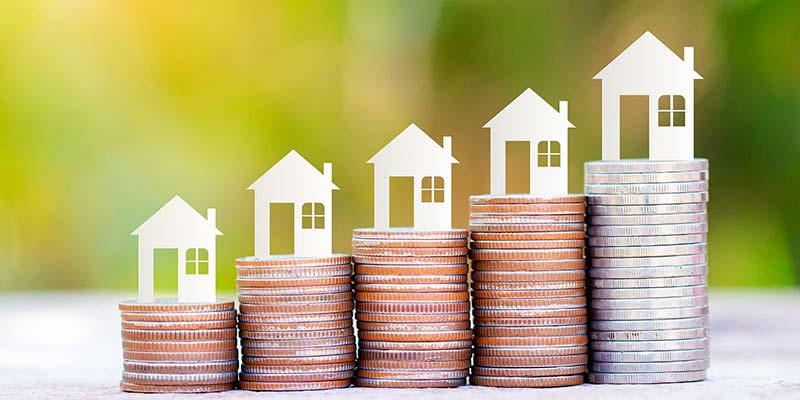

Hi folks! This is a beginners notebook that covers all the main steps necessary to complete a Machine Learning project. Here below you can see a detailed table of contents of the work:

**PREPROCESSING & EDA**

- Importing Libraries & Data
- Dealing with Duplicates and Nan
- Looking at correlations
- Data Normalization (Plots & Tests)


**MODELING**

- Baseline Models with 10-Folds CV
- Best Model (RandomGridSearch)
- Prediction
- Submission

In [24]:
# IMPORTING LIBRARIES & MAIN PATH

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import skew, norm
from sklearn.neighbors import KNeighborsRegressor
%matplotlib inline

import warnings
warnings.filterwarnings(action="ignore")

# Defining the working directories

input_path1 = '../input/house-prices-advanced-regression-techniques/'
input_path2 = '../input/ames-housing-dataset/'

In [25]:
# IMPORTING DATA

house_data = pd.read_csv(input_path2 + 'AmesHousing.csv')
test = pd.read_csv(input_path1 + 'test.csv')
data_w = house_data.copy()
data_w.columns = data_w.columns.str.replace(' ', '') # Replacing the white spaces in columns' names
data_w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Order          2930 non-null   int64  
 1   PID            2930 non-null   int64  
 2   MSSubClass     2930 non-null   int64  
 3   MSZoning       2930 non-null   object 
 4   LotFrontage    2440 non-null   float64
 5   LotArea        2930 non-null   int64  
 6   Street         2930 non-null   object 
 7   Alley          198 non-null    object 
 8   LotShape       2930 non-null   object 
 9   LandContour    2930 non-null   object 
 10  Utilities      2930 non-null   object 
 11  LotConfig      2930 non-null   object 
 12  LandSlope      2930 non-null   object 
 13  Neighborhood   2930 non-null   object 
 14  Condition1     2930 non-null   object 
 15  Condition2     2930 non-null   object 
 16  BldgType       2930 non-null   object 
 17  HouseStyle     2930 non-null   object 
 18  OverallQ

In [26]:
data_w.head()

,Order,PID,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


### EDA & VISUALIZATION

Before working with any kind of data it is important to understand them. A crucial step to this aim is the ***Exploratory data analysis (EDA)***: a combination of visualizations and statistical analysis (uni, bi, and multivariate) that helps us to better understand the data we are working with and to gain insight into their relationships. So, let's explore our target variable and how the other features influence it.

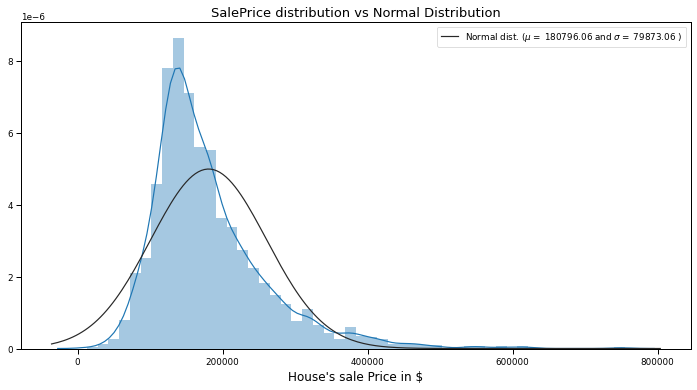

In [27]:
# Getting the main parameters of the Normal Ditribution ()
(mu, sigma) = norm.fit(data_w['SalePrice'])

plt.figure(figsize = (12,6))
sns.distplot(data_w['SalePrice'], kde = True, hist=True, fit = norm)
plt.title('SalePrice distribution vs Normal Distribution', fontsize = 13)
plt.xlabel("House's sale Price in $", fontsize = 12)
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.show()

In literature, acceptable values for skewness are between -0.5 and 0.5 while -2 and 2 for Kurtosis. Looking at the plot, we can clearly see how the distribution does not seem to be normal, but highly right-skewed. The non-normality of our distribution is also supported by the Shapiro test for normality (p-value really small that allows us to reject the hypotesis of normality). Despite that, let's leave it like that for now, we'll deal with that later in the notebook. 

In [28]:
# Skew and kurt
from scipy import stats

shap_t,shap_p = stats.shapiro(data_w['SalePrice'])

print("Skewness: %f" % abs(data_w['SalePrice']).skew())
print("Kurtosis: %f" % abs(data_w['SalePrice']).kurt())
print("Shapiro_Test: %f" % shap_t)
print("Shapiro_Test: %f" % shap_p)

Skewness: 1.743500
Kurtosis: 5.118900
Shapiro_Test: 0.876261
Shapiro_Test: 0.000000


The correlation matrix is the best way to see all the numerical correlation between features. Let's see which are the feature that correlate most with our target variable.

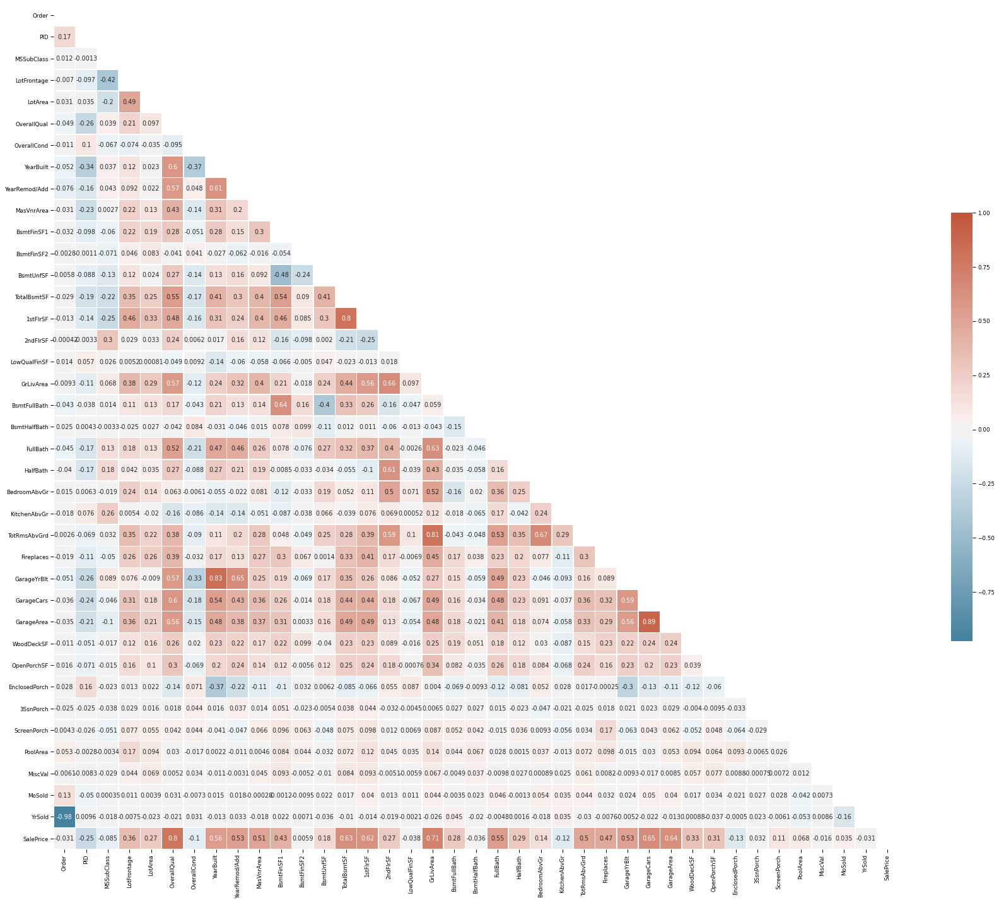

In [29]:
# Correlation Matrix

f, ax = plt.subplots(figsize=(30, 25))
mat = data_w.corr('pearson')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, center=0, annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

Now that we know which features correlates most with our target variable we can investigate them more in depth.

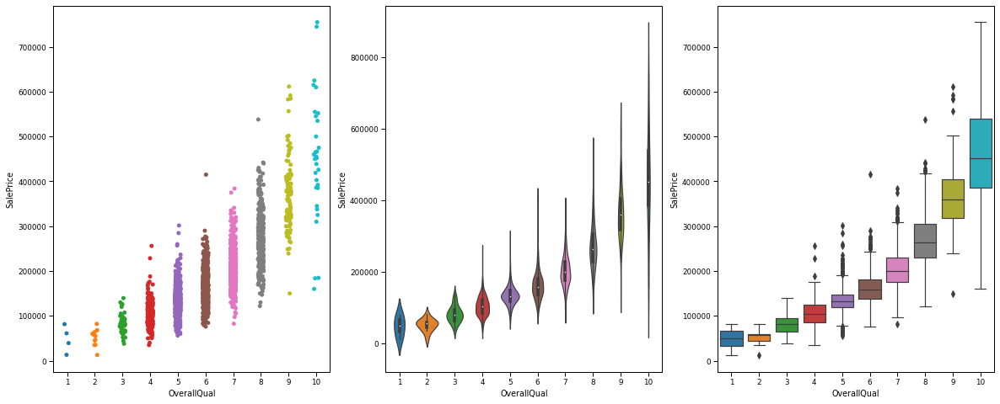

In [30]:
# OverallQuall - SalePrice [Pearson = 0.8]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[2])
plt.show()

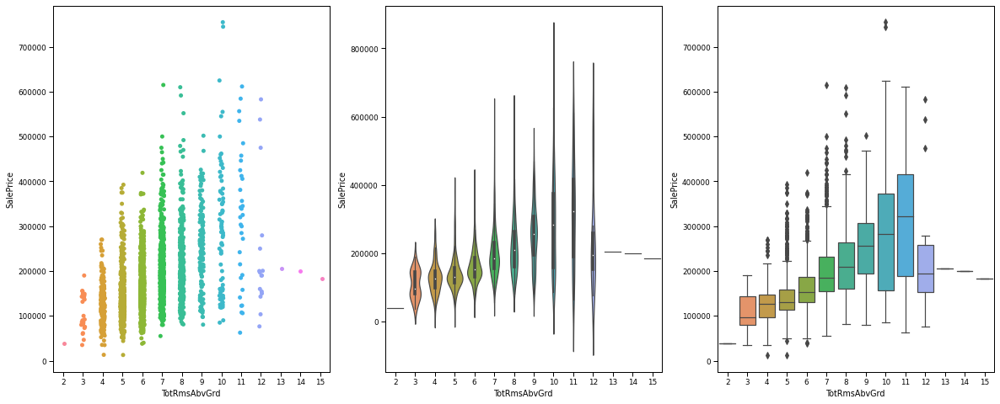

In [31]:
# TotRmsAbvGrd - SalePrice [Pearson = 0.50]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[2])
plt.show()

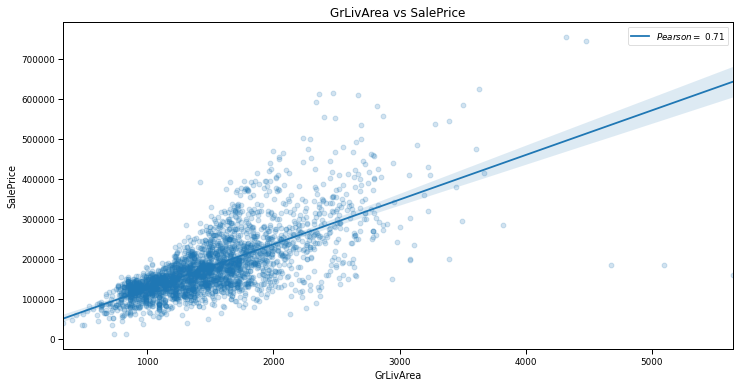

In [32]:
# GrLivArea vs SalePrice [corr = 0.71]

Pearson_GrLiv = 0.71
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'GrLivArea', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('GrLivArea vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_GrLiv)], loc = 'best')
plt.show()

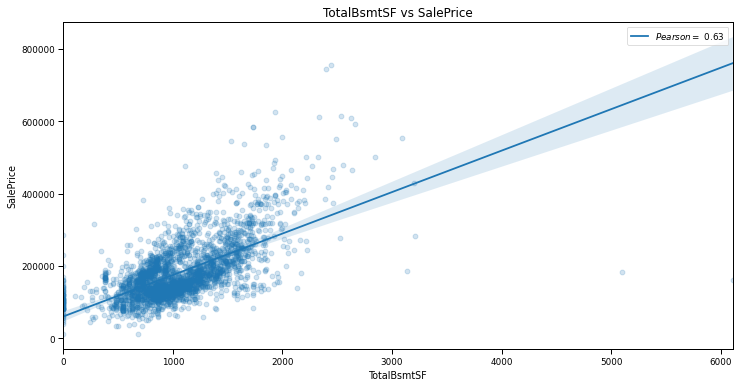

In [33]:
Pearson_TBSF = 0.63
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'TotalBsmtSF', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('TotalBsmtSF vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_TBSF)], loc = 'best')
plt.show()

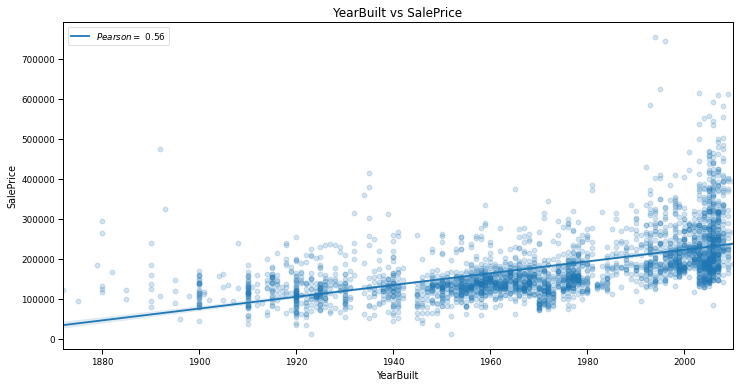

In [34]:
# YearBuilt vs SalePrice

Pearson_YrBlt = 0.56
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'YearBuilt', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('YearBuilt vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_YrBlt)], loc = 'best')
plt.show()

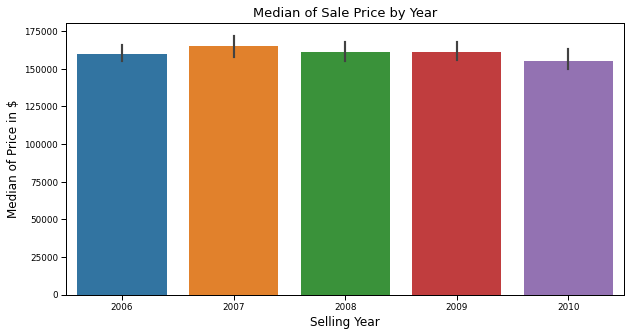

In [35]:
# Median of Sale Price by Year

plt.figure(figsize = (10,5))
sns.barplot(x='YrSold', y="SalePrice", data = data_w, estimator = np.median)
plt.title('Median of Sale Price by Year', fontsize = 13)
plt.xlabel('Selling Year', fontsize = 12)
plt.ylabel('Median of Price in $', fontsize = 12)
plt.show()

###  DATA PREPROCESSING

Now that we have some insights about data, we need to preprocess them for the modeling part. The main steps are:

- Looking at potential NaN
- Dealing with categorical features (e.g. Dummy coding)
- Normalization

N.B:

Usually, in a real-world project, the test data are not available until the end. For this reason, test data should contain the same type of data of the training set to preprocess them in the same way. Here, the test set is available. It contains some observations not present in the training dataset and,the use of dummy coding could raise several issues (I spent a lot of time figuring out why I was not able to make predictions on the test set). The easiest way to solve this problem (that is not applicable if test data are not available) is to concatenate Train and Test sets, preprocess, and divide them again.


In [36]:
# Separating Target and Features

target = data_w['SalePrice']
test_id = test['Id']
test = test.drop(['Id'],axis = 1)
data_w2 = data_w.drop(['SalePrice','Order','PID'], axis = 1)


# Concatenating train & test set

train_test = pd.concat([data_w2,test], axis=0, sort=False)

In [37]:
# Looking at NaN % within the data

nan = pd.DataFrame(train_test.isna().sum(), columns = ['NaN_sum'])
nan['feat'] = nan.index
nan['Perc(%)'] = (nan['NaN_sum']/1460)*100
nan = nan[nan['NaN_sum'] > 0]
nan = nan.sort_values(by = ['NaN_sum'])
nan['Usability'] = np.where(nan['Perc(%)'] > 20, 'Discard', 'Keep')
nan

,NaN_sum,feat,Perc(%),Usability
Exterior1st,1,Exterior1st,0.068493,Keep
Exterior2nd,1,Exterior2nd,0.068493,Keep
KitchenQual,1,KitchenQual,0.068493,Keep
Electrical,1,Electrical,0.068493,Keep
SaleType,1,SaleType,0.068493,Keep
TotalBsmtSF,2,TotalBsmtSF,0.136986,Keep
GarageArea,2,GarageArea,0.136986,Keep
GarageCars,2,GarageCars,0.136986,Keep
Utilities,2,Utilities,0.136986,Keep
Functional,2,Functional,0.136986,Keep


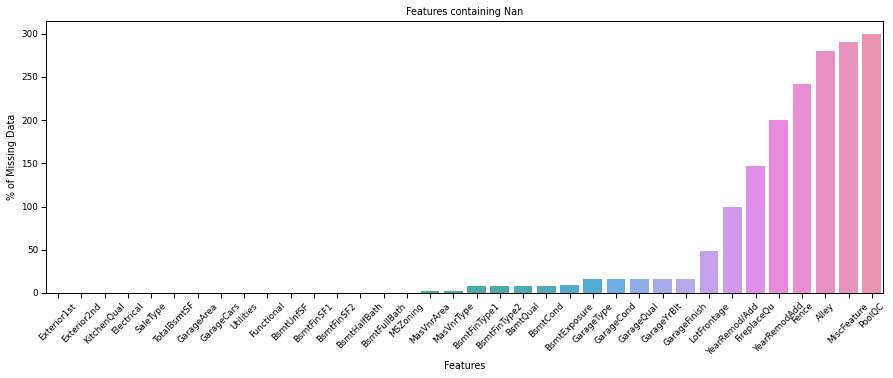

In [38]:
# Plotting Nan

plt.figure(figsize = (15,5))
sns.barplot(x = nan['feat'], y = nan['Perc(%)'])
plt.xticks(rotation=45)
plt.title('Features containing Nan')
plt.xlabel('Features')
plt.ylabel('% of Missing Data')
plt.show()

Are we sure that all these nans are real missing values? Looking at the given description file, we can see how the majority of these nans reflect the absence of something, and for this reason, they are not nans. We can impute them (for numerical features) or substitute them with data in the file:

In [39]:
# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Filling Categorical NaN (That we know how to fill due to the description file )

train_test['Functional'] = train_test['Functional'].fillna('Typ')
train_test['Electrical'] = train_test['Electrical'].fillna("SBrkr")
train_test['KitchenQual'] = train_test['KitchenQual'].fillna("TA")
train_test['Exterior1st'] = train_test['Exterior1st'].fillna(train_test['Exterior1st'].mode()[0])
train_test['Exterior2nd'] = train_test['Exterior2nd'].fillna(train_test['Exterior2nd'].mode()[0])
train_test['SaleType'] = train_test['SaleType'].fillna(train_test['SaleType'].mode()[0])
train_test["PoolQC"] = train_test["PoolQC"].fillna("None")
train_test["Alley"] = train_test["Alley"].fillna("None")
train_test['FireplaceQu'] = train_test['FireplaceQu'].fillna("None")
train_test['Fence'] = train_test['Fence'].fillna("None")
train_test['MiscFeature'] = train_test['MiscFeature'].fillna("None")

for col in ('GarageArea', 'GarageCars'):
    train_test[col] = train_test[col].fillna(0)
        
for col in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    train_test[col] = train_test[col].fillna('None')
    
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    train_test[col] = train_test[col].fillna('None')
    
    # Checking the features with NaN remained out

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

0    RL
0    RH
Name: MSZoning, dtype: object
0    141.0
0     80.0
Name: LotFrontage, dtype: float64
0    AllPub
0    AllPub
Name: Utilities, dtype: object
0    1960.0
0       NaN
Name: YearRemod/Add, dtype: float64
0    Stone
0     None
Name: MasVnrType, dtype: object
0    112.0
0      0.0
Name: MasVnrArea, dtype: float64
0    639.0
0    468.0
Name: BsmtFinSF1, dtype: float64
0      0.0
0    144.0
Name: BsmtFinSF2, dtype: float64
0    441.0
0    270.0
Name: BsmtUnfSF, dtype: float64
0    1080.0
0     882.0
Name: TotalBsmtSF, dtype: float64
0    1.0
0    0.0
Name: BsmtFullBath, dtype: float64
0    0.0
0    0.0
Name: BsmtHalfBath, dtype: float64
0    1960.0
0    1961.0
Name: GarageYrBlt, dtype: float64
0       NaN
0    1961.0
Name: YearRemodAdd, dtype: float64


In [40]:
# Removing the useless variables

useless = ['GarageYrBlt','YearRemodAdd'] 
train_test = train_test.drop(useless, axis = 1)

# Imputing with KnnRegressor (we can also use different Imputers)

def impute_knn(df):
    ttn = train_test.select_dtypes(include=[np.number])
    ttc = train_test.select_dtypes(exclude=[np.number])

    cols_nan = ttn.columns[ttn.isna().any()].tolist()         # columns w/ nan 
    cols_no_nan = ttn.columns.difference(cols_nan).values     # columns w/n nan

    for col in cols_nan:
        imp_test = ttn[ttn[col].isna()]   # indicies which have missing data will become our test set
        imp_train = ttn.dropna()          # all indicies which which have no missing data 
        model = KNeighborsRegressor(n_neighbors=5)  # KNR Unsupervised Approach
        knr = model.fit(imp_train[cols_no_nan], imp_train[col])
        ttn.loc[ttn[col].isna(), col] = knr.predict(imp_test[cols_no_nan])
    
    return pd.concat([ttn,ttc],axis=1)

train_test = impute_knn(train_test)


objects = []
for i in train_test.columns:
    if train_test[i].dtype == object:
        objects.append(i)
train_test.update(train_test[objects].fillna('None'))

# # Checking NaN presence

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

### FEATURE ENGINEERING

Let's create some new features combining the ones that we already have. These could help us to increase the performance of the model!

In [41]:
train_test["SqFtPerRoom"] = train_test["GrLivArea"] / (train_test["TotRmsAbvGrd"] +
                                                       train_test["FullBath"] +
                                                       train_test["HalfBath"] +
                                                       train_test["KitchenAbvGr"])

train_test['Total_Home_Quality'] = train_test['OverallQual'] + train_test['OverallCond']

train_test['Total_Bathrooms'] = (train_test['FullBath'] + (0.5 * train_test['HalfBath']) +
                               train_test['BsmtFullBath'] + (0.5 * train_test['BsmtHalfBath']))

train_test["HighQualSF"] = train_test["1stFlrSF"] + train_test["2ndFlrSF"]

# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Creating dummy variables from categorical features

train_test_dummy = pd.get_dummies(train_test)

# Fetch all numeric features

#train_test['Id'] = train_test['Id'].apply(str)
numeric_features = train_test_dummy.dtypes[train_test_dummy.dtypes != object].index
skewed_features = train_test_dummy[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skewed_features[skewed_features > 0.5]
skew_index = high_skew.index

# Normalize skewed features using log_transformation
    
for i in skew_index:
    train_test_dummy[i] = np.log1p(train_test_dummy[i])

Now let's try to tranform our target distribution into a normal one. To do this we use a log transformation. We will use qq-plot to see the transformation effect.  

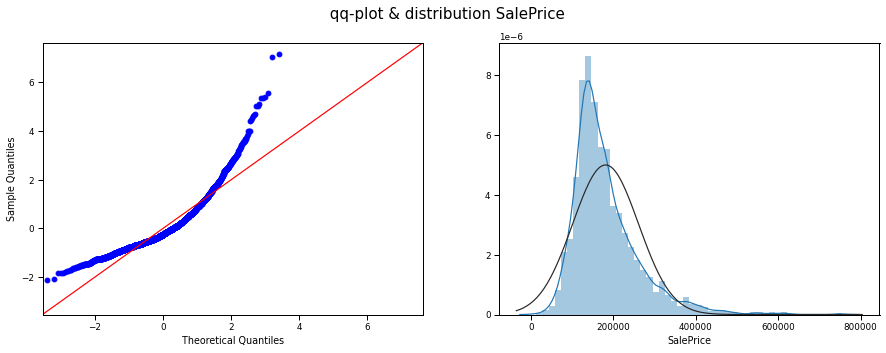

In [42]:
# SalePrice before transformation

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle(" qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])

sns.distplot(target, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

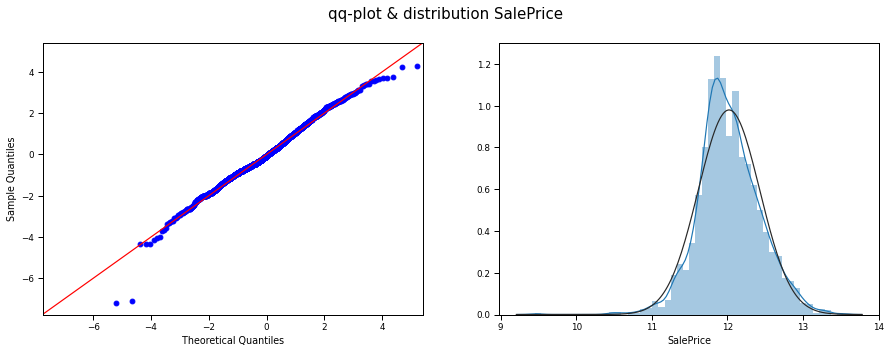

In [43]:
# SalePrice after transformation

target_log = np.log1p(target)

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle("qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target_log, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])
sns.distplot(target_log, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

### MODELING

In [44]:
import shap
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error

In [45]:
# Train-Test separation

train = train_test_dummy[0:2930]
test = train_test_dummy[2930:]
test['Id'] = test_id

# Creation of the RMSE metric:
    
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, train, target_log, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [46]:
# 10 Fold Cross validation

kf = KFold(n_splits=10, random_state=42, shuffle=True)

cv_scores = []
cv_std = []

baseline_models = ['Linear_Reg.','Bayesian_Ridge_Reg.','LGBM_Reg.','SVR',
                   'Dec_Tree_Reg.','Random_Forest_Reg.', 'XGB_Reg.',
                   'Grad_Boost_Reg.','Cat_Boost_Reg.','Stacked_Reg.']

# Linear Regression

lreg = LinearRegression()
score_lreg = cv_rmse(lreg)
cv_scores.append(score_lreg.mean())
cv_std.append(score_lreg.std())

# Bayesian Ridge Regression

brr = BayesianRidge(compute_score=True)
score_brr = cv_rmse(brr)
cv_scores.append(score_brr.mean())
cv_std.append(score_brr.std())

# Light Gradient Boost Regressor

l_gbm = LGBMRegressor(objective='regression')
score_l_gbm = cv_rmse(l_gbm)
cv_scores.append(score_l_gbm.mean())
cv_std.append(score_l_gbm.std())

# Support Vector Regression

svr = SVR()
score_svr = cv_rmse(svr)
cv_scores.append(score_svr.mean())
cv_std.append(score_svr.std())

# Decision Tree Regressor

dtr = DecisionTreeRegressor()
score_dtr = cv_rmse(dtr)
cv_scores.append(score_dtr.mean())
cv_std.append(score_dtr.std())

# Random Forest Regressor

rfr = RandomForestRegressor()
score_rfr = cv_rmse(rfr)
cv_scores.append(score_rfr.mean())
cv_std.append(score_rfr.std())

# XGB Regressor

xgb = xgb.XGBRegressor()
score_xgb = cv_rmse(xgb)
cv_scores.append(score_xgb.mean())
cv_std.append(score_xgb.std())

# Gradient Boost Regressor

gbr = GradientBoostingRegressor()
score_gbr = cv_rmse(gbr)
cv_scores.append(score_gbr.mean())
cv_std.append(score_gbr.std())

# Cat Boost Regressor

catb = CatBoostRegressor()
score_catb = cv_rmse(catb)
cv_scores.append(score_catb.mean())
cv_std.append(score_catb.std())

# Stacked Regressor

stack_gen = StackingRegressor(regressors=(CatBoostRegressor(),
                                          LinearRegression(),
                                          BayesianRidge(),
                                          GradientBoostingRegressor()),
                              meta_regressor = CatBoostRegressor(),
                              use_features_in_secondary = True)

score_stack_gen = cv_rmse(stack_gen)
cv_scores.append(score_stack_gen.mean())
cv_std.append(score_stack_gen.std())

final_cv_score = pd.DataFrame(baseline_models, columns = ['Regressors'])
final_cv_score['RMSE_mean'] = cv_scores
final_cv_score['RMSE_std'] = cv_std

Learning rate set to 0.046383
0:	learn: 0.3920892	total: 59.6ms	remaining: 59.5s
1:	learn: 0.3793890	total: 66.1ms	remaining: 33s
2:	learn: 0.3674435	total: 72.7ms	remaining: 24.2s
3:	learn: 0.3566798	total: 79.3ms	remaining: 19.8s
4:	learn: 0.3466875	total: 85.6ms	remaining: 17s
5:	learn: 0.3364780	total: 92.1ms	remaining: 15.3s
6:	learn: 0.3266689	total: 99.2ms	remaining: 14.1s
7:	learn: 0.3175624	total: 107ms	remaining: 13.2s
8:	learn: 0.3095029	total: 117ms	remaining: 12.8s
9:	learn: 0.3008388	total: 124ms	remaining: 12.2s
10:	learn: 0.2932391	total: 130ms	remaining: 11.7s
11:	learn: 0.2852704	total: 137ms	remaining: 11.2s
12:	learn: 0.2780205	total: 143ms	remaining: 10.8s
13:	learn: 0.2708017	total: 149ms	remaining: 10.5s
14:	learn: 0.2640918	total: 156ms	remaining: 10.2s
15:	learn: 0.2578574	total: 162ms	remaining: 9.96s
16:	learn: 0.2514713	total: 169ms	remaining: 9.74s
17:	learn: 0.2457884	total: 175ms	remaining: 9.57s
18:	learn: 0.2402703	total: 184ms	remaining: 9.51s
19:	lear

165:	learn: 0.1034634	total: 1.18s	remaining: 5.94s
166:	learn: 0.1033211	total: 1.19s	remaining: 5.93s
167:	learn: 0.1032749	total: 1.2s	remaining: 5.92s
168:	learn: 0.1030947	total: 1.2s	remaining: 5.91s
169:	learn: 0.1029421	total: 1.21s	remaining: 5.89s
170:	learn: 0.1029010	total: 1.21s	remaining: 5.88s
171:	learn: 0.1026039	total: 1.22s	remaining: 5.87s
172:	learn: 0.1023886	total: 1.22s	remaining: 5.85s
173:	learn: 0.1022316	total: 1.23s	remaining: 5.84s
174:	learn: 0.1021201	total: 1.24s	remaining: 5.83s
175:	learn: 0.1019149	total: 1.24s	remaining: 5.81s
176:	learn: 0.1016613	total: 1.25s	remaining: 5.8s
177:	learn: 0.1013933	total: 1.25s	remaining: 5.79s
178:	learn: 0.1012090	total: 1.26s	remaining: 5.78s
179:	learn: 0.1010315	total: 1.26s	remaining: 5.76s
180:	learn: 0.1009904	total: 1.27s	remaining: 5.75s
181:	learn: 0.1008591	total: 1.28s	remaining: 5.74s
182:	learn: 0.1008246	total: 1.28s	remaining: 5.74s
183:	learn: 0.1007883	total: 1.29s	remaining: 5.73s
184:	learn: 0.1

347:	learn: 0.0820909	total: 2.37s	remaining: 4.45s
348:	learn: 0.0820766	total: 2.38s	remaining: 4.44s
349:	learn: 0.0820562	total: 2.39s	remaining: 4.44s
350:	learn: 0.0819604	total: 2.4s	remaining: 4.44s
351:	learn: 0.0818848	total: 2.41s	remaining: 4.43s
352:	learn: 0.0817829	total: 2.41s	remaining: 4.42s
353:	learn: 0.0816938	total: 2.42s	remaining: 4.42s
354:	learn: 0.0816046	total: 2.43s	remaining: 4.41s
355:	learn: 0.0814867	total: 2.43s	remaining: 4.4s
356:	learn: 0.0814191	total: 2.44s	remaining: 4.39s
357:	learn: 0.0813031	total: 2.44s	remaining: 4.38s
358:	learn: 0.0812011	total: 2.45s	remaining: 4.38s
359:	learn: 0.0811745	total: 2.46s	remaining: 4.37s
360:	learn: 0.0810641	total: 2.46s	remaining: 4.36s
361:	learn: 0.0809576	total: 2.47s	remaining: 4.36s
362:	learn: 0.0808872	total: 2.48s	remaining: 4.35s
363:	learn: 0.0808406	total: 2.48s	remaining: 4.34s
364:	learn: 0.0807290	total: 2.49s	remaining: 4.33s
365:	learn: 0.0806435	total: 2.5s	remaining: 4.32s
366:	learn: 0.0

528:	learn: 0.0693616	total: 3.57s	remaining: 3.18s
529:	learn: 0.0693525	total: 3.58s	remaining: 3.17s
530:	learn: 0.0693090	total: 3.59s	remaining: 3.17s
531:	learn: 0.0692383	total: 3.59s	remaining: 3.16s
532:	learn: 0.0691650	total: 3.6s	remaining: 3.15s
533:	learn: 0.0691019	total: 3.61s	remaining: 3.15s
534:	learn: 0.0690160	total: 3.61s	remaining: 3.14s
535:	learn: 0.0689598	total: 3.62s	remaining: 3.13s
536:	learn: 0.0689367	total: 3.63s	remaining: 3.13s
537:	learn: 0.0688531	total: 3.63s	remaining: 3.12s
538:	learn: 0.0688044	total: 3.64s	remaining: 3.11s
539:	learn: 0.0687605	total: 3.65s	remaining: 3.1s
540:	learn: 0.0686580	total: 3.65s	remaining: 3.1s
541:	learn: 0.0686024	total: 3.66s	remaining: 3.09s
542:	learn: 0.0685465	total: 3.67s	remaining: 3.09s
543:	learn: 0.0684766	total: 3.68s	remaining: 3.08s
544:	learn: 0.0684228	total: 3.69s	remaining: 3.08s
545:	learn: 0.0683497	total: 3.69s	remaining: 3.07s
546:	learn: 0.0682540	total: 3.7s	remaining: 3.07s
547:	learn: 0.06

703:	learn: 0.0603742	total: 4.77s	remaining: 2s
704:	learn: 0.0603480	total: 4.77s	remaining: 2s
705:	learn: 0.0603176	total: 4.78s	remaining: 1.99s
706:	learn: 0.0602898	total: 4.79s	remaining: 1.98s
707:	learn: 0.0602568	total: 4.79s	remaining: 1.98s
708:	learn: 0.0601745	total: 4.8s	remaining: 1.97s
709:	learn: 0.0601615	total: 4.81s	remaining: 1.96s
710:	learn: 0.0601122	total: 4.81s	remaining: 1.96s
711:	learn: 0.0600676	total: 4.82s	remaining: 1.95s
712:	learn: 0.0600206	total: 4.82s	remaining: 1.94s
713:	learn: 0.0599644	total: 4.83s	remaining: 1.94s
714:	learn: 0.0599558	total: 4.84s	remaining: 1.93s
715:	learn: 0.0599034	total: 4.84s	remaining: 1.92s
716:	learn: 0.0598572	total: 4.85s	remaining: 1.92s
717:	learn: 0.0598098	total: 4.86s	remaining: 1.91s
718:	learn: 0.0597428	total: 4.86s	remaining: 1.9s
719:	learn: 0.0596921	total: 4.87s	remaining: 1.89s
720:	learn: 0.0596521	total: 4.88s	remaining: 1.89s
721:	learn: 0.0596150	total: 4.88s	remaining: 1.88s
722:	learn: 0.059567

881:	learn: 0.0533016	total: 5.97s	remaining: 798ms
882:	learn: 0.0532783	total: 5.97s	remaining: 792ms
883:	learn: 0.0532353	total: 5.98s	remaining: 785ms
884:	learn: 0.0532185	total: 5.99s	remaining: 778ms
885:	learn: 0.0531800	total: 5.99s	remaining: 771ms
886:	learn: 0.0531265	total: 6s	remaining: 764ms
887:	learn: 0.0530857	total: 6.01s	remaining: 758ms
888:	learn: 0.0530755	total: 6.01s	remaining: 751ms
889:	learn: 0.0530352	total: 6.02s	remaining: 744ms
890:	learn: 0.0530203	total: 6.03s	remaining: 737ms
891:	learn: 0.0529916	total: 6.03s	remaining: 730ms
892:	learn: 0.0529689	total: 6.04s	remaining: 724ms
893:	learn: 0.0529152	total: 6.04s	remaining: 717ms
894:	learn: 0.0528669	total: 6.05s	remaining: 710ms
895:	learn: 0.0527884	total: 6.06s	remaining: 703ms
896:	learn: 0.0527371	total: 6.06s	remaining: 696ms
897:	learn: 0.0527145	total: 6.07s	remaining: 690ms
898:	learn: 0.0526852	total: 6.08s	remaining: 683ms
899:	learn: 0.0526282	total: 6.09s	remaining: 676ms
900:	learn: 0.0

50:	learn: 0.1484918	total: 397ms	remaining: 7.39s
51:	learn: 0.1471185	total: 406ms	remaining: 7.39s
52:	learn: 0.1459235	total: 415ms	remaining: 7.41s
53:	learn: 0.1448138	total: 423ms	remaining: 7.4s
54:	learn: 0.1436860	total: 430ms	remaining: 7.39s
55:	learn: 0.1426167	total: 438ms	remaining: 7.38s
56:	learn: 0.1416630	total: 445ms	remaining: 7.37s
57:	learn: 0.1405326	total: 453ms	remaining: 7.35s
58:	learn: 0.1393406	total: 459ms	remaining: 7.33s
59:	learn: 0.1383151	total: 467ms	remaining: 7.32s
60:	learn: 0.1372729	total: 475ms	remaining: 7.31s
61:	learn: 0.1362940	total: 483ms	remaining: 7.31s
62:	learn: 0.1354345	total: 491ms	remaining: 7.31s
63:	learn: 0.1346752	total: 500ms	remaining: 7.32s
64:	learn: 0.1336940	total: 508ms	remaining: 7.31s
65:	learn: 0.1329545	total: 517ms	remaining: 7.32s
66:	learn: 0.1321930	total: 526ms	remaining: 7.32s
67:	learn: 0.1314267	total: 535ms	remaining: 7.33s
68:	learn: 0.1306528	total: 544ms	remaining: 7.33s
69:	learn: 0.1298974	total: 552m

230:	learn: 0.0943215	total: 1.79s	remaining: 5.95s
231:	learn: 0.0942129	total: 1.79s	remaining: 5.93s
232:	learn: 0.0940415	total: 1.8s	remaining: 5.93s
233:	learn: 0.0938529	total: 1.81s	remaining: 5.92s
234:	learn: 0.0937212	total: 1.81s	remaining: 5.91s
235:	learn: 0.0935493	total: 1.82s	remaining: 5.9s
236:	learn: 0.0934045	total: 1.83s	remaining: 5.89s
237:	learn: 0.0932345	total: 1.84s	remaining: 5.88s
238:	learn: 0.0930658	total: 1.84s	remaining: 5.87s
239:	learn: 0.0929390	total: 1.85s	remaining: 5.86s
240:	learn: 0.0927982	total: 1.86s	remaining: 5.85s
241:	learn: 0.0926039	total: 1.86s	remaining: 5.84s
242:	learn: 0.0924932	total: 1.87s	remaining: 5.83s
243:	learn: 0.0923202	total: 1.88s	remaining: 5.82s
244:	learn: 0.0921837	total: 1.88s	remaining: 5.8s
245:	learn: 0.0920121	total: 1.89s	remaining: 5.79s
246:	learn: 0.0919191	total: 1.9s	remaining: 5.78s
247:	learn: 0.0917877	total: 1.9s	remaining: 5.77s
248:	learn: 0.0916704	total: 1.91s	remaining: 5.76s
249:	learn: 0.091

401:	learn: 0.0782454	total: 2.98s	remaining: 4.44s
402:	learn: 0.0781454	total: 2.99s	remaining: 4.43s
403:	learn: 0.0781344	total: 3s	remaining: 4.42s
404:	learn: 0.0780423	total: 3s	remaining: 4.41s
405:	learn: 0.0779682	total: 3.01s	remaining: 4.4s
406:	learn: 0.0779435	total: 3.02s	remaining: 4.39s
407:	learn: 0.0778896	total: 3.02s	remaining: 4.39s
408:	learn: 0.0778792	total: 3.03s	remaining: 4.38s
409:	learn: 0.0778682	total: 3.04s	remaining: 4.37s
410:	learn: 0.0777530	total: 3.04s	remaining: 4.36s
411:	learn: 0.0776812	total: 3.05s	remaining: 4.35s
412:	learn: 0.0776305	total: 3.06s	remaining: 4.34s
413:	learn: 0.0775574	total: 3.06s	remaining: 4.33s
414:	learn: 0.0774793	total: 3.07s	remaining: 4.33s
415:	learn: 0.0774240	total: 3.07s	remaining: 4.32s
416:	learn: 0.0773216	total: 3.08s	remaining: 4.31s
417:	learn: 0.0772491	total: 3.09s	remaining: 4.3s
418:	learn: 0.0771478	total: 3.09s	remaining: 4.29s
419:	learn: 0.0770380	total: 3.1s	remaining: 4.28s
420:	learn: 0.0769494

578:	learn: 0.0667289	total: 4.18s	remaining: 3.04s
579:	learn: 0.0666653	total: 4.18s	remaining: 3.03s
580:	learn: 0.0665970	total: 4.19s	remaining: 3.02s
581:	learn: 0.0665237	total: 4.2s	remaining: 3.02s
582:	learn: 0.0664483	total: 4.2s	remaining: 3.01s
583:	learn: 0.0664413	total: 4.21s	remaining: 3s
584:	learn: 0.0663578	total: 4.22s	remaining: 2.99s
585:	learn: 0.0663074	total: 4.22s	remaining: 2.98s
586:	learn: 0.0662529	total: 4.23s	remaining: 2.98s
587:	learn: 0.0662041	total: 4.24s	remaining: 2.97s
588:	learn: 0.0661319	total: 4.24s	remaining: 2.96s
589:	learn: 0.0660757	total: 4.25s	remaining: 2.95s
590:	learn: 0.0659954	total: 4.26s	remaining: 2.94s
591:	learn: 0.0659275	total: 4.26s	remaining: 2.94s
592:	learn: 0.0658538	total: 4.27s	remaining: 2.93s
593:	learn: 0.0658104	total: 4.28s	remaining: 2.92s
594:	learn: 0.0657787	total: 4.28s	remaining: 2.92s
595:	learn: 0.0656997	total: 4.29s	remaining: 2.91s
596:	learn: 0.0656529	total: 4.3s	remaining: 2.9s
597:	learn: 0.06564

755:	learn: 0.0577429	total: 5.37s	remaining: 1.73s
756:	learn: 0.0576933	total: 5.38s	remaining: 1.73s
757:	learn: 0.0576291	total: 5.39s	remaining: 1.72s
758:	learn: 0.0575678	total: 5.39s	remaining: 1.71s
759:	learn: 0.0575012	total: 5.4s	remaining: 1.71s
760:	learn: 0.0574663	total: 5.41s	remaining: 1.7s
761:	learn: 0.0574458	total: 5.41s	remaining: 1.69s
762:	learn: 0.0573953	total: 5.42s	remaining: 1.68s
763:	learn: 0.0573474	total: 5.43s	remaining: 1.68s
764:	learn: 0.0572626	total: 5.43s	remaining: 1.67s
765:	learn: 0.0572097	total: 5.44s	remaining: 1.66s
766:	learn: 0.0571788	total: 5.45s	remaining: 1.65s
767:	learn: 0.0571385	total: 5.45s	remaining: 1.65s
768:	learn: 0.0570678	total: 5.46s	remaining: 1.64s
769:	learn: 0.0570043	total: 5.46s	remaining: 1.63s
770:	learn: 0.0569780	total: 5.47s	remaining: 1.63s
771:	learn: 0.0569440	total: 5.48s	remaining: 1.62s
772:	learn: 0.0568946	total: 5.48s	remaining: 1.61s
773:	learn: 0.0568600	total: 5.49s	remaining: 1.6s
774:	learn: 0.0

932:	learn: 0.0507983	total: 6.56s	remaining: 471ms
933:	learn: 0.0507683	total: 6.57s	remaining: 464ms
934:	learn: 0.0507067	total: 6.58s	remaining: 457ms
935:	learn: 0.0506715	total: 6.58s	remaining: 450ms
936:	learn: 0.0506162	total: 6.59s	remaining: 443ms
937:	learn: 0.0505625	total: 6.59s	remaining: 436ms
938:	learn: 0.0505127	total: 6.6s	remaining: 429ms
939:	learn: 0.0504680	total: 6.61s	remaining: 422ms
940:	learn: 0.0504321	total: 6.61s	remaining: 415ms
941:	learn: 0.0504112	total: 6.62s	remaining: 407ms
942:	learn: 0.0503848	total: 6.62s	remaining: 400ms
943:	learn: 0.0503366	total: 6.63s	remaining: 393ms
944:	learn: 0.0502771	total: 6.64s	remaining: 386ms
945:	learn: 0.0502412	total: 6.64s	remaining: 379ms
946:	learn: 0.0502045	total: 6.65s	remaining: 372ms
947:	learn: 0.0501492	total: 6.66s	remaining: 365ms
948:	learn: 0.0501001	total: 6.66s	remaining: 358ms
949:	learn: 0.0500695	total: 6.67s	remaining: 351ms
950:	learn: 0.0500487	total: 6.67s	remaining: 344ms
951:	learn: 0

104:	learn: 0.1140100	total: 999ms	remaining: 8.52s
105:	learn: 0.1137512	total: 1.01s	remaining: 8.51s
106:	learn: 0.1134760	total: 1.02s	remaining: 8.49s
107:	learn: 0.1132118	total: 1.02s	remaining: 8.47s
108:	learn: 0.1129244	total: 1.03s	remaining: 8.45s
109:	learn: 0.1126161	total: 1.04s	remaining: 8.43s
110:	learn: 0.1123779	total: 1.05s	remaining: 8.4s
111:	learn: 0.1120490	total: 1.06s	remaining: 8.38s
112:	learn: 0.1119964	total: 1.06s	remaining: 8.36s
113:	learn: 0.1117557	total: 1.07s	remaining: 8.34s
114:	learn: 0.1115084	total: 1.08s	remaining: 8.33s
115:	learn: 0.1114489	total: 1.09s	remaining: 8.34s
116:	learn: 0.1111418	total: 1.1s	remaining: 8.32s
117:	learn: 0.1109089	total: 1.11s	remaining: 8.32s
118:	learn: 0.1107249	total: 1.12s	remaining: 8.3s
119:	learn: 0.1104388	total: 1.13s	remaining: 8.28s
120:	learn: 0.1102079	total: 1.14s	remaining: 8.26s
121:	learn: 0.1098705	total: 1.14s	remaining: 8.23s
122:	learn: 0.1097030	total: 1.15s	remaining: 8.2s
123:	learn: 0.10

270:	learn: 0.0883247	total: 2.19s	remaining: 5.9s
271:	learn: 0.0882814	total: 2.2s	remaining: 5.89s
272:	learn: 0.0881481	total: 2.21s	remaining: 5.88s
273:	learn: 0.0880250	total: 2.22s	remaining: 5.87s
274:	learn: 0.0879211	total: 2.22s	remaining: 5.86s
275:	learn: 0.0878628	total: 2.23s	remaining: 5.85s
276:	learn: 0.0878096	total: 2.24s	remaining: 5.84s
277:	learn: 0.0876723	total: 2.24s	remaining: 5.83s
278:	learn: 0.0876483	total: 2.25s	remaining: 5.81s
279:	learn: 0.0875650	total: 2.25s	remaining: 5.8s
280:	learn: 0.0874794	total: 2.26s	remaining: 5.78s
281:	learn: 0.0873835	total: 2.27s	remaining: 5.77s
282:	learn: 0.0872447	total: 2.27s	remaining: 5.76s
283:	learn: 0.0871109	total: 2.28s	remaining: 5.75s
284:	learn: 0.0870887	total: 2.28s	remaining: 5.73s
285:	learn: 0.0869381	total: 2.29s	remaining: 5.72s
286:	learn: 0.0868239	total: 2.3s	remaining: 5.71s
287:	learn: 0.0867140	total: 2.31s	remaining: 5.7s
288:	learn: 0.0866639	total: 2.31s	remaining: 5.7s
289:	learn: 0.0866

449:	learn: 0.0730007	total: 3.39s	remaining: 4.14s
450:	learn: 0.0728900	total: 3.4s	remaining: 4.13s
451:	learn: 0.0728274	total: 3.4s	remaining: 4.13s
452:	learn: 0.0727559	total: 3.41s	remaining: 4.12s
453:	learn: 0.0727023	total: 3.42s	remaining: 4.11s
454:	learn: 0.0726011	total: 3.42s	remaining: 4.1s
455:	learn: 0.0725861	total: 3.43s	remaining: 4.09s
456:	learn: 0.0725092	total: 3.43s	remaining: 4.08s
457:	learn: 0.0724408	total: 3.44s	remaining: 4.07s
458:	learn: 0.0723662	total: 3.45s	remaining: 4.07s
459:	learn: 0.0723271	total: 3.46s	remaining: 4.06s
460:	learn: 0.0722957	total: 3.46s	remaining: 4.05s
461:	learn: 0.0722538	total: 3.47s	remaining: 4.04s
462:	learn: 0.0722162	total: 3.48s	remaining: 4.03s
463:	learn: 0.0721937	total: 3.48s	remaining: 4.02s
464:	learn: 0.0721380	total: 3.49s	remaining: 4.01s
465:	learn: 0.0720262	total: 3.5s	remaining: 4s
466:	learn: 0.0719673	total: 3.5s	remaining: 4s
467:	learn: 0.0718584	total: 3.51s	remaining: 3.99s
468:	learn: 0.0718188	t

628:	learn: 0.0625238	total: 4.58s	remaining: 2.7s
629:	learn: 0.0624208	total: 4.58s	remaining: 2.69s
630:	learn: 0.0624106	total: 4.59s	remaining: 2.69s
631:	learn: 0.0623545	total: 4.6s	remaining: 2.68s
632:	learn: 0.0623109	total: 4.6s	remaining: 2.67s
633:	learn: 0.0622457	total: 4.61s	remaining: 2.66s
634:	learn: 0.0621767	total: 4.62s	remaining: 2.65s
635:	learn: 0.0620943	total: 4.63s	remaining: 2.65s
636:	learn: 0.0620260	total: 4.63s	remaining: 2.64s
637:	learn: 0.0619726	total: 4.64s	remaining: 2.63s
638:	learn: 0.0618773	total: 4.64s	remaining: 2.62s
639:	learn: 0.0618037	total: 4.65s	remaining: 2.62s
640:	learn: 0.0617367	total: 4.66s	remaining: 2.61s
641:	learn: 0.0616926	total: 4.66s	remaining: 2.6s
642:	learn: 0.0616532	total: 4.67s	remaining: 2.59s
643:	learn: 0.0616104	total: 4.67s	remaining: 2.58s
644:	learn: 0.0615530	total: 4.68s	remaining: 2.58s
645:	learn: 0.0615110	total: 4.69s	remaining: 2.57s
646:	learn: 0.0614629	total: 4.69s	remaining: 2.56s
647:	learn: 0.06

806:	learn: 0.0542037	total: 5.78s	remaining: 1.38s
807:	learn: 0.0541753	total: 5.79s	remaining: 1.38s
808:	learn: 0.0541198	total: 5.8s	remaining: 1.37s
809:	learn: 0.0541079	total: 5.8s	remaining: 1.36s
810:	learn: 0.0540698	total: 5.81s	remaining: 1.35s
811:	learn: 0.0540241	total: 5.82s	remaining: 1.35s
812:	learn: 0.0540187	total: 5.82s	remaining: 1.34s
813:	learn: 0.0539591	total: 5.83s	remaining: 1.33s
814:	learn: 0.0539262	total: 5.84s	remaining: 1.32s
815:	learn: 0.0538957	total: 5.84s	remaining: 1.32s
816:	learn: 0.0538920	total: 5.85s	remaining: 1.31s
817:	learn: 0.0538444	total: 5.86s	remaining: 1.3s
818:	learn: 0.0538135	total: 5.86s	remaining: 1.29s
819:	learn: 0.0537546	total: 5.87s	remaining: 1.29s
820:	learn: 0.0537509	total: 5.87s	remaining: 1.28s
821:	learn: 0.0537084	total: 5.88s	remaining: 1.27s
822:	learn: 0.0536756	total: 5.89s	remaining: 1.27s
823:	learn: 0.0536384	total: 5.89s	remaining: 1.26s
824:	learn: 0.0535826	total: 5.9s	remaining: 1.25s
825:	learn: 0.05

981:	learn: 0.0481119	total: 6.97s	remaining: 128ms
982:	learn: 0.0480790	total: 6.98s	remaining: 121ms
983:	learn: 0.0480305	total: 6.99s	remaining: 114ms
984:	learn: 0.0479766	total: 6.99s	remaining: 107ms
985:	learn: 0.0479570	total: 7s	remaining: 99.4ms
986:	learn: 0.0479130	total: 7.01s	remaining: 92.3ms
987:	learn: 0.0478698	total: 7.01s	remaining: 85.2ms
988:	learn: 0.0478259	total: 7.02s	remaining: 78.1ms
989:	learn: 0.0477757	total: 7.03s	remaining: 71ms
990:	learn: 0.0477530	total: 7.03s	remaining: 63.9ms
991:	learn: 0.0477270	total: 7.04s	remaining: 56.8ms
992:	learn: 0.0477240	total: 7.05s	remaining: 49.7ms
993:	learn: 0.0477075	total: 7.05s	remaining: 42.6ms
994:	learn: 0.0476718	total: 7.06s	remaining: 35.5ms
995:	learn: 0.0476690	total: 7.07s	remaining: 28.4ms
996:	learn: 0.0476298	total: 7.07s	remaining: 21.3ms
997:	learn: 0.0475811	total: 7.08s	remaining: 14.2ms
998:	learn: 0.0475416	total: 7.08s	remaining: 7.09ms
999:	learn: 0.0475320	total: 7.09s	remaining: 0us
Learn

153:	learn: 0.1018102	total: 1.2s	remaining: 6.59s
154:	learn: 0.1017479	total: 1.21s	remaining: 6.59s
155:	learn: 0.1017051	total: 1.22s	remaining: 6.58s
156:	learn: 0.1016690	total: 1.22s	remaining: 6.57s
157:	learn: 0.1016344	total: 1.23s	remaining: 6.57s
158:	learn: 0.1014901	total: 1.24s	remaining: 6.57s
159:	learn: 0.1012663	total: 1.25s	remaining: 6.55s
160:	learn: 0.1010910	total: 1.26s	remaining: 6.54s
161:	learn: 0.1009147	total: 1.26s	remaining: 6.54s
162:	learn: 0.1007455	total: 1.27s	remaining: 6.54s
163:	learn: 0.1005371	total: 1.28s	remaining: 6.54s
164:	learn: 0.1004902	total: 1.29s	remaining: 6.53s
165:	learn: 0.1003056	total: 1.3s	remaining: 6.53s
166:	learn: 0.1001771	total: 1.31s	remaining: 6.52s
167:	learn: 0.0999733	total: 1.31s	remaining: 6.51s
168:	learn: 0.0998078	total: 1.32s	remaining: 6.5s
169:	learn: 0.0996625	total: 1.33s	remaining: 6.49s
170:	learn: 0.0994794	total: 1.34s	remaining: 6.49s
171:	learn: 0.0992907	total: 1.34s	remaining: 6.47s
172:	learn: 0.0

324:	learn: 0.0825491	total: 2.39s	remaining: 4.96s
325:	learn: 0.0824420	total: 2.4s	remaining: 4.96s
326:	learn: 0.0823709	total: 2.4s	remaining: 4.95s
327:	learn: 0.0823566	total: 2.41s	remaining: 4.94s
328:	learn: 0.0822181	total: 2.42s	remaining: 4.93s
329:	learn: 0.0821039	total: 2.42s	remaining: 4.92s
330:	learn: 0.0819703	total: 2.43s	remaining: 4.91s
331:	learn: 0.0818674	total: 2.43s	remaining: 4.89s
332:	learn: 0.0817147	total: 2.44s	remaining: 4.88s
333:	learn: 0.0816464	total: 2.44s	remaining: 4.88s
334:	learn: 0.0815327	total: 2.45s	remaining: 4.87s
335:	learn: 0.0814586	total: 2.46s	remaining: 4.86s
336:	learn: 0.0813488	total: 2.46s	remaining: 4.85s
337:	learn: 0.0812040	total: 2.47s	remaining: 4.84s
338:	learn: 0.0811498	total: 2.48s	remaining: 4.83s
339:	learn: 0.0810691	total: 2.48s	remaining: 4.82s
340:	learn: 0.0810011	total: 2.49s	remaining: 4.81s
341:	learn: 0.0809177	total: 2.5s	remaining: 4.8s
342:	learn: 0.0807925	total: 2.5s	remaining: 4.79s
343:	learn: 0.080

498:	learn: 0.0689357	total: 3.59s	remaining: 3.6s
499:	learn: 0.0688468	total: 3.6s	remaining: 3.6s
500:	learn: 0.0687516	total: 3.6s	remaining: 3.59s
501:	learn: 0.0686691	total: 3.61s	remaining: 3.58s
502:	learn: 0.0685894	total: 3.61s	remaining: 3.57s
503:	learn: 0.0685087	total: 3.62s	remaining: 3.56s
504:	learn: 0.0685017	total: 3.63s	remaining: 3.56s
505:	learn: 0.0684330	total: 3.63s	remaining: 3.55s
506:	learn: 0.0683751	total: 3.64s	remaining: 3.54s
507:	learn: 0.0683330	total: 3.65s	remaining: 3.53s
508:	learn: 0.0682435	total: 3.65s	remaining: 3.52s
509:	learn: 0.0681642	total: 3.66s	remaining: 3.51s
510:	learn: 0.0680997	total: 3.66s	remaining: 3.51s
511:	learn: 0.0680331	total: 3.67s	remaining: 3.5s
512:	learn: 0.0679697	total: 3.68s	remaining: 3.49s
513:	learn: 0.0679234	total: 3.68s	remaining: 3.48s
514:	learn: 0.0678451	total: 3.69s	remaining: 3.47s
515:	learn: 0.0678339	total: 3.69s	remaining: 3.46s
516:	learn: 0.0677722	total: 3.7s	remaining: 3.46s
517:	learn: 0.0677

681:	learn: 0.0584424	total: 4.79s	remaining: 2.23s
682:	learn: 0.0584023	total: 4.79s	remaining: 2.23s
683:	learn: 0.0583646	total: 4.8s	remaining: 2.22s
684:	learn: 0.0583130	total: 4.81s	remaining: 2.21s
685:	learn: 0.0582891	total: 4.82s	remaining: 2.21s
686:	learn: 0.0582374	total: 4.82s	remaining: 2.2s
687:	learn: 0.0581945	total: 4.83s	remaining: 2.19s
688:	learn: 0.0581899	total: 4.84s	remaining: 2.18s
689:	learn: 0.0581329	total: 4.84s	remaining: 2.17s
690:	learn: 0.0580961	total: 4.85s	remaining: 2.17s
691:	learn: 0.0580541	total: 4.86s	remaining: 2.16s
692:	learn: 0.0580495	total: 4.86s	remaining: 2.15s
693:	learn: 0.0580126	total: 4.87s	remaining: 2.15s
694:	learn: 0.0579579	total: 4.87s	remaining: 2.14s
695:	learn: 0.0579305	total: 4.88s	remaining: 2.13s
696:	learn: 0.0578674	total: 4.89s	remaining: 2.12s
697:	learn: 0.0578226	total: 4.89s	remaining: 2.12s
698:	learn: 0.0577830	total: 4.9s	remaining: 2.11s
699:	learn: 0.0577450	total: 4.91s	remaining: 2.1s
700:	learn: 0.05

859:	learn: 0.0506214	total: 5.97s	remaining: 972ms
860:	learn: 0.0505887	total: 5.98s	remaining: 965ms
861:	learn: 0.0505297	total: 5.99s	remaining: 958ms
862:	learn: 0.0504885	total: 5.99s	remaining: 951ms
863:	learn: 0.0504395	total: 6s	remaining: 944ms
864:	learn: 0.0503834	total: 6s	remaining: 937ms
865:	learn: 0.0503450	total: 6.01s	remaining: 930ms
866:	learn: 0.0502894	total: 6.02s	remaining: 923ms
867:	learn: 0.0502542	total: 6.02s	remaining: 916ms
868:	learn: 0.0502122	total: 6.03s	remaining: 909ms
869:	learn: 0.0501713	total: 6.04s	remaining: 902ms
870:	learn: 0.0501030	total: 6.04s	remaining: 895ms
871:	learn: 0.0500497	total: 6.05s	remaining: 888ms
872:	learn: 0.0500187	total: 6.05s	remaining: 881ms
873:	learn: 0.0499886	total: 6.06s	remaining: 874ms
874:	learn: 0.0499568	total: 6.07s	remaining: 867ms
875:	learn: 0.0499144	total: 6.07s	remaining: 860ms
876:	learn: 0.0499112	total: 6.08s	remaining: 853ms
877:	learn: 0.0498593	total: 6.09s	remaining: 846ms
878:	learn: 0.0498

25:	learn: 0.2057278	total: 197ms	remaining: 7.36s
26:	learn: 0.2021102	total: 205ms	remaining: 7.39s
27:	learn: 0.1984602	total: 212ms	remaining: 7.36s
28:	learn: 0.1948299	total: 219ms	remaining: 7.33s
29:	learn: 0.1911651	total: 227ms	remaining: 7.33s
30:	learn: 0.1878412	total: 234ms	remaining: 7.31s
31:	learn: 0.1845671	total: 241ms	remaining: 7.28s
32:	learn: 0.1817795	total: 248ms	remaining: 7.26s
33:	learn: 0.1790597	total: 256ms	remaining: 7.26s
34:	learn: 0.1761684	total: 263ms	remaining: 7.25s
35:	learn: 0.1736737	total: 271ms	remaining: 7.25s
36:	learn: 0.1711171	total: 278ms	remaining: 7.24s
37:	learn: 0.1686460	total: 286ms	remaining: 7.24s
38:	learn: 0.1664002	total: 293ms	remaining: 7.22s
39:	learn: 0.1643434	total: 300ms	remaining: 7.21s
40:	learn: 0.1619615	total: 306ms	remaining: 7.15s
41:	learn: 0.1600597	total: 314ms	remaining: 7.15s
42:	learn: 0.1582975	total: 320ms	remaining: 7.13s
43:	learn: 0.1564876	total: 327ms	remaining: 7.12s
44:	learn: 0.1548612	total: 334

186:	learn: 0.0966362	total: 1.4s	remaining: 6.08s
187:	learn: 0.0964991	total: 1.41s	remaining: 6.07s
188:	learn: 0.0964609	total: 1.41s	remaining: 6.07s
189:	learn: 0.0962259	total: 1.42s	remaining: 6.06s
190:	learn: 0.0961026	total: 1.43s	remaining: 6.06s
191:	learn: 0.0959288	total: 1.44s	remaining: 6.04s
192:	learn: 0.0957849	total: 1.44s	remaining: 6.04s
193:	learn: 0.0956846	total: 1.45s	remaining: 6.03s
194:	learn: 0.0955716	total: 1.46s	remaining: 6.02s
195:	learn: 0.0953812	total: 1.46s	remaining: 6.01s
196:	learn: 0.0952375	total: 1.47s	remaining: 6s
197:	learn: 0.0950684	total: 1.48s	remaining: 5.99s
198:	learn: 0.0949638	total: 1.48s	remaining: 5.97s
199:	learn: 0.0949257	total: 1.49s	remaining: 5.96s
200:	learn: 0.0948649	total: 1.5s	remaining: 5.95s
201:	learn: 0.0947679	total: 1.5s	remaining: 5.94s
202:	learn: 0.0945990	total: 1.51s	remaining: 5.93s
203:	learn: 0.0944334	total: 1.52s	remaining: 5.92s
204:	learn: 0.0942552	total: 1.52s	remaining: 5.92s
205:	learn: 0.0940

362:	learn: 0.0782491	total: 2.6s	remaining: 4.56s
363:	learn: 0.0781941	total: 2.6s	remaining: 4.55s
364:	learn: 0.0781174	total: 2.61s	remaining: 4.54s
365:	learn: 0.0780287	total: 2.62s	remaining: 4.53s
366:	learn: 0.0779677	total: 2.62s	remaining: 4.52s
367:	learn: 0.0778703	total: 2.63s	remaining: 4.51s
368:	learn: 0.0777595	total: 2.63s	remaining: 4.5s
369:	learn: 0.0776555	total: 2.64s	remaining: 4.49s
370:	learn: 0.0776049	total: 2.65s	remaining: 4.49s
371:	learn: 0.0775358	total: 2.65s	remaining: 4.48s
372:	learn: 0.0774476	total: 2.66s	remaining: 4.47s
373:	learn: 0.0773698	total: 2.67s	remaining: 4.46s
374:	learn: 0.0772724	total: 2.67s	remaining: 4.46s
375:	learn: 0.0771478	total: 2.68s	remaining: 4.45s
376:	learn: 0.0770375	total: 2.69s	remaining: 4.44s
377:	learn: 0.0770100	total: 2.69s	remaining: 4.43s
378:	learn: 0.0769110	total: 2.7s	remaining: 4.42s
379:	learn: 0.0768265	total: 2.71s	remaining: 4.42s
380:	learn: 0.0767249	total: 2.71s	remaining: 4.41s
381:	learn: 0.07

539:	learn: 0.0665522	total: 3.77s	remaining: 3.21s
540:	learn: 0.0665020	total: 3.78s	remaining: 3.21s
541:	learn: 0.0664417	total: 3.79s	remaining: 3.2s
542:	learn: 0.0663787	total: 3.79s	remaining: 3.19s
543:	learn: 0.0663070	total: 3.8s	remaining: 3.19s
544:	learn: 0.0662756	total: 3.81s	remaining: 3.18s
545:	learn: 0.0661867	total: 3.81s	remaining: 3.17s
546:	learn: 0.0661793	total: 3.82s	remaining: 3.16s
547:	learn: 0.0661337	total: 3.83s	remaining: 3.16s
548:	learn: 0.0661053	total: 3.84s	remaining: 3.15s
549:	learn: 0.0660437	total: 3.84s	remaining: 3.15s
550:	learn: 0.0659826	total: 3.85s	remaining: 3.14s
551:	learn: 0.0658739	total: 3.86s	remaining: 3.13s
552:	learn: 0.0658275	total: 3.86s	remaining: 3.12s
553:	learn: 0.0657748	total: 3.87s	remaining: 3.12s
554:	learn: 0.0657632	total: 3.88s	remaining: 3.11s
555:	learn: 0.0656973	total: 3.88s	remaining: 3.1s
556:	learn: 0.0656245	total: 3.89s	remaining: 3.09s
557:	learn: 0.0655875	total: 3.89s	remaining: 3.08s
558:	learn: 0.0

717:	learn: 0.0577113	total: 4.96s	remaining: 1.95s
718:	learn: 0.0576513	total: 4.97s	remaining: 1.94s
719:	learn: 0.0576133	total: 4.98s	remaining: 1.94s
720:	learn: 0.0575676	total: 4.99s	remaining: 1.93s
721:	learn: 0.0575153	total: 4.99s	remaining: 1.92s
722:	learn: 0.0574691	total: 5s	remaining: 1.92s
723:	learn: 0.0574642	total: 5.01s	remaining: 1.91s
724:	learn: 0.0574011	total: 5.01s	remaining: 1.9s
725:	learn: 0.0573870	total: 5.02s	remaining: 1.89s
726:	learn: 0.0573305	total: 5.02s	remaining: 1.89s
727:	learn: 0.0573096	total: 5.03s	remaining: 1.88s
728:	learn: 0.0572454	total: 5.04s	remaining: 1.87s
729:	learn: 0.0572407	total: 5.04s	remaining: 1.86s
730:	learn: 0.0572090	total: 5.05s	remaining: 1.86s
731:	learn: 0.0572052	total: 5.05s	remaining: 1.85s
732:	learn: 0.0571779	total: 5.06s	remaining: 1.84s
733:	learn: 0.0571259	total: 5.07s	remaining: 1.84s
734:	learn: 0.0570786	total: 5.07s	remaining: 1.83s
735:	learn: 0.0570061	total: 5.08s	remaining: 1.82s
736:	learn: 0.05

899:	learn: 0.0505245	total: 6.16s	remaining: 685ms
900:	learn: 0.0504930	total: 6.17s	remaining: 678ms
901:	learn: 0.0504668	total: 6.18s	remaining: 671ms
902:	learn: 0.0504468	total: 6.18s	remaining: 664ms
903:	learn: 0.0504357	total: 6.19s	remaining: 657ms
904:	learn: 0.0504087	total: 6.2s	remaining: 651ms
905:	learn: 0.0503957	total: 6.2s	remaining: 644ms
906:	learn: 0.0503505	total: 6.21s	remaining: 637ms
907:	learn: 0.0503061	total: 6.22s	remaining: 630ms
908:	learn: 0.0503031	total: 6.22s	remaining: 623ms
909:	learn: 0.0502403	total: 6.23s	remaining: 616ms
910:	learn: 0.0501797	total: 6.24s	remaining: 609ms
911:	learn: 0.0501295	total: 6.24s	remaining: 602ms
912:	learn: 0.0500977	total: 6.25s	remaining: 595ms
913:	learn: 0.0500699	total: 6.25s	remaining: 589ms
914:	learn: 0.0500667	total: 6.26s	remaining: 582ms
915:	learn: 0.0500131	total: 6.27s	remaining: 575ms
916:	learn: 0.0500098	total: 6.27s	remaining: 568ms
917:	learn: 0.0499549	total: 6.28s	remaining: 561ms
918:	learn: 0.

82:	learn: 0.1195970	total: 599ms	remaining: 6.62s
83:	learn: 0.1191585	total: 607ms	remaining: 6.62s
84:	learn: 0.1187537	total: 616ms	remaining: 6.63s
85:	learn: 0.1183035	total: 624ms	remaining: 6.63s
86:	learn: 0.1179371	total: 632ms	remaining: 6.63s
87:	learn: 0.1174938	total: 640ms	remaining: 6.63s
88:	learn: 0.1170404	total: 647ms	remaining: 6.62s
89:	learn: 0.1165765	total: 654ms	remaining: 6.61s
90:	learn: 0.1161244	total: 661ms	remaining: 6.6s
91:	learn: 0.1158142	total: 667ms	remaining: 6.59s
92:	learn: 0.1153866	total: 674ms	remaining: 6.58s
93:	learn: 0.1150551	total: 680ms	remaining: 6.56s
94:	learn: 0.1149013	total: 687ms	remaining: 6.55s
95:	learn: 0.1143796	total: 695ms	remaining: 6.54s
96:	learn: 0.1140605	total: 701ms	remaining: 6.53s
97:	learn: 0.1137588	total: 708ms	remaining: 6.51s
98:	learn: 0.1134322	total: 715ms	remaining: 6.51s
99:	learn: 0.1131883	total: 721ms	remaining: 6.49s
100:	learn: 0.1128467	total: 727ms	remaining: 6.47s
101:	learn: 0.1126522	total: 73

245:	learn: 0.0912619	total: 1.78s	remaining: 5.47s
246:	learn: 0.0912154	total: 1.79s	remaining: 5.46s
247:	learn: 0.0911979	total: 1.8s	remaining: 5.45s
248:	learn: 0.0911785	total: 1.81s	remaining: 5.45s
249:	learn: 0.0910696	total: 1.81s	remaining: 5.44s
250:	learn: 0.0909049	total: 1.82s	remaining: 5.43s
251:	learn: 0.0907163	total: 1.83s	remaining: 5.43s
252:	learn: 0.0905896	total: 1.84s	remaining: 5.42s
253:	learn: 0.0905731	total: 1.84s	remaining: 5.41s
254:	learn: 0.0904052	total: 1.85s	remaining: 5.41s
255:	learn: 0.0903209	total: 1.86s	remaining: 5.4s
256:	learn: 0.0901484	total: 1.86s	remaining: 5.39s
257:	learn: 0.0901303	total: 1.87s	remaining: 5.38s
258:	learn: 0.0899983	total: 1.88s	remaining: 5.37s
259:	learn: 0.0898815	total: 1.88s	remaining: 5.36s
260:	learn: 0.0897661	total: 1.89s	remaining: 5.35s
261:	learn: 0.0897506	total: 1.89s	remaining: 5.33s
262:	learn: 0.0896188	total: 1.9s	remaining: 5.33s
263:	learn: 0.0894694	total: 1.91s	remaining: 5.32s
264:	learn: 0.0

429:	learn: 0.0759252	total: 2.97s	remaining: 3.93s
430:	learn: 0.0758636	total: 2.97s	remaining: 3.92s
431:	learn: 0.0757910	total: 2.98s	remaining: 3.92s
432:	learn: 0.0756825	total: 2.98s	remaining: 3.91s
433:	learn: 0.0755815	total: 2.99s	remaining: 3.9s
434:	learn: 0.0754851	total: 3s	remaining: 3.89s
435:	learn: 0.0754017	total: 3s	remaining: 3.88s
436:	learn: 0.0753110	total: 3.01s	remaining: 3.88s
437:	learn: 0.0752224	total: 3.02s	remaining: 3.87s
438:	learn: 0.0751690	total: 3.02s	remaining: 3.87s
439:	learn: 0.0751441	total: 3.03s	remaining: 3.86s
440:	learn: 0.0750921	total: 3.04s	remaining: 3.85s
441:	learn: 0.0749975	total: 3.05s	remaining: 3.85s
442:	learn: 0.0749150	total: 3.05s	remaining: 3.84s
443:	learn: 0.0749021	total: 3.06s	remaining: 3.83s
444:	learn: 0.0748354	total: 3.06s	remaining: 3.82s
445:	learn: 0.0747733	total: 3.07s	remaining: 3.81s
446:	learn: 0.0747101	total: 3.08s	remaining: 3.81s
447:	learn: 0.0746327	total: 3.08s	remaining: 3.8s
448:	learn: 0.074547

605:	learn: 0.0654051	total: 4.15s	remaining: 2.7s
606:	learn: 0.0653387	total: 4.16s	remaining: 2.69s
607:	learn: 0.0652635	total: 4.16s	remaining: 2.69s
608:	learn: 0.0652137	total: 4.17s	remaining: 2.68s
609:	learn: 0.0651641	total: 4.18s	remaining: 2.67s
610:	learn: 0.0651238	total: 4.18s	remaining: 2.66s
611:	learn: 0.0650373	total: 4.19s	remaining: 2.66s
612:	learn: 0.0649576	total: 4.2s	remaining: 2.65s
613:	learn: 0.0649014	total: 4.21s	remaining: 2.65s
614:	learn: 0.0648618	total: 4.21s	remaining: 2.64s
615:	learn: 0.0647912	total: 4.22s	remaining: 2.63s
616:	learn: 0.0647239	total: 4.23s	remaining: 2.63s
617:	learn: 0.0646864	total: 4.24s	remaining: 2.62s
618:	learn: 0.0646321	total: 4.24s	remaining: 2.61s
619:	learn: 0.0645542	total: 4.25s	remaining: 2.6s
620:	learn: 0.0644836	total: 4.26s	remaining: 2.6s
621:	learn: 0.0644212	total: 4.26s	remaining: 2.59s
622:	learn: 0.0643687	total: 4.27s	remaining: 2.58s
623:	learn: 0.0643599	total: 4.28s	remaining: 2.58s
624:	learn: 0.06

778:	learn: 0.0568843	total: 5.34s	remaining: 1.52s
779:	learn: 0.0568339	total: 5.35s	remaining: 1.51s
780:	learn: 0.0568309	total: 5.36s	remaining: 1.5s
781:	learn: 0.0567750	total: 5.37s	remaining: 1.5s
782:	learn: 0.0567418	total: 5.38s	remaining: 1.49s
783:	learn: 0.0567076	total: 5.38s	remaining: 1.48s
784:	learn: 0.0566495	total: 5.39s	remaining: 1.48s
785:	learn: 0.0566005	total: 5.4s	remaining: 1.47s
786:	learn: 0.0565971	total: 5.4s	remaining: 1.46s
787:	learn: 0.0565556	total: 5.41s	remaining: 1.46s
788:	learn: 0.0565070	total: 5.42s	remaining: 1.45s
789:	learn: 0.0564566	total: 5.42s	remaining: 1.44s
790:	learn: 0.0564087	total: 5.43s	remaining: 1.43s
791:	learn: 0.0563797	total: 5.44s	remaining: 1.43s
792:	learn: 0.0563763	total: 5.44s	remaining: 1.42s
793:	learn: 0.0563292	total: 5.45s	remaining: 1.41s
794:	learn: 0.0562861	total: 5.46s	remaining: 1.41s
795:	learn: 0.0562106	total: 5.46s	remaining: 1.4s
796:	learn: 0.0562083	total: 5.47s	remaining: 1.39s
797:	learn: 0.056

953:	learn: 0.0503629	total: 6.52s	remaining: 315ms
954:	learn: 0.0503314	total: 6.53s	remaining: 308ms
955:	learn: 0.0502859	total: 6.54s	remaining: 301ms
956:	learn: 0.0502430	total: 6.55s	remaining: 294ms
957:	learn: 0.0501920	total: 6.55s	remaining: 287ms
958:	learn: 0.0501473	total: 6.56s	remaining: 280ms
959:	learn: 0.0501126	total: 6.57s	remaining: 274ms
960:	learn: 0.0501102	total: 6.57s	remaining: 267ms
961:	learn: 0.0500940	total: 6.58s	remaining: 260ms
962:	learn: 0.0500517	total: 6.58s	remaining: 253ms
963:	learn: 0.0499957	total: 6.59s	remaining: 246ms
964:	learn: 0.0499379	total: 6.6s	remaining: 239ms
965:	learn: 0.0498746	total: 6.6s	remaining: 232ms
966:	learn: 0.0498371	total: 6.61s	remaining: 226ms
967:	learn: 0.0497756	total: 6.62s	remaining: 219ms
968:	learn: 0.0497460	total: 6.62s	remaining: 212ms
969:	learn: 0.0497107	total: 6.63s	remaining: 205ms
970:	learn: 0.0496865	total: 6.64s	remaining: 198ms
971:	learn: 0.0496821	total: 6.64s	remaining: 191ms
972:	learn: 0.

136:	learn: 0.1081744	total: 990ms	remaining: 6.24s
137:	learn: 0.1080081	total: 997ms	remaining: 6.22s
138:	learn: 0.1079028	total: 1s	remaining: 6.21s
139:	learn: 0.1078489	total: 1.01s	remaining: 6.2s
140:	learn: 0.1076515	total: 1.01s	remaining: 6.19s
141:	learn: 0.1075954	total: 1.02s	remaining: 6.18s
142:	learn: 0.1073889	total: 1.03s	remaining: 6.17s
143:	learn: 0.1071208	total: 1.04s	remaining: 6.18s
144:	learn: 0.1070482	total: 1.05s	remaining: 6.17s
145:	learn: 0.1069028	total: 1.05s	remaining: 6.17s
146:	learn: 0.1067284	total: 1.06s	remaining: 6.17s
147:	learn: 0.1065384	total: 1.07s	remaining: 6.17s
148:	learn: 0.1062929	total: 1.08s	remaining: 6.17s
149:	learn: 0.1062399	total: 1.09s	remaining: 6.16s
150:	learn: 0.1060632	total: 1.09s	remaining: 6.15s
151:	learn: 0.1058700	total: 1.1s	remaining: 6.13s
152:	learn: 0.1057374	total: 1.11s	remaining: 6.12s
153:	learn: 0.1055261	total: 1.11s	remaining: 6.11s
154:	learn: 0.1054771	total: 1.12s	remaining: 6.09s
155:	learn: 0.105

312:	learn: 0.0862032	total: 2.17s	remaining: 4.78s
313:	learn: 0.0861902	total: 2.18s	remaining: 4.77s
314:	learn: 0.0860948	total: 2.19s	remaining: 4.76s
315:	learn: 0.0859316	total: 2.2s	remaining: 4.75s
316:	learn: 0.0858401	total: 2.2s	remaining: 4.74s
317:	learn: 0.0857405	total: 2.21s	remaining: 4.74s
318:	learn: 0.0855536	total: 2.21s	remaining: 4.73s
319:	learn: 0.0854631	total: 2.22s	remaining: 4.72s
320:	learn: 0.0853641	total: 2.23s	remaining: 4.71s
321:	learn: 0.0853270	total: 2.23s	remaining: 4.71s
322:	learn: 0.0851977	total: 2.24s	remaining: 4.7s
323:	learn: 0.0850433	total: 2.25s	remaining: 4.69s
324:	learn: 0.0849161	total: 2.26s	remaining: 4.69s
325:	learn: 0.0848382	total: 2.26s	remaining: 4.68s
326:	learn: 0.0847315	total: 2.27s	remaining: 4.67s
327:	learn: 0.0845942	total: 2.28s	remaining: 4.66s
328:	learn: 0.0844668	total: 2.28s	remaining: 4.66s
329:	learn: 0.0843078	total: 2.29s	remaining: 4.66s
330:	learn: 0.0842820	total: 2.31s	remaining: 4.66s
331:	learn: 0.0

491:	learn: 0.0719472	total: 3.59s	remaining: 3.71s
492:	learn: 0.0718583	total: 3.6s	remaining: 3.7s
493:	learn: 0.0717969	total: 3.6s	remaining: 3.69s
494:	learn: 0.0717263	total: 3.61s	remaining: 3.68s
495:	learn: 0.0716659	total: 3.62s	remaining: 3.67s
496:	learn: 0.0716218	total: 3.62s	remaining: 3.67s
497:	learn: 0.0716085	total: 3.63s	remaining: 3.66s
498:	learn: 0.0715352	total: 3.64s	remaining: 3.65s
499:	learn: 0.0714783	total: 3.64s	remaining: 3.64s
500:	learn: 0.0714139	total: 3.65s	remaining: 3.63s
501:	learn: 0.0713410	total: 3.66s	remaining: 3.63s
502:	learn: 0.0712543	total: 3.66s	remaining: 3.62s
503:	learn: 0.0711954	total: 3.67s	remaining: 3.61s
504:	learn: 0.0711848	total: 3.67s	remaining: 3.6s
505:	learn: 0.0711401	total: 3.68s	remaining: 3.59s
506:	learn: 0.0711048	total: 3.69s	remaining: 3.58s
507:	learn: 0.0710411	total: 3.69s	remaining: 3.58s
508:	learn: 0.0709718	total: 3.7s	remaining: 3.57s
509:	learn: 0.0709169	total: 3.7s	remaining: 3.56s
510:	learn: 0.0708

678:	learn: 0.0612326	total: 4.78s	remaining: 2.26s
679:	learn: 0.0611862	total: 4.79s	remaining: 2.25s
680:	learn: 0.0611741	total: 4.8s	remaining: 2.25s
681:	learn: 0.0611233	total: 4.8s	remaining: 2.24s
682:	learn: 0.0610397	total: 4.81s	remaining: 2.23s
683:	learn: 0.0610055	total: 4.82s	remaining: 2.23s
684:	learn: 0.0610005	total: 4.82s	remaining: 2.22s
685:	learn: 0.0609617	total: 4.83s	remaining: 2.21s
686:	learn: 0.0609082	total: 4.83s	remaining: 2.2s
687:	learn: 0.0608741	total: 4.84s	remaining: 2.19s
688:	learn: 0.0608512	total: 4.85s	remaining: 2.19s
689:	learn: 0.0608006	total: 4.86s	remaining: 2.18s
690:	learn: 0.0607377	total: 4.86s	remaining: 2.17s
691:	learn: 0.0607208	total: 4.87s	remaining: 2.17s
692:	learn: 0.0606451	total: 4.88s	remaining: 2.16s
693:	learn: 0.0605733	total: 4.88s	remaining: 2.15s
694:	learn: 0.0605247	total: 4.89s	remaining: 2.15s
695:	learn: 0.0604624	total: 4.9s	remaining: 2.14s
696:	learn: 0.0604203	total: 4.9s	remaining: 2.13s
697:	learn: 0.060

861:	learn: 0.0527762	total: 5.98s	remaining: 958ms
862:	learn: 0.0527431	total: 5.99s	remaining: 951ms
863:	learn: 0.0527145	total: 5.99s	remaining: 944ms
864:	learn: 0.0526572	total: 6s	remaining: 936ms
865:	learn: 0.0525852	total: 6.01s	remaining: 930ms
866:	learn: 0.0525394	total: 6.01s	remaining: 922ms
867:	learn: 0.0525000	total: 6.02s	remaining: 915ms
868:	learn: 0.0524514	total: 6.03s	remaining: 908ms
869:	learn: 0.0524119	total: 6.03s	remaining: 902ms
870:	learn: 0.0524037	total: 6.04s	remaining: 895ms
871:	learn: 0.0523556	total: 6.05s	remaining: 888ms
872:	learn: 0.0523348	total: 6.05s	remaining: 881ms
873:	learn: 0.0523148	total: 6.06s	remaining: 874ms
874:	learn: 0.0522626	total: 6.07s	remaining: 867ms
875:	learn: 0.0522202	total: 6.07s	remaining: 860ms
876:	learn: 0.0521622	total: 6.08s	remaining: 853ms
877:	learn: 0.0521402	total: 6.08s	remaining: 846ms
878:	learn: 0.0520674	total: 6.09s	remaining: 839ms
879:	learn: 0.0520080	total: 6.1s	remaining: 832ms
880:	learn: 0.05

26:	learn: 0.2038391	total: 199ms	remaining: 7.17s
27:	learn: 0.2000472	total: 205ms	remaining: 7.13s
28:	learn: 0.1964744	total: 214ms	remaining: 7.15s
29:	learn: 0.1930530	total: 220ms	remaining: 7.13s
30:	learn: 0.1895031	total: 228ms	remaining: 7.11s
31:	learn: 0.1863163	total: 235ms	remaining: 7.1s
32:	learn: 0.1835590	total: 241ms	remaining: 7.07s
33:	learn: 0.1804302	total: 248ms	remaining: 7.05s
34:	learn: 0.1775720	total: 255ms	remaining: 7.04s
35:	learn: 0.1745632	total: 262ms	remaining: 7s
36:	learn: 0.1718645	total: 268ms	remaining: 6.98s
37:	learn: 0.1695999	total: 276ms	remaining: 6.99s
38:	learn: 0.1671931	total: 283ms	remaining: 6.97s
39:	learn: 0.1650258	total: 290ms	remaining: 6.95s
40:	learn: 0.1630140	total: 297ms	remaining: 6.95s
41:	learn: 0.1612113	total: 304ms	remaining: 6.93s
42:	learn: 0.1589614	total: 311ms	remaining: 6.92s
43:	learn: 0.1570408	total: 318ms	remaining: 6.91s
44:	learn: 0.1550348	total: 325ms	remaining: 6.89s
45:	learn: 0.1533918	total: 332ms	r

194:	learn: 0.0958292	total: 1.4s	remaining: 5.76s
195:	learn: 0.0957261	total: 1.4s	remaining: 5.76s
196:	learn: 0.0957025	total: 1.41s	remaining: 5.75s
197:	learn: 0.0955461	total: 1.42s	remaining: 5.74s
198:	learn: 0.0953262	total: 1.42s	remaining: 5.73s
199:	learn: 0.0951471	total: 1.43s	remaining: 5.72s
200:	learn: 0.0949940	total: 1.44s	remaining: 5.71s
201:	learn: 0.0949594	total: 1.44s	remaining: 5.7s
202:	learn: 0.0948425	total: 1.45s	remaining: 5.69s
203:	learn: 0.0946721	total: 1.46s	remaining: 5.69s
204:	learn: 0.0945095	total: 1.46s	remaining: 5.68s
205:	learn: 0.0943581	total: 1.47s	remaining: 5.67s
206:	learn: 0.0942236	total: 1.48s	remaining: 5.66s
207:	learn: 0.0940013	total: 1.48s	remaining: 5.65s
208:	learn: 0.0939056	total: 1.49s	remaining: 5.64s
209:	learn: 0.0938300	total: 1.5s	remaining: 5.63s
210:	learn: 0.0938047	total: 1.5s	remaining: 5.62s
211:	learn: 0.0936365	total: 1.51s	remaining: 5.61s
212:	learn: 0.0934973	total: 1.51s	remaining: 5.6s
213:	learn: 0.0933

368:	learn: 0.0804918	total: 2.59s	remaining: 4.42s
369:	learn: 0.0804075	total: 2.59s	remaining: 4.42s
370:	learn: 0.0803266	total: 2.6s	remaining: 4.41s
371:	learn: 0.0802267	total: 2.61s	remaining: 4.4s
372:	learn: 0.0801456	total: 2.62s	remaining: 4.4s
373:	learn: 0.0800495	total: 2.62s	remaining: 4.39s
374:	learn: 0.0799802	total: 2.63s	remaining: 4.38s
375:	learn: 0.0798821	total: 2.64s	remaining: 4.38s
376:	learn: 0.0798676	total: 2.65s	remaining: 4.38s
377:	learn: 0.0797215	total: 2.66s	remaining: 4.37s
378:	learn: 0.0796014	total: 2.66s	remaining: 4.36s
379:	learn: 0.0795018	total: 2.67s	remaining: 4.36s
380:	learn: 0.0793848	total: 2.68s	remaining: 4.35s
381:	learn: 0.0793199	total: 2.68s	remaining: 4.34s
382:	learn: 0.0792078	total: 2.69s	remaining: 4.33s
383:	learn: 0.0791782	total: 2.69s	remaining: 4.32s
384:	learn: 0.0791186	total: 2.7s	remaining: 4.31s
385:	learn: 0.0789973	total: 2.71s	remaining: 4.31s
386:	learn: 0.0789472	total: 2.72s	remaining: 4.3s
387:	learn: 0.078

549:	learn: 0.0678683	total: 3.78s	remaining: 3.1s
550:	learn: 0.0678185	total: 3.79s	remaining: 3.09s
551:	learn: 0.0677536	total: 3.8s	remaining: 3.08s
552:	learn: 0.0677181	total: 3.8s	remaining: 3.07s
553:	learn: 0.0676592	total: 3.81s	remaining: 3.07s
554:	learn: 0.0675611	total: 3.81s	remaining: 3.06s
555:	learn: 0.0674736	total: 3.82s	remaining: 3.05s
556:	learn: 0.0674187	total: 3.83s	remaining: 3.04s
557:	learn: 0.0674118	total: 3.83s	remaining: 3.04s
558:	learn: 0.0673541	total: 3.84s	remaining: 3.03s
559:	learn: 0.0672808	total: 3.85s	remaining: 3.02s
560:	learn: 0.0672249	total: 3.85s	remaining: 3.02s
561:	learn: 0.0671648	total: 3.86s	remaining: 3.01s
562:	learn: 0.0670938	total: 3.87s	remaining: 3s
563:	learn: 0.0670787	total: 3.87s	remaining: 2.99s
564:	learn: 0.0670673	total: 3.88s	remaining: 2.99s
565:	learn: 0.0669994	total: 3.88s	remaining: 2.98s
566:	learn: 0.0669953	total: 3.89s	remaining: 2.97s
567:	learn: 0.0669494	total: 3.9s	remaining: 2.96s
568:	learn: 0.06687

728:	learn: 0.0584372	total: 4.98s	remaining: 1.85s
729:	learn: 0.0583385	total: 4.99s	remaining: 1.85s
730:	learn: 0.0583318	total: 5s	remaining: 1.84s
731:	learn: 0.0582896	total: 5s	remaining: 1.83s
732:	learn: 0.0582437	total: 5.01s	remaining: 1.82s
733:	learn: 0.0581899	total: 5.02s	remaining: 1.82s
734:	learn: 0.0581215	total: 5.03s	remaining: 1.81s
735:	learn: 0.0580703	total: 5.03s	remaining: 1.8s
736:	learn: 0.0580097	total: 5.04s	remaining: 1.8s
737:	learn: 0.0579425	total: 5.05s	remaining: 1.79s
738:	learn: 0.0579061	total: 5.05s	remaining: 1.78s
739:	learn: 0.0578521	total: 5.06s	remaining: 1.78s
740:	learn: 0.0577998	total: 5.07s	remaining: 1.77s
741:	learn: 0.0577761	total: 5.07s	remaining: 1.76s
742:	learn: 0.0577481	total: 5.08s	remaining: 1.76s
743:	learn: 0.0577414	total: 5.08s	remaining: 1.75s
744:	learn: 0.0576847	total: 5.09s	remaining: 1.74s
745:	learn: 0.0576034	total: 5.09s	remaining: 1.74s
746:	learn: 0.0575703	total: 5.1s	remaining: 1.73s
747:	learn: 0.0575388

911:	learn: 0.0511508	total: 6.18s	remaining: 596ms
912:	learn: 0.0511015	total: 6.18s	remaining: 589ms
913:	learn: 0.0510614	total: 6.19s	remaining: 583ms
914:	learn: 0.0510095	total: 6.2s	remaining: 576ms
915:	learn: 0.0509771	total: 6.21s	remaining: 569ms
916:	learn: 0.0509442	total: 6.21s	remaining: 562ms
917:	learn: 0.0508902	total: 6.22s	remaining: 556ms
918:	learn: 0.0508557	total: 6.23s	remaining: 549ms
919:	learn: 0.0508501	total: 6.23s	remaining: 542ms
920:	learn: 0.0508094	total: 6.24s	remaining: 535ms
921:	learn: 0.0507273	total: 6.24s	remaining: 528ms
922:	learn: 0.0506887	total: 6.25s	remaining: 521ms
923:	learn: 0.0506752	total: 6.26s	remaining: 515ms
924:	learn: 0.0506465	total: 6.26s	remaining: 508ms
925:	learn: 0.0505920	total: 6.27s	remaining: 501ms
926:	learn: 0.0505759	total: 6.28s	remaining: 494ms
927:	learn: 0.0505359	total: 6.28s	remaining: 487ms
928:	learn: 0.0504799	total: 6.29s	remaining: 481ms
929:	learn: 0.0504366	total: 6.3s	remaining: 474ms
930:	learn: 0.

78:	learn: 0.1241693	total: 598ms	remaining: 6.97s
79:	learn: 0.1236415	total: 604ms	remaining: 6.95s
80:	learn: 0.1231080	total: 611ms	remaining: 6.93s
81:	learn: 0.1227876	total: 618ms	remaining: 6.92s
82:	learn: 0.1223536	total: 627ms	remaining: 6.93s
83:	learn: 0.1219030	total: 636ms	remaining: 6.94s
84:	learn: 0.1214013	total: 644ms	remaining: 6.93s
85:	learn: 0.1208793	total: 653ms	remaining: 6.93s
86:	learn: 0.1204366	total: 662ms	remaining: 6.95s
87:	learn: 0.1198518	total: 671ms	remaining: 6.95s
88:	learn: 0.1194158	total: 676ms	remaining: 6.92s
89:	learn: 0.1190632	total: 684ms	remaining: 6.91s
90:	learn: 0.1186875	total: 690ms	remaining: 6.89s
91:	learn: 0.1183745	total: 697ms	remaining: 6.88s
92:	learn: 0.1179069	total: 706ms	remaining: 6.89s
93:	learn: 0.1177266	total: 716ms	remaining: 6.9s
94:	learn: 0.1173847	total: 725ms	remaining: 6.9s
95:	learn: 0.1170456	total: 734ms	remaining: 6.91s
96:	learn: 0.1167248	total: 743ms	remaining: 6.92s
97:	learn: 0.1164214	total: 753ms

238:	learn: 0.0920229	total: 1.79s	remaining: 5.7s
239:	learn: 0.0919974	total: 1.8s	remaining: 5.69s
240:	learn: 0.0918475	total: 1.8s	remaining: 5.68s
241:	learn: 0.0918276	total: 1.81s	remaining: 5.67s
242:	learn: 0.0917207	total: 1.81s	remaining: 5.66s
243:	learn: 0.0915537	total: 1.82s	remaining: 5.65s
244:	learn: 0.0914240	total: 1.83s	remaining: 5.63s
245:	learn: 0.0912529	total: 1.83s	remaining: 5.62s
246:	learn: 0.0910904	total: 1.84s	remaining: 5.62s
247:	learn: 0.0910712	total: 1.85s	remaining: 5.61s
248:	learn: 0.0909415	total: 1.86s	remaining: 5.61s
249:	learn: 0.0909183	total: 1.86s	remaining: 5.59s
250:	learn: 0.0908346	total: 1.87s	remaining: 5.58s
251:	learn: 0.0908118	total: 1.88s	remaining: 5.57s
252:	learn: 0.0906735	total: 1.88s	remaining: 5.56s
253:	learn: 0.0905194	total: 1.89s	remaining: 5.55s
254:	learn: 0.0904180	total: 1.9s	remaining: 5.54s
255:	learn: 0.0903143	total: 1.9s	remaining: 5.53s
256:	learn: 0.0902309	total: 1.91s	remaining: 5.53s
257:	learn: 0.090

416:	learn: 0.0759952	total: 2.97s	remaining: 4.16s
417:	learn: 0.0759767	total: 2.98s	remaining: 4.15s
418:	learn: 0.0758908	total: 2.99s	remaining: 4.14s
419:	learn: 0.0758530	total: 2.99s	remaining: 4.13s
420:	learn: 0.0758428	total: 3s	remaining: 4.12s
421:	learn: 0.0757384	total: 3.01s	remaining: 4.12s
422:	learn: 0.0757285	total: 3.01s	remaining: 4.11s
423:	learn: 0.0756522	total: 3.02s	remaining: 4.1s
424:	learn: 0.0755816	total: 3.02s	remaining: 4.09s
425:	learn: 0.0755135	total: 3.03s	remaining: 4.08s
426:	learn: 0.0754426	total: 3.04s	remaining: 4.08s
427:	learn: 0.0753709	total: 3.04s	remaining: 4.07s
428:	learn: 0.0752830	total: 3.06s	remaining: 4.07s
429:	learn: 0.0751884	total: 3.06s	remaining: 4.06s
430:	learn: 0.0751068	total: 3.07s	remaining: 4.05s
431:	learn: 0.0750448	total: 3.07s	remaining: 4.04s
432:	learn: 0.0750360	total: 3.08s	remaining: 4.03s
433:	learn: 0.0749757	total: 3.08s	remaining: 4.02s
434:	learn: 0.0748984	total: 3.09s	remaining: 4.02s
435:	learn: 0.07

592:	learn: 0.0656368	total: 4.16s	remaining: 2.85s
593:	learn: 0.0655837	total: 4.17s	remaining: 2.85s
594:	learn: 0.0655468	total: 4.17s	remaining: 2.84s
595:	learn: 0.0654859	total: 4.18s	remaining: 2.83s
596:	learn: 0.0654224	total: 4.18s	remaining: 2.82s
597:	learn: 0.0653349	total: 4.19s	remaining: 2.82s
598:	learn: 0.0652943	total: 4.2s	remaining: 2.81s
599:	learn: 0.0652299	total: 4.2s	remaining: 2.8s
600:	learn: 0.0651519	total: 4.21s	remaining: 2.79s
601:	learn: 0.0650673	total: 4.22s	remaining: 2.79s
602:	learn: 0.0650054	total: 4.22s	remaining: 2.78s
603:	learn: 0.0649424	total: 4.23s	remaining: 2.77s
604:	learn: 0.0649357	total: 4.24s	remaining: 2.77s
605:	learn: 0.0649059	total: 4.24s	remaining: 2.76s
606:	learn: 0.0648360	total: 4.25s	remaining: 2.75s
607:	learn: 0.0647781	total: 4.25s	remaining: 2.74s
608:	learn: 0.0647305	total: 4.26s	remaining: 2.73s
609:	learn: 0.0646564	total: 4.27s	remaining: 2.73s
610:	learn: 0.0645842	total: 4.27s	remaining: 2.72s
611:	learn: 0.0

775:	learn: 0.0571778	total: 5.34s	remaining: 1.54s
776:	learn: 0.0571314	total: 5.35s	remaining: 1.54s
777:	learn: 0.0570942	total: 5.36s	remaining: 1.53s
778:	learn: 0.0570519	total: 5.36s	remaining: 1.52s
779:	learn: 0.0569975	total: 5.37s	remaining: 1.51s
780:	learn: 0.0569208	total: 5.38s	remaining: 1.51s
781:	learn: 0.0568963	total: 5.38s	remaining: 1.5s
782:	learn: 0.0568743	total: 5.39s	remaining: 1.49s
783:	learn: 0.0568705	total: 5.39s	remaining: 1.49s
784:	learn: 0.0568337	total: 5.4s	remaining: 1.48s
785:	learn: 0.0567839	total: 5.41s	remaining: 1.47s
786:	learn: 0.0567139	total: 5.41s	remaining: 1.46s
787:	learn: 0.0566748	total: 5.42s	remaining: 1.46s
788:	learn: 0.0566272	total: 5.42s	remaining: 1.45s
789:	learn: 0.0565638	total: 5.43s	remaining: 1.44s
790:	learn: 0.0565538	total: 5.44s	remaining: 1.44s
791:	learn: 0.0564970	total: 5.45s	remaining: 1.43s
792:	learn: 0.0564452	total: 5.45s	remaining: 1.42s
793:	learn: 0.0564222	total: 5.46s	remaining: 1.42s
794:	learn: 0.

955:	learn: 0.0499646	total: 6.54s	remaining: 301ms
956:	learn: 0.0499277	total: 6.55s	remaining: 294ms
957:	learn: 0.0499075	total: 6.55s	remaining: 287ms
958:	learn: 0.0498825	total: 6.56s	remaining: 280ms
959:	learn: 0.0498618	total: 6.56s	remaining: 274ms
960:	learn: 0.0498411	total: 6.57s	remaining: 267ms
961:	learn: 0.0497978	total: 6.58s	remaining: 260ms
962:	learn: 0.0497544	total: 6.58s	remaining: 253ms
963:	learn: 0.0497276	total: 6.59s	remaining: 246ms
964:	learn: 0.0496996	total: 6.6s	remaining: 239ms
965:	learn: 0.0496944	total: 6.6s	remaining: 232ms
966:	learn: 0.0496916	total: 6.61s	remaining: 226ms
967:	learn: 0.0496635	total: 6.62s	remaining: 219ms
968:	learn: 0.0496337	total: 6.62s	remaining: 212ms
969:	learn: 0.0495984	total: 6.63s	remaining: 205ms
970:	learn: 0.0495504	total: 6.63s	remaining: 198ms
971:	learn: 0.0495382	total: 6.64s	remaining: 191ms
972:	learn: 0.0495103	total: 6.64s	remaining: 184ms
973:	learn: 0.0494624	total: 6.65s	remaining: 178ms
974:	learn: 0.

131:	learn: 0.1070477	total: 985ms	remaining: 6.47s
132:	learn: 0.1068117	total: 992ms	remaining: 6.47s
133:	learn: 0.1067327	total: 999ms	remaining: 6.46s
134:	learn: 0.1065066	total: 1s	remaining: 6.44s
135:	learn: 0.1062958	total: 1.01s	remaining: 6.43s
136:	learn: 0.1061808	total: 1.02s	remaining: 6.42s
137:	learn: 0.1059522	total: 1.02s	remaining: 6.41s
138:	learn: 0.1056746	total: 1.03s	remaining: 6.4s
139:	learn: 0.1054324	total: 1.04s	remaining: 6.39s
140:	learn: 0.1052008	total: 1.05s	remaining: 6.38s
141:	learn: 0.1050623	total: 1.05s	remaining: 6.38s
142:	learn: 0.1049100	total: 1.06s	remaining: 6.37s
143:	learn: 0.1048268	total: 1.07s	remaining: 6.36s
144:	learn: 0.1046482	total: 1.08s	remaining: 6.36s
145:	learn: 0.1044786	total: 1.09s	remaining: 6.36s
146:	learn: 0.1042614	total: 1.09s	remaining: 6.34s
147:	learn: 0.1041265	total: 1.1s	remaining: 6.33s
148:	learn: 0.1039292	total: 1.11s	remaining: 6.32s
149:	learn: 0.1036906	total: 1.11s	remaining: 6.31s
150:	learn: 0.103

298:	learn: 0.0857820	total: 2.17s	remaining: 5.1s
299:	learn: 0.0856995	total: 2.18s	remaining: 5.09s
300:	learn: 0.0855932	total: 2.19s	remaining: 5.08s
301:	learn: 0.0855701	total: 2.19s	remaining: 5.07s
302:	learn: 0.0854654	total: 2.2s	remaining: 5.06s
303:	learn: 0.0853394	total: 2.21s	remaining: 5.05s
304:	learn: 0.0852868	total: 2.21s	remaining: 5.05s
305:	learn: 0.0852038	total: 2.22s	remaining: 5.04s
306:	learn: 0.0850779	total: 2.23s	remaining: 5.03s
307:	learn: 0.0849824	total: 2.23s	remaining: 5.02s
308:	learn: 0.0848291	total: 2.24s	remaining: 5.01s
309:	learn: 0.0847352	total: 2.25s	remaining: 5s
310:	learn: 0.0846405	total: 2.25s	remaining: 4.99s
311:	learn: 0.0845175	total: 2.26s	remaining: 4.98s
312:	learn: 0.0844293	total: 2.27s	remaining: 4.98s
313:	learn: 0.0842949	total: 2.27s	remaining: 4.97s
314:	learn: 0.0841875	total: 2.28s	remaining: 4.96s
315:	learn: 0.0841200	total: 2.29s	remaining: 4.95s
316:	learn: 0.0840117	total: 2.3s	remaining: 4.95s
317:	learn: 0.0839

474:	learn: 0.0721825	total: 3.37s	remaining: 3.72s
475:	learn: 0.0721740	total: 3.37s	remaining: 3.71s
476:	learn: 0.0721195	total: 3.38s	remaining: 3.7s
477:	learn: 0.0720077	total: 3.38s	remaining: 3.69s
478:	learn: 0.0719690	total: 3.39s	remaining: 3.69s
479:	learn: 0.0719004	total: 3.4s	remaining: 3.68s
480:	learn: 0.0718122	total: 3.4s	remaining: 3.67s
481:	learn: 0.0717500	total: 3.41s	remaining: 3.66s
482:	learn: 0.0716843	total: 3.41s	remaining: 3.65s
483:	learn: 0.0716339	total: 3.42s	remaining: 3.65s
484:	learn: 0.0715450	total: 3.43s	remaining: 3.64s
485:	learn: 0.0714497	total: 3.43s	remaining: 3.63s
486:	learn: 0.0713664	total: 3.44s	remaining: 3.62s
487:	learn: 0.0712611	total: 3.45s	remaining: 3.62s
488:	learn: 0.0711779	total: 3.45s	remaining: 3.61s
489:	learn: 0.0711120	total: 3.46s	remaining: 3.6s
490:	learn: 0.0710606	total: 3.47s	remaining: 3.59s
491:	learn: 0.0710521	total: 3.47s	remaining: 3.58s
492:	learn: 0.0709848	total: 3.48s	remaining: 3.58s
493:	learn: 0.07

649:	learn: 0.0630110	total: 4.56s	remaining: 2.46s
650:	learn: 0.0629510	total: 4.57s	remaining: 2.45s
651:	learn: 0.0628899	total: 4.57s	remaining: 2.44s
652:	learn: 0.0628323	total: 4.58s	remaining: 2.43s
653:	learn: 0.0627629	total: 4.58s	remaining: 2.42s
654:	learn: 0.0627010	total: 4.59s	remaining: 2.42s
655:	learn: 0.0626372	total: 4.6s	remaining: 2.41s
656:	learn: 0.0625671	total: 4.6s	remaining: 2.4s
657:	learn: 0.0625220	total: 4.61s	remaining: 2.4s
658:	learn: 0.0625177	total: 4.61s	remaining: 2.39s
659:	learn: 0.0624422	total: 4.62s	remaining: 2.38s
660:	learn: 0.0623973	total: 4.63s	remaining: 2.37s
661:	learn: 0.0623372	total: 4.63s	remaining: 2.37s
662:	learn: 0.0622670	total: 4.64s	remaining: 2.36s
663:	learn: 0.0622601	total: 4.64s	remaining: 2.35s
664:	learn: 0.0622358	total: 4.65s	remaining: 2.34s
665:	learn: 0.0621765	total: 4.66s	remaining: 2.33s
666:	learn: 0.0620980	total: 4.66s	remaining: 2.33s
667:	learn: 0.0620332	total: 4.67s	remaining: 2.32s
668:	learn: 0.06

829:	learn: 0.0549658	total: 5.75s	remaining: 1.18s
830:	learn: 0.0549170	total: 5.76s	remaining: 1.17s
831:	learn: 0.0548735	total: 5.76s	remaining: 1.16s
832:	learn: 0.0548182	total: 5.77s	remaining: 1.16s
833:	learn: 0.0548153	total: 5.78s	remaining: 1.15s
834:	learn: 0.0547822	total: 5.78s	remaining: 1.14s
835:	learn: 0.0547542	total: 5.79s	remaining: 1.14s
836:	learn: 0.0547044	total: 5.79s	remaining: 1.13s
837:	learn: 0.0546446	total: 5.8s	remaining: 1.12s
838:	learn: 0.0545993	total: 5.81s	remaining: 1.11s
839:	learn: 0.0545583	total: 5.81s	remaining: 1.11s
840:	learn: 0.0545551	total: 5.82s	remaining: 1.1s
841:	learn: 0.0545186	total: 5.83s	remaining: 1.09s
842:	learn: 0.0544727	total: 5.83s	remaining: 1.09s
843:	learn: 0.0543930	total: 5.84s	remaining: 1.08s
844:	learn: 0.0543548	total: 5.85s	remaining: 1.07s
845:	learn: 0.0543511	total: 5.85s	remaining: 1.06s
846:	learn: 0.0542966	total: 5.86s	remaining: 1.06s
847:	learn: 0.0542713	total: 5.87s	remaining: 1.05s
848:	learn: 0.

Learning rate set to 0.046383
0:	learn: 0.3920892	total: 7.76ms	remaining: 7.75s
1:	learn: 0.3793890	total: 15ms	remaining: 7.5s
2:	learn: 0.3674435	total: 23ms	remaining: 7.64s
3:	learn: 0.3566798	total: 29.9ms	remaining: 7.45s
4:	learn: 0.3466875	total: 37.1ms	remaining: 7.37s
5:	learn: 0.3364780	total: 44.2ms	remaining: 7.33s
6:	learn: 0.3266689	total: 52.7ms	remaining: 7.48s
7:	learn: 0.3175624	total: 60.6ms	remaining: 7.51s
8:	learn: 0.3095029	total: 68.8ms	remaining: 7.58s
9:	learn: 0.3008388	total: 76.1ms	remaining: 7.53s
10:	learn: 0.2932391	total: 83.7ms	remaining: 7.52s
11:	learn: 0.2852704	total: 90.3ms	remaining: 7.43s
12:	learn: 0.2780205	total: 98.5ms	remaining: 7.47s
13:	learn: 0.2708017	total: 107ms	remaining: 7.54s
14:	learn: 0.2640918	total: 116ms	remaining: 7.58s
15:	learn: 0.2578574	total: 124ms	remaining: 7.6s
16:	learn: 0.2514713	total: 130ms	remaining: 7.53s
17:	learn: 0.2457884	total: 137ms	remaining: 7.49s
18:	learn: 0.2402703	total: 144ms	remaining: 7.44s
19:	

165:	learn: 0.1034634	total: 1.19s	remaining: 5.96s
166:	learn: 0.1033211	total: 1.19s	remaining: 5.95s
167:	learn: 0.1032749	total: 1.2s	remaining: 5.94s
168:	learn: 0.1030947	total: 1.21s	remaining: 5.94s
169:	learn: 0.1029421	total: 1.21s	remaining: 5.93s
170:	learn: 0.1029010	total: 1.22s	remaining: 5.92s
171:	learn: 0.1026039	total: 1.23s	remaining: 5.91s
172:	learn: 0.1023886	total: 1.23s	remaining: 5.9s
173:	learn: 0.1022316	total: 1.24s	remaining: 5.89s
174:	learn: 0.1021201	total: 1.25s	remaining: 5.9s
175:	learn: 0.1019149	total: 1.26s	remaining: 5.9s
176:	learn: 0.1016613	total: 1.27s	remaining: 5.89s
177:	learn: 0.1013933	total: 1.28s	remaining: 5.89s
178:	learn: 0.1012090	total: 1.28s	remaining: 5.89s
179:	learn: 0.1010315	total: 1.29s	remaining: 5.88s
180:	learn: 0.1009904	total: 1.3s	remaining: 5.87s
181:	learn: 0.1008591	total: 1.3s	remaining: 5.85s
182:	learn: 0.1008246	total: 1.31s	remaining: 5.85s
183:	learn: 0.1007883	total: 1.32s	remaining: 5.84s
184:	learn: 0.1005

337:	learn: 0.0830757	total: 2.37s	remaining: 4.65s
338:	learn: 0.0829451	total: 2.38s	remaining: 4.64s
339:	learn: 0.0828109	total: 2.39s	remaining: 4.64s
340:	learn: 0.0827058	total: 2.4s	remaining: 4.63s
341:	learn: 0.0826265	total: 2.4s	remaining: 4.62s
342:	learn: 0.0824933	total: 2.41s	remaining: 4.61s
343:	learn: 0.0824073	total: 2.41s	remaining: 4.6s
344:	learn: 0.0823910	total: 2.42s	remaining: 4.6s
345:	learn: 0.0822904	total: 2.43s	remaining: 4.59s
346:	learn: 0.0822000	total: 2.43s	remaining: 4.58s
347:	learn: 0.0820909	total: 2.44s	remaining: 4.57s
348:	learn: 0.0820766	total: 2.44s	remaining: 4.56s
349:	learn: 0.0820562	total: 2.45s	remaining: 4.55s
350:	learn: 0.0819604	total: 2.46s	remaining: 4.54s
351:	learn: 0.0818848	total: 2.46s	remaining: 4.54s
352:	learn: 0.0817829	total: 2.47s	remaining: 4.53s
353:	learn: 0.0816938	total: 2.48s	remaining: 4.52s
354:	learn: 0.0816046	total: 2.48s	remaining: 4.51s
355:	learn: 0.0814867	total: 2.49s	remaining: 4.5s
356:	learn: 0.081

516:	learn: 0.0700874	total: 3.56s	remaining: 3.33s
517:	learn: 0.0700173	total: 3.57s	remaining: 3.32s
518:	learn: 0.0699329	total: 3.57s	remaining: 3.31s
519:	learn: 0.0698568	total: 3.58s	remaining: 3.3s
520:	learn: 0.0698007	total: 3.58s	remaining: 3.3s
521:	learn: 0.0697934	total: 3.59s	remaining: 3.29s
522:	learn: 0.0697038	total: 3.6s	remaining: 3.28s
523:	learn: 0.0696099	total: 3.61s	remaining: 3.28s
524:	learn: 0.0695442	total: 3.62s	remaining: 3.27s
525:	learn: 0.0694775	total: 3.62s	remaining: 3.26s
526:	learn: 0.0694171	total: 3.63s	remaining: 3.26s
527:	learn: 0.0694063	total: 3.63s	remaining: 3.25s
528:	learn: 0.0693616	total: 3.64s	remaining: 3.24s
529:	learn: 0.0693525	total: 3.65s	remaining: 3.24s
530:	learn: 0.0693090	total: 3.66s	remaining: 3.23s
531:	learn: 0.0692383	total: 3.66s	remaining: 3.22s
532:	learn: 0.0691650	total: 3.67s	remaining: 3.22s
533:	learn: 0.0691019	total: 3.68s	remaining: 3.21s
534:	learn: 0.0690160	total: 3.68s	remaining: 3.2s
535:	learn: 0.06

692:	learn: 0.0609335	total: 4.76s	remaining: 2.11s
693:	learn: 0.0608860	total: 4.76s	remaining: 2.1s
694:	learn: 0.0608427	total: 4.77s	remaining: 2.09s
695:	learn: 0.0608043	total: 4.78s	remaining: 2.08s
696:	learn: 0.0607603	total: 4.78s	remaining: 2.08s
697:	learn: 0.0607214	total: 4.79s	remaining: 2.07s
698:	learn: 0.0606595	total: 4.79s	remaining: 2.06s
699:	learn: 0.0605844	total: 4.8s	remaining: 2.06s
700:	learn: 0.0605076	total: 4.81s	remaining: 2.05s
701:	learn: 0.0604981	total: 4.81s	remaining: 2.04s
702:	learn: 0.0604526	total: 4.82s	remaining: 2.04s
703:	learn: 0.0603742	total: 4.83s	remaining: 2.03s
704:	learn: 0.0603480	total: 4.83s	remaining: 2.02s
705:	learn: 0.0603176	total: 4.84s	remaining: 2.02s
706:	learn: 0.0602898	total: 4.85s	remaining: 2.01s
707:	learn: 0.0602568	total: 4.85s	remaining: 2s
708:	learn: 0.0601745	total: 4.86s	remaining: 1.99s
709:	learn: 0.0601615	total: 4.86s	remaining: 1.99s
710:	learn: 0.0601122	total: 4.87s	remaining: 1.98s
711:	learn: 0.060

873:	learn: 0.0536119	total: 6.16s	remaining: 888ms
874:	learn: 0.0535625	total: 6.17s	remaining: 881ms
875:	learn: 0.0535251	total: 6.17s	remaining: 874ms
876:	learn: 0.0535000	total: 6.18s	remaining: 867ms
877:	learn: 0.0534397	total: 6.18s	remaining: 860ms
878:	learn: 0.0534039	total: 6.19s	remaining: 852ms
879:	learn: 0.0533724	total: 6.2s	remaining: 845ms
880:	learn: 0.0533249	total: 6.2s	remaining: 838ms
881:	learn: 0.0533016	total: 6.21s	remaining: 831ms
882:	learn: 0.0532783	total: 6.21s	remaining: 824ms
883:	learn: 0.0532353	total: 6.22s	remaining: 816ms
884:	learn: 0.0532185	total: 6.23s	remaining: 809ms
885:	learn: 0.0531800	total: 6.23s	remaining: 802ms
886:	learn: 0.0531265	total: 6.24s	remaining: 795ms
887:	learn: 0.0530857	total: 6.25s	remaining: 788ms
888:	learn: 0.0530755	total: 6.25s	remaining: 781ms
889:	learn: 0.0530352	total: 6.26s	remaining: 774ms
890:	learn: 0.0530203	total: 6.27s	remaining: 767ms
891:	learn: 0.0529916	total: 6.28s	remaining: 760ms
892:	learn: 0.

49:	learn: 0.0984497	total: 399ms	remaining: 7.58s
50:	learn: 0.0971208	total: 409ms	remaining: 7.6s
51:	learn: 0.0959463	total: 418ms	remaining: 7.62s
52:	learn: 0.0946750	total: 427ms	remaining: 7.62s
53:	learn: 0.0934266	total: 435ms	remaining: 7.63s
54:	learn: 0.0922483	total: 443ms	remaining: 7.61s
55:	learn: 0.0910886	total: 450ms	remaining: 7.58s
56:	learn: 0.0901274	total: 458ms	remaining: 7.58s
57:	learn: 0.0891936	total: 467ms	remaining: 7.58s
58:	learn: 0.0882532	total: 476ms	remaining: 7.59s
59:	learn: 0.0872409	total: 485ms	remaining: 7.6s
60:	learn: 0.0863870	total: 492ms	remaining: 7.58s
61:	learn: 0.0855944	total: 501ms	remaining: 7.58s
62:	learn: 0.0846553	total: 508ms	remaining: 7.56s
63:	learn: 0.0837844	total: 519ms	remaining: 7.58s
64:	learn: 0.0832518	total: 528ms	remaining: 7.6s
65:	learn: 0.0824936	total: 539ms	remaining: 7.63s
66:	learn: 0.0818002	total: 548ms	remaining: 7.62s
67:	learn: 0.0812320	total: 555ms	remaining: 7.6s
68:	learn: 0.0805836	total: 562ms	r

209:	learn: 0.0577020	total: 1.6s	remaining: 6.02s
210:	learn: 0.0576085	total: 1.61s	remaining: 6.01s
211:	learn: 0.0575145	total: 1.62s	remaining: 6.01s
212:	learn: 0.0573932	total: 1.63s	remaining: 6.01s
213:	learn: 0.0572990	total: 1.63s	remaining: 6s
214:	learn: 0.0572215	total: 1.64s	remaining: 5.99s
215:	learn: 0.0571051	total: 1.65s	remaining: 5.98s
216:	learn: 0.0570437	total: 1.65s	remaining: 5.96s
217:	learn: 0.0569871	total: 1.66s	remaining: 5.95s
218:	learn: 0.0568214	total: 1.67s	remaining: 5.94s
219:	learn: 0.0567172	total: 1.67s	remaining: 5.93s
220:	learn: 0.0566474	total: 1.68s	remaining: 5.93s
221:	learn: 0.0565927	total: 1.69s	remaining: 5.92s
222:	learn: 0.0565189	total: 1.7s	remaining: 5.92s
223:	learn: 0.0563860	total: 1.71s	remaining: 5.91s
224:	learn: 0.0562429	total: 1.72s	remaining: 5.91s
225:	learn: 0.0561499	total: 1.72s	remaining: 5.9s
226:	learn: 0.0560588	total: 1.73s	remaining: 5.89s
227:	learn: 0.0559617	total: 1.74s	remaining: 5.88s
228:	learn: 0.0558

370:	learn: 0.0452470	total: 2.78s	remaining: 4.72s
371:	learn: 0.0451766	total: 2.79s	remaining: 4.71s
372:	learn: 0.0451579	total: 2.8s	remaining: 4.7s
373:	learn: 0.0451044	total: 2.81s	remaining: 4.7s
374:	learn: 0.0450578	total: 2.81s	remaining: 4.69s
375:	learn: 0.0449840	total: 2.82s	remaining: 4.68s
376:	learn: 0.0449092	total: 2.83s	remaining: 4.67s
377:	learn: 0.0448739	total: 2.83s	remaining: 4.67s
378:	learn: 0.0448103	total: 2.84s	remaining: 4.66s
379:	learn: 0.0447623	total: 2.85s	remaining: 4.65s
380:	learn: 0.0447081	total: 2.86s	remaining: 4.64s
381:	learn: 0.0446538	total: 2.87s	remaining: 4.63s
382:	learn: 0.0445973	total: 2.87s	remaining: 4.63s
383:	learn: 0.0445292	total: 2.88s	remaining: 4.62s
384:	learn: 0.0444605	total: 2.89s	remaining: 4.61s
385:	learn: 0.0444198	total: 2.89s	remaining: 4.6s
386:	learn: 0.0443795	total: 2.9s	remaining: 4.59s
387:	learn: 0.0443439	total: 2.91s	remaining: 4.58s
388:	learn: 0.0442816	total: 2.91s	remaining: 4.58s
389:	learn: 0.044

538:	learn: 0.0380491	total: 3.99s	remaining: 3.41s
539:	learn: 0.0379903	total: 3.99s	remaining: 3.4s
540:	learn: 0.0379404	total: 4s	remaining: 3.39s
541:	learn: 0.0379039	total: 4.01s	remaining: 3.39s
542:	learn: 0.0378617	total: 4.01s	remaining: 3.38s
543:	learn: 0.0378561	total: 4.02s	remaining: 3.37s
544:	learn: 0.0378085	total: 4.03s	remaining: 3.36s
545:	learn: 0.0377705	total: 4.03s	remaining: 3.35s
546:	learn: 0.0377373	total: 4.04s	remaining: 3.35s
547:	learn: 0.0377338	total: 4.05s	remaining: 3.34s
548:	learn: 0.0376994	total: 4.05s	remaining: 3.33s
549:	learn: 0.0376696	total: 4.06s	remaining: 3.32s
550:	learn: 0.0376432	total: 4.07s	remaining: 3.32s
551:	learn: 0.0376316	total: 4.08s	remaining: 3.31s
552:	learn: 0.0376128	total: 4.08s	remaining: 3.3s
553:	learn: 0.0375694	total: 4.09s	remaining: 3.29s
554:	learn: 0.0375414	total: 4.1s	remaining: 3.29s
555:	learn: 0.0375377	total: 4.11s	remaining: 3.28s
556:	learn: 0.0374982	total: 4.11s	remaining: 3.27s
557:	learn: 0.0374

704:	learn: 0.0334666	total: 5.18s	remaining: 2.17s
705:	learn: 0.0334415	total: 5.19s	remaining: 2.16s
706:	learn: 0.0334265	total: 5.2s	remaining: 2.15s
707:	learn: 0.0334037	total: 5.2s	remaining: 2.15s
708:	learn: 0.0333857	total: 5.21s	remaining: 2.14s
709:	learn: 0.0333448	total: 5.22s	remaining: 2.13s
710:	learn: 0.0333432	total: 5.22s	remaining: 2.12s
711:	learn: 0.0333049	total: 5.23s	remaining: 2.12s
712:	learn: 0.0332741	total: 5.24s	remaining: 2.11s
713:	learn: 0.0332546	total: 5.25s	remaining: 2.1s
714:	learn: 0.0332295	total: 5.26s	remaining: 2.1s
715:	learn: 0.0331945	total: 5.26s	remaining: 2.09s
716:	learn: 0.0331935	total: 5.27s	remaining: 2.08s
717:	learn: 0.0331662	total: 5.28s	remaining: 2.07s
718:	learn: 0.0331554	total: 5.28s	remaining: 2.06s
719:	learn: 0.0331343	total: 5.29s	remaining: 2.06s
720:	learn: 0.0331331	total: 5.3s	remaining: 2.05s
721:	learn: 0.0330945	total: 5.3s	remaining: 2.04s
722:	learn: 0.0330935	total: 5.31s	remaining: 2.03s
723:	learn: 0.0330

871:	learn: 0.0300125	total: 6.38s	remaining: 937ms
872:	learn: 0.0299829	total: 6.39s	remaining: 930ms
873:	learn: 0.0299712	total: 6.39s	remaining: 922ms
874:	learn: 0.0299479	total: 6.4s	remaining: 915ms
875:	learn: 0.0299258	total: 6.41s	remaining: 907ms
876:	learn: 0.0299042	total: 6.42s	remaining: 900ms
877:	learn: 0.0298835	total: 6.43s	remaining: 893ms
878:	learn: 0.0298634	total: 6.43s	remaining: 886ms
879:	learn: 0.0298508	total: 6.44s	remaining: 878ms
880:	learn: 0.0298235	total: 6.45s	remaining: 871ms
881:	learn: 0.0298067	total: 6.45s	remaining: 863ms
882:	learn: 0.0297825	total: 6.46s	remaining: 856ms
883:	learn: 0.0297819	total: 6.47s	remaining: 849ms
884:	learn: 0.0297562	total: 6.47s	remaining: 841ms
885:	learn: 0.0297467	total: 6.48s	remaining: 834ms
886:	learn: 0.0297322	total: 6.49s	remaining: 826ms
887:	learn: 0.0297099	total: 6.49s	remaining: 819ms
888:	learn: 0.0296825	total: 6.5s	remaining: 812ms
889:	learn: 0.0296480	total: 6.51s	remaining: 804ms
890:	learn: 0.

46:	learn: 0.1543604	total: 404ms	remaining: 8.18s
47:	learn: 0.1529240	total: 411ms	remaining: 8.15s
48:	learn: 0.1514749	total: 418ms	remaining: 8.12s
49:	learn: 0.1500094	total: 425ms	remaining: 8.07s
50:	learn: 0.1484918	total: 433ms	remaining: 8.06s
51:	learn: 0.1471185	total: 440ms	remaining: 8.01s
52:	learn: 0.1459235	total: 446ms	remaining: 7.97s
53:	learn: 0.1448138	total: 454ms	remaining: 7.95s
54:	learn: 0.1436860	total: 462ms	remaining: 7.94s
55:	learn: 0.1426167	total: 469ms	remaining: 7.91s
56:	learn: 0.1416630	total: 476ms	remaining: 7.87s
57:	learn: 0.1405326	total: 483ms	remaining: 7.85s
58:	learn: 0.1393406	total: 491ms	remaining: 7.83s
59:	learn: 0.1383151	total: 499ms	remaining: 7.81s
60:	learn: 0.1372729	total: 509ms	remaining: 7.83s
61:	learn: 0.1362940	total: 518ms	remaining: 7.84s
62:	learn: 0.1354345	total: 525ms	remaining: 7.81s
63:	learn: 0.1346752	total: 534ms	remaining: 7.81s
64:	learn: 0.1336940	total: 543ms	remaining: 7.81s
65:	learn: 0.1329545	total: 552

228:	learn: 0.0943863	total: 1.8s	remaining: 6.07s
229:	learn: 0.0943449	total: 1.81s	remaining: 6.06s
230:	learn: 0.0943215	total: 1.82s	remaining: 6.04s
231:	learn: 0.0942129	total: 1.82s	remaining: 6.03s
232:	learn: 0.0940415	total: 1.83s	remaining: 6.02s
233:	learn: 0.0938529	total: 1.84s	remaining: 6.01s
234:	learn: 0.0937212	total: 1.84s	remaining: 6.01s
235:	learn: 0.0935493	total: 1.85s	remaining: 5.99s
236:	learn: 0.0934045	total: 1.86s	remaining: 5.98s
237:	learn: 0.0932345	total: 1.86s	remaining: 5.97s
238:	learn: 0.0930658	total: 1.87s	remaining: 5.96s
239:	learn: 0.0929390	total: 1.88s	remaining: 5.95s
240:	learn: 0.0927982	total: 1.88s	remaining: 5.93s
241:	learn: 0.0926039	total: 1.89s	remaining: 5.92s
242:	learn: 0.0924932	total: 1.9s	remaining: 5.91s
243:	learn: 0.0923202	total: 1.9s	remaining: 5.9s
244:	learn: 0.0921837	total: 1.91s	remaining: 5.89s
245:	learn: 0.0920121	total: 1.92s	remaining: 5.88s
246:	learn: 0.0919191	total: 1.93s	remaining: 5.87s
247:	learn: 0.09

411:	learn: 0.0776812	total: 2.99s	remaining: 4.27s
412:	learn: 0.0776305	total: 3s	remaining: 4.26s
413:	learn: 0.0775574	total: 3s	remaining: 4.25s
414:	learn: 0.0774793	total: 3.01s	remaining: 4.24s
415:	learn: 0.0774240	total: 3.02s	remaining: 4.24s
416:	learn: 0.0773216	total: 3.02s	remaining: 4.23s
417:	learn: 0.0772491	total: 3.03s	remaining: 4.22s
418:	learn: 0.0771478	total: 3.04s	remaining: 4.21s
419:	learn: 0.0770380	total: 3.04s	remaining: 4.21s
420:	learn: 0.0769494	total: 3.05s	remaining: 4.2s
421:	learn: 0.0768700	total: 3.06s	remaining: 4.19s
422:	learn: 0.0768036	total: 3.06s	remaining: 4.18s
423:	learn: 0.0766981	total: 3.07s	remaining: 4.17s
424:	learn: 0.0766165	total: 3.08s	remaining: 4.17s
425:	learn: 0.0765363	total: 3.09s	remaining: 4.16s
426:	learn: 0.0764240	total: 3.09s	remaining: 4.15s
427:	learn: 0.0763244	total: 3.1s	remaining: 4.14s
428:	learn: 0.0762305	total: 3.11s	remaining: 4.14s
429:	learn: 0.0761317	total: 3.11s	remaining: 4.13s
430:	learn: 0.076005

594:	learn: 0.0657787	total: 4.19s	remaining: 2.85s
595:	learn: 0.0656997	total: 4.2s	remaining: 2.85s
596:	learn: 0.0656529	total: 4.2s	remaining: 2.84s
597:	learn: 0.0656445	total: 4.21s	remaining: 2.83s
598:	learn: 0.0655902	total: 4.21s	remaining: 2.82s
599:	learn: 0.0655646	total: 4.22s	remaining: 2.81s
600:	learn: 0.0654965	total: 4.23s	remaining: 2.81s
601:	learn: 0.0654802	total: 4.23s	remaining: 2.8s
602:	learn: 0.0654486	total: 4.24s	remaining: 2.79s
603:	learn: 0.0653599	total: 4.25s	remaining: 2.78s
604:	learn: 0.0653439	total: 4.25s	remaining: 2.78s
605:	learn: 0.0652939	total: 4.26s	remaining: 2.77s
606:	learn: 0.0652731	total: 4.26s	remaining: 2.76s
607:	learn: 0.0652103	total: 4.27s	remaining: 2.75s
608:	learn: 0.0651388	total: 4.28s	remaining: 2.75s
609:	learn: 0.0651178	total: 4.28s	remaining: 2.74s
610:	learn: 0.0650412	total: 4.29s	remaining: 2.73s
611:	learn: 0.0649931	total: 4.29s	remaining: 2.72s
612:	learn: 0.0649329	total: 4.3s	remaining: 2.71s
613:	learn: 0.06

774:	learn: 0.0568253	total: 5.38s	remaining: 1.56s
775:	learn: 0.0567740	total: 5.38s	remaining: 1.55s
776:	learn: 0.0567443	total: 5.39s	remaining: 1.55s
777:	learn: 0.0566897	total: 5.39s	remaining: 1.54s
778:	learn: 0.0566588	total: 5.4s	remaining: 1.53s
779:	learn: 0.0566506	total: 5.41s	remaining: 1.52s
780:	learn: 0.0566446	total: 5.41s	remaining: 1.52s
781:	learn: 0.0565998	total: 5.42s	remaining: 1.51s
782:	learn: 0.0565321	total: 5.43s	remaining: 1.5s
783:	learn: 0.0564526	total: 5.44s	remaining: 1.5s
784:	learn: 0.0564083	total: 5.44s	remaining: 1.49s
785:	learn: 0.0563373	total: 5.45s	remaining: 1.48s
786:	learn: 0.0562950	total: 5.46s	remaining: 1.48s
787:	learn: 0.0562687	total: 5.46s	remaining: 1.47s
788:	learn: 0.0561763	total: 5.47s	remaining: 1.46s
789:	learn: 0.0561617	total: 5.48s	remaining: 1.46s
790:	learn: 0.0561197	total: 5.48s	remaining: 1.45s
791:	learn: 0.0560660	total: 5.49s	remaining: 1.44s
792:	learn: 0.0560158	total: 5.5s	remaining: 1.43s
793:	learn: 0.05

951:	learn: 0.0500088	total: 6.57s	remaining: 331ms
952:	learn: 0.0499503	total: 6.58s	remaining: 325ms
953:	learn: 0.0499379	total: 6.59s	remaining: 318ms
954:	learn: 0.0499256	total: 6.59s	remaining: 311ms
955:	learn: 0.0498584	total: 6.6s	remaining: 304ms
956:	learn: 0.0498220	total: 6.61s	remaining: 297ms
957:	learn: 0.0497698	total: 6.61s	remaining: 290ms
958:	learn: 0.0497353	total: 6.62s	remaining: 283ms
959:	learn: 0.0497300	total: 6.63s	remaining: 276ms
960:	learn: 0.0497081	total: 6.63s	remaining: 269ms
961:	learn: 0.0496777	total: 6.64s	remaining: 262ms
962:	learn: 0.0496443	total: 6.65s	remaining: 256ms
963:	learn: 0.0496018	total: 6.66s	remaining: 249ms
964:	learn: 0.0495618	total: 6.67s	remaining: 242ms
965:	learn: 0.0495434	total: 6.67s	remaining: 235ms
966:	learn: 0.0495047	total: 6.68s	remaining: 228ms
967:	learn: 0.0494612	total: 6.68s	remaining: 221ms
968:	learn: 0.0494271	total: 6.69s	remaining: 214ms
969:	learn: 0.0493876	total: 6.7s	remaining: 207ms
970:	learn: 0.

113:	learn: 0.0665430	total: 994ms	remaining: 7.72s
114:	learn: 0.0664460	total: 1s	remaining: 7.72s
115:	learn: 0.0663958	total: 1.01s	remaining: 7.71s
116:	learn: 0.0663719	total: 1.02s	remaining: 7.68s
117:	learn: 0.0662715	total: 1.02s	remaining: 7.66s
118:	learn: 0.0661166	total: 1.03s	remaining: 7.64s
119:	learn: 0.0658785	total: 1.04s	remaining: 7.62s
120:	learn: 0.0658458	total: 1.04s	remaining: 7.59s
121:	learn: 0.0656746	total: 1.05s	remaining: 7.57s
122:	learn: 0.0656206	total: 1.06s	remaining: 7.55s
123:	learn: 0.0654509	total: 1.07s	remaining: 7.53s
124:	learn: 0.0654104	total: 1.07s	remaining: 7.51s
125:	learn: 0.0653098	total: 1.08s	remaining: 7.49s
126:	learn: 0.0651755	total: 1.09s	remaining: 7.47s
127:	learn: 0.0650468	total: 1.09s	remaining: 7.45s
128:	learn: 0.0648683	total: 1.1s	remaining: 7.45s
129:	learn: 0.0647822	total: 1.11s	remaining: 7.45s
130:	learn: 0.0647650	total: 1.12s	remaining: 7.43s
131:	learn: 0.0647007	total: 1.13s	remaining: 7.41s
132:	learn: 0.06

274:	learn: 0.0506065	total: 2.19s	remaining: 5.79s
275:	learn: 0.0505458	total: 2.2s	remaining: 5.77s
276:	learn: 0.0505080	total: 2.21s	remaining: 5.76s
277:	learn: 0.0503993	total: 2.21s	remaining: 5.75s
278:	learn: 0.0503463	total: 2.22s	remaining: 5.74s
279:	learn: 0.0502575	total: 2.23s	remaining: 5.74s
280:	learn: 0.0502038	total: 2.24s	remaining: 5.72s
281:	learn: 0.0501509	total: 2.25s	remaining: 5.72s
282:	learn: 0.0501066	total: 2.25s	remaining: 5.71s
283:	learn: 0.0500306	total: 2.26s	remaining: 5.7s
284:	learn: 0.0500052	total: 2.27s	remaining: 5.69s
285:	learn: 0.0499518	total: 2.28s	remaining: 5.68s
286:	learn: 0.0498588	total: 2.28s	remaining: 5.67s
287:	learn: 0.0498180	total: 2.29s	remaining: 5.66s
288:	learn: 0.0497720	total: 2.3s	remaining: 5.65s
289:	learn: 0.0496567	total: 2.3s	remaining: 5.64s
290:	learn: 0.0495804	total: 2.31s	remaining: 5.63s
291:	learn: 0.0494904	total: 2.32s	remaining: 5.62s
292:	learn: 0.0494458	total: 2.32s	remaining: 5.61s
293:	learn: 0.04

441:	learn: 0.0410027	total: 3.38s	remaining: 4.27s
442:	learn: 0.0409492	total: 3.39s	remaining: 4.27s
443:	learn: 0.0409012	total: 3.4s	remaining: 4.26s
444:	learn: 0.0408610	total: 3.41s	remaining: 4.26s
445:	learn: 0.0408323	total: 3.42s	remaining: 4.25s
446:	learn: 0.0408091	total: 3.43s	remaining: 4.24s
447:	learn: 0.0407784	total: 3.44s	remaining: 4.23s
448:	learn: 0.0407296	total: 3.44s	remaining: 4.22s
449:	learn: 0.0407039	total: 3.45s	remaining: 4.22s
450:	learn: 0.0406533	total: 3.46s	remaining: 4.21s
451:	learn: 0.0406023	total: 3.46s	remaining: 4.2s
452:	learn: 0.0405575	total: 3.47s	remaining: 4.19s
453:	learn: 0.0405115	total: 3.48s	remaining: 4.18s
454:	learn: 0.0404975	total: 3.48s	remaining: 4.17s
455:	learn: 0.0404610	total: 3.49s	remaining: 4.17s
456:	learn: 0.0404241	total: 3.5s	remaining: 4.16s
457:	learn: 0.0403730	total: 3.5s	remaining: 4.15s
458:	learn: 0.0403214	total: 3.51s	remaining: 4.14s
459:	learn: 0.0402763	total: 3.52s	remaining: 4.13s
460:	learn: 0.04

609:	learn: 0.0351071	total: 4.58s	remaining: 2.93s
610:	learn: 0.0350569	total: 4.59s	remaining: 2.92s
611:	learn: 0.0350370	total: 4.6s	remaining: 2.92s
612:	learn: 0.0350157	total: 4.61s	remaining: 2.91s
613:	learn: 0.0349903	total: 4.61s	remaining: 2.9s
614:	learn: 0.0349659	total: 4.62s	remaining: 2.89s
615:	learn: 0.0349201	total: 4.63s	remaining: 2.88s
616:	learn: 0.0348961	total: 4.63s	remaining: 2.88s
617:	learn: 0.0348675	total: 4.64s	remaining: 2.87s
618:	learn: 0.0348403	total: 4.65s	remaining: 2.86s
619:	learn: 0.0347961	total: 4.65s	remaining: 2.85s
620:	learn: 0.0347635	total: 4.66s	remaining: 2.84s
621:	learn: 0.0347379	total: 4.67s	remaining: 2.84s
622:	learn: 0.0346974	total: 4.67s	remaining: 2.83s
623:	learn: 0.0346720	total: 4.68s	remaining: 2.82s
624:	learn: 0.0346446	total: 4.69s	remaining: 2.81s
625:	learn: 0.0346297	total: 4.7s	remaining: 2.81s
626:	learn: 0.0345897	total: 4.7s	remaining: 2.8s
627:	learn: 0.0345679	total: 4.71s	remaining: 2.79s
628:	learn: 0.034

777:	learn: 0.0307491	total: 5.78s	remaining: 1.65s
778:	learn: 0.0307254	total: 5.79s	remaining: 1.64s
779:	learn: 0.0307139	total: 5.8s	remaining: 1.64s
780:	learn: 0.0306803	total: 5.8s	remaining: 1.63s
781:	learn: 0.0306676	total: 5.81s	remaining: 1.62s
782:	learn: 0.0306526	total: 5.82s	remaining: 1.61s
783:	learn: 0.0306214	total: 5.83s	remaining: 1.61s
784:	learn: 0.0306072	total: 5.84s	remaining: 1.6s
785:	learn: 0.0305985	total: 5.84s	remaining: 1.59s
786:	learn: 0.0305629	total: 5.85s	remaining: 1.58s
787:	learn: 0.0305357	total: 5.86s	remaining: 1.58s
788:	learn: 0.0305053	total: 5.87s	remaining: 1.57s
789:	learn: 0.0304790	total: 5.87s	remaining: 1.56s
790:	learn: 0.0304536	total: 5.88s	remaining: 1.55s
791:	learn: 0.0304314	total: 5.89s	remaining: 1.55s
792:	learn: 0.0304162	total: 5.9s	remaining: 1.54s
793:	learn: 0.0303867	total: 5.91s	remaining: 1.53s
794:	learn: 0.0303816	total: 5.91s	remaining: 1.52s
795:	learn: 0.0303798	total: 5.92s	remaining: 1.52s
796:	learn: 0.03

938:	learn: 0.0275981	total: 6.99s	remaining: 454ms
939:	learn: 0.0275823	total: 7s	remaining: 447ms
940:	learn: 0.0275623	total: 7s	remaining: 439ms
941:	learn: 0.0275482	total: 7.01s	remaining: 432ms
942:	learn: 0.0275314	total: 7.02s	remaining: 424ms
943:	learn: 0.0275200	total: 7.03s	remaining: 417ms
944:	learn: 0.0275016	total: 7.04s	remaining: 410ms
945:	learn: 0.0274763	total: 7.04s	remaining: 402ms
946:	learn: 0.0274617	total: 7.05s	remaining: 395ms
947:	learn: 0.0274413	total: 7.06s	remaining: 387ms
948:	learn: 0.0274306	total: 7.06s	remaining: 380ms
949:	learn: 0.0274139	total: 7.07s	remaining: 372ms
950:	learn: 0.0273904	total: 7.08s	remaining: 365ms
951:	learn: 0.0273763	total: 7.08s	remaining: 357ms
952:	learn: 0.0273546	total: 7.09s	remaining: 350ms
953:	learn: 0.0273348	total: 7.1s	remaining: 342ms
954:	learn: 0.0273280	total: 7.11s	remaining: 335ms
955:	learn: 0.0273121	total: 7.11s	remaining: 327ms
956:	learn: 0.0272885	total: 7.12s	remaining: 320ms
957:	learn: 0.02727

107:	learn: 0.1132118	total: 799ms	remaining: 6.6s
108:	learn: 0.1129244	total: 807ms	remaining: 6.6s
109:	learn: 0.1126161	total: 815ms	remaining: 6.59s
110:	learn: 0.1123779	total: 820ms	remaining: 6.57s
111:	learn: 0.1120490	total: 826ms	remaining: 6.55s
112:	learn: 0.1119964	total: 834ms	remaining: 6.55s
113:	learn: 0.1117557	total: 845ms	remaining: 6.57s
114:	learn: 0.1115084	total: 854ms	remaining: 6.57s
115:	learn: 0.1114489	total: 862ms	remaining: 6.57s
116:	learn: 0.1111418	total: 873ms	remaining: 6.58s
117:	learn: 0.1109089	total: 881ms	remaining: 6.58s
118:	learn: 0.1107249	total: 889ms	remaining: 6.58s
119:	learn: 0.1104388	total: 898ms	remaining: 6.58s
120:	learn: 0.1102079	total: 908ms	remaining: 6.59s
121:	learn: 0.1098705	total: 917ms	remaining: 6.6s
122:	learn: 0.1097030	total: 925ms	remaining: 6.59s
123:	learn: 0.1094650	total: 934ms	remaining: 6.6s
124:	learn: 0.1092189	total: 942ms	remaining: 6.59s
125:	learn: 0.1091606	total: 949ms	remaining: 6.58s
126:	learn: 0.10

287:	learn: 0.0867140	total: 2.19s	remaining: 5.43s
288:	learn: 0.0866639	total: 2.2s	remaining: 5.42s
289:	learn: 0.0866446	total: 2.21s	remaining: 5.4s
290:	learn: 0.0864535	total: 2.21s	remaining: 5.39s
291:	learn: 0.0863345	total: 2.22s	remaining: 5.38s
292:	learn: 0.0862408	total: 2.23s	remaining: 5.37s
293:	learn: 0.0861470	total: 2.23s	remaining: 5.36s
294:	learn: 0.0860085	total: 2.24s	remaining: 5.36s
295:	learn: 0.0858806	total: 2.25s	remaining: 5.34s
296:	learn: 0.0857543	total: 2.25s	remaining: 5.33s
297:	learn: 0.0856295	total: 2.26s	remaining: 5.32s
298:	learn: 0.0856106	total: 2.27s	remaining: 5.31s
299:	learn: 0.0854930	total: 2.27s	remaining: 5.3s
300:	learn: 0.0853855	total: 2.28s	remaining: 5.29s
301:	learn: 0.0852882	total: 2.28s	remaining: 5.28s
302:	learn: 0.0852697	total: 2.29s	remaining: 5.27s
303:	learn: 0.0851353	total: 2.3s	remaining: 5.26s
304:	learn: 0.0850270	total: 2.3s	remaining: 5.25s
305:	learn: 0.0849375	total: 2.31s	remaining: 5.24s
306:	learn: 0.084

463:	learn: 0.0721937	total: 3.38s	remaining: 3.91s
464:	learn: 0.0721380	total: 3.39s	remaining: 3.9s
465:	learn: 0.0720262	total: 3.4s	remaining: 3.89s
466:	learn: 0.0719673	total: 3.4s	remaining: 3.88s
467:	learn: 0.0718584	total: 3.41s	remaining: 3.87s
468:	learn: 0.0718188	total: 3.41s	remaining: 3.87s
469:	learn: 0.0717453	total: 3.42s	remaining: 3.86s
470:	learn: 0.0716585	total: 3.43s	remaining: 3.85s
471:	learn: 0.0716101	total: 3.43s	remaining: 3.84s
472:	learn: 0.0715371	total: 3.44s	remaining: 3.83s
473:	learn: 0.0715302	total: 3.44s	remaining: 3.82s
474:	learn: 0.0715222	total: 3.45s	remaining: 3.81s
475:	learn: 0.0714917	total: 3.46s	remaining: 3.81s
476:	learn: 0.0714497	total: 3.46s	remaining: 3.8s
477:	learn: 0.0714420	total: 3.47s	remaining: 3.79s
478:	learn: 0.0713900	total: 3.48s	remaining: 3.78s
479:	learn: 0.0713088	total: 3.48s	remaining: 3.77s
480:	learn: 0.0712380	total: 3.49s	remaining: 3.76s
481:	learn: 0.0711341	total: 3.49s	remaining: 3.75s
482:	learn: 0.07

641:	learn: 0.0616926	total: 4.57s	remaining: 2.55s
642:	learn: 0.0616532	total: 4.58s	remaining: 2.54s
643:	learn: 0.0616104	total: 4.59s	remaining: 2.54s
644:	learn: 0.0615530	total: 4.59s	remaining: 2.53s
645:	learn: 0.0615110	total: 4.6s	remaining: 2.52s
646:	learn: 0.0614629	total: 4.61s	remaining: 2.51s
647:	learn: 0.0614113	total: 4.61s	remaining: 2.5s
648:	learn: 0.0613510	total: 4.62s	remaining: 2.5s
649:	learn: 0.0613123	total: 4.62s	remaining: 2.49s
650:	learn: 0.0612721	total: 4.63s	remaining: 2.48s
651:	learn: 0.0611928	total: 4.64s	remaining: 2.47s
652:	learn: 0.0611442	total: 4.64s	remaining: 2.47s
653:	learn: 0.0610716	total: 4.65s	remaining: 2.46s
654:	learn: 0.0610094	total: 4.66s	remaining: 2.45s
655:	learn: 0.0609761	total: 4.66s	remaining: 2.44s
656:	learn: 0.0609281	total: 4.67s	remaining: 2.44s
657:	learn: 0.0608825	total: 4.67s	remaining: 2.43s
658:	learn: 0.0608237	total: 4.68s	remaining: 2.42s
659:	learn: 0.0607786	total: 4.68s	remaining: 2.41s
660:	learn: 0.0

819:	learn: 0.0537546	total: 5.77s	remaining: 1.27s
820:	learn: 0.0537509	total: 5.78s	remaining: 1.26s
821:	learn: 0.0537084	total: 5.78s	remaining: 1.25s
822:	learn: 0.0536756	total: 5.79s	remaining: 1.25s
823:	learn: 0.0536384	total: 5.8s	remaining: 1.24s
824:	learn: 0.0535826	total: 5.8s	remaining: 1.23s
825:	learn: 0.0535795	total: 5.81s	remaining: 1.22s
826:	learn: 0.0535216	total: 5.82s	remaining: 1.22s
827:	learn: 0.0534793	total: 5.83s	remaining: 1.21s
828:	learn: 0.0534249	total: 5.83s	remaining: 1.2s
829:	learn: 0.0534117	total: 5.84s	remaining: 1.2s
830:	learn: 0.0533771	total: 5.84s	remaining: 1.19s
831:	learn: 0.0533463	total: 5.85s	remaining: 1.18s
832:	learn: 0.0533174	total: 5.86s	remaining: 1.18s
833:	learn: 0.0532902	total: 5.87s	remaining: 1.17s
834:	learn: 0.0532614	total: 5.87s	remaining: 1.16s
835:	learn: 0.0532411	total: 5.88s	remaining: 1.15s
836:	learn: 0.0531915	total: 5.89s	remaining: 1.15s
837:	learn: 0.0531426	total: 5.89s	remaining: 1.14s
838:	learn: 0.05

998:	learn: 0.0475416	total: 6.96s	remaining: 6.97ms
999:	learn: 0.0475320	total: 6.97s	remaining: 0us
Learning rate set to 0.046383
0:	learn: 0.3940682	total: 7.95ms	remaining: 7.94s
1:	learn: 0.3782712	total: 15.5ms	remaining: 7.71s
2:	learn: 0.3640777	total: 23.4ms	remaining: 7.76s
3:	learn: 0.3506980	total: 33.5ms	remaining: 8.33s
4:	learn: 0.3375659	total: 44.1ms	remaining: 8.78s
5:	learn: 0.3259280	total: 51.8ms	remaining: 8.58s
6:	learn: 0.3144842	total: 59.3ms	remaining: 8.41s
7:	learn: 0.3028909	total: 66ms	remaining: 8.19s
8:	learn: 0.2921480	total: 72.2ms	remaining: 7.95s
9:	learn: 0.2821613	total: 78.5ms	remaining: 7.78s
10:	learn: 0.2727769	total: 85.5ms	remaining: 7.68s
11:	learn: 0.2631636	total: 93.6ms	remaining: 7.7s
12:	learn: 0.2542520	total: 102ms	remaining: 7.73s
13:	learn: 0.2453556	total: 109ms	remaining: 7.67s
14:	learn: 0.2371334	total: 116ms	remaining: 7.65s
15:	learn: 0.2285073	total: 123ms	remaining: 7.58s
16:	learn: 0.2205923	total: 130ms	remaining: 7.54s
1

184:	learn: 0.0586243	total: 1.39s	remaining: 6.14s
185:	learn: 0.0585492	total: 1.4s	remaining: 6.14s
186:	learn: 0.0584521	total: 1.41s	remaining: 6.13s
187:	learn: 0.0583816	total: 1.42s	remaining: 6.13s
188:	learn: 0.0582145	total: 1.42s	remaining: 6.11s
189:	learn: 0.0581340	total: 1.43s	remaining: 6.1s
190:	learn: 0.0579733	total: 1.44s	remaining: 6.09s
191:	learn: 0.0578508	total: 1.45s	remaining: 6.08s
192:	learn: 0.0577906	total: 1.45s	remaining: 6.08s
193:	learn: 0.0577289	total: 1.46s	remaining: 6.07s
194:	learn: 0.0576445	total: 1.47s	remaining: 6.05s
195:	learn: 0.0575260	total: 1.47s	remaining: 6.04s
196:	learn: 0.0574190	total: 1.48s	remaining: 6.03s
197:	learn: 0.0573733	total: 1.49s	remaining: 6.02s
198:	learn: 0.0573188	total: 1.49s	remaining: 6.01s
199:	learn: 0.0572400	total: 1.5s	remaining: 6s
200:	learn: 0.0571929	total: 1.5s	remaining: 5.98s
201:	learn: 0.0570753	total: 1.51s	remaining: 5.97s
202:	learn: 0.0569741	total: 1.52s	remaining: 5.96s
203:	learn: 0.05688

350:	learn: 0.0454211	total: 2.59s	remaining: 4.78s
351:	learn: 0.0453532	total: 2.59s	remaining: 4.78s
352:	learn: 0.0453158	total: 2.6s	remaining: 4.77s
353:	learn: 0.0452811	total: 2.61s	remaining: 4.76s
354:	learn: 0.0452240	total: 2.62s	remaining: 4.75s
355:	learn: 0.0451597	total: 2.62s	remaining: 4.74s
356:	learn: 0.0450832	total: 2.63s	remaining: 4.74s
357:	learn: 0.0450421	total: 2.64s	remaining: 4.73s
358:	learn: 0.0449855	total: 2.64s	remaining: 4.72s
359:	learn: 0.0449207	total: 2.65s	remaining: 4.71s
360:	learn: 0.0448704	total: 2.66s	remaining: 4.7s
361:	learn: 0.0448440	total: 2.66s	remaining: 4.69s
362:	learn: 0.0448014	total: 2.67s	remaining: 4.68s
363:	learn: 0.0447382	total: 2.68s	remaining: 4.68s
364:	learn: 0.0446602	total: 2.68s	remaining: 4.67s
365:	learn: 0.0445995	total: 2.69s	remaining: 4.66s
366:	learn: 0.0445348	total: 2.7s	remaining: 4.65s
367:	learn: 0.0444978	total: 2.71s	remaining: 4.65s
368:	learn: 0.0444378	total: 2.71s	remaining: 4.64s
369:	learn: 0.0

514:	learn: 0.0384256	total: 3.79s	remaining: 3.57s
515:	learn: 0.0383793	total: 3.8s	remaining: 3.57s
516:	learn: 0.0383408	total: 3.81s	remaining: 3.56s
517:	learn: 0.0383004	total: 3.82s	remaining: 3.55s
518:	learn: 0.0382710	total: 3.82s	remaining: 3.54s
519:	learn: 0.0382317	total: 3.83s	remaining: 3.54s
520:	learn: 0.0382197	total: 3.84s	remaining: 3.53s
521:	learn: 0.0381917	total: 3.84s	remaining: 3.52s
522:	learn: 0.0381520	total: 3.85s	remaining: 3.51s
523:	learn: 0.0381128	total: 3.86s	remaining: 3.5s
524:	learn: 0.0381015	total: 3.86s	remaining: 3.5s
525:	learn: 0.0380587	total: 3.87s	remaining: 3.49s
526:	learn: 0.0380072	total: 3.88s	remaining: 3.48s
527:	learn: 0.0379738	total: 3.88s	remaining: 3.47s
528:	learn: 0.0379420	total: 3.89s	remaining: 3.46s
529:	learn: 0.0379021	total: 3.9s	remaining: 3.46s
530:	learn: 0.0378608	total: 3.91s	remaining: 3.45s
531:	learn: 0.0378278	total: 3.91s	remaining: 3.44s
532:	learn: 0.0377926	total: 3.92s	remaining: 3.43s
533:	learn: 0.03

700:	learn: 0.0329019	total: 5.2s	remaining: 2.22s
701:	learn: 0.0328837	total: 5.21s	remaining: 2.21s
702:	learn: 0.0328641	total: 5.21s	remaining: 2.2s
703:	learn: 0.0328340	total: 5.22s	remaining: 2.19s
704:	learn: 0.0328100	total: 5.23s	remaining: 2.19s
705:	learn: 0.0327707	total: 5.24s	remaining: 2.18s
706:	learn: 0.0327522	total: 5.24s	remaining: 2.17s
707:	learn: 0.0327375	total: 5.25s	remaining: 2.16s
708:	learn: 0.0327138	total: 5.26s	remaining: 2.16s
709:	learn: 0.0326955	total: 5.26s	remaining: 2.15s
710:	learn: 0.0326453	total: 5.27s	remaining: 2.14s
711:	learn: 0.0326279	total: 5.28s	remaining: 2.13s
712:	learn: 0.0326076	total: 5.28s	remaining: 2.13s
713:	learn: 0.0325842	total: 5.29s	remaining: 2.12s
714:	learn: 0.0325619	total: 5.3s	remaining: 2.11s
715:	learn: 0.0325312	total: 5.3s	remaining: 2.1s
716:	learn: 0.0325035	total: 5.31s	remaining: 2.1s
717:	learn: 0.0324782	total: 5.32s	remaining: 2.09s
718:	learn: 0.0324674	total: 5.32s	remaining: 2.08s
719:	learn: 0.0324

873:	learn: 0.0291750	total: 6.4s	remaining: 923ms
874:	learn: 0.0291573	total: 6.41s	remaining: 916ms
875:	learn: 0.0291215	total: 6.42s	remaining: 908ms
876:	learn: 0.0291028	total: 6.42s	remaining: 901ms
877:	learn: 0.0290731	total: 6.43s	remaining: 893ms
878:	learn: 0.0290550	total: 6.43s	remaining: 886ms
879:	learn: 0.0290533	total: 6.44s	remaining: 879ms
880:	learn: 0.0290238	total: 6.45s	remaining: 871ms
881:	learn: 0.0290223	total: 6.46s	remaining: 864ms
882:	learn: 0.0289989	total: 6.46s	remaining: 857ms
883:	learn: 0.0289894	total: 6.47s	remaining: 849ms
884:	learn: 0.0289877	total: 6.48s	remaining: 842ms
885:	learn: 0.0289675	total: 6.49s	remaining: 835ms
886:	learn: 0.0289536	total: 6.49s	remaining: 827ms
887:	learn: 0.0289251	total: 6.5s	remaining: 820ms
888:	learn: 0.0289004	total: 6.51s	remaining: 812ms
889:	learn: 0.0288708	total: 6.51s	remaining: 805ms
890:	learn: 0.0288397	total: 6.52s	remaining: 798ms
891:	learn: 0.0288369	total: 6.53s	remaining: 790ms
892:	learn: 0.

56:	learn: 0.1381995	total: 399ms	remaining: 6.6s
57:	learn: 0.1371963	total: 407ms	remaining: 6.61s
58:	learn: 0.1361367	total: 415ms	remaining: 6.62s
59:	learn: 0.1350354	total: 422ms	remaining: 6.62s
60:	learn: 0.1341154	total: 431ms	remaining: 6.63s
61:	learn: 0.1332477	total: 437ms	remaining: 6.61s
62:	learn: 0.1324408	total: 442ms	remaining: 6.58s
63:	learn: 0.1314603	total: 449ms	remaining: 6.57s
64:	learn: 0.1306571	total: 456ms	remaining: 6.56s
65:	learn: 0.1298536	total: 463ms	remaining: 6.55s
66:	learn: 0.1291766	total: 471ms	remaining: 6.56s
67:	learn: 0.1283780	total: 478ms	remaining: 6.54s
68:	learn: 0.1277493	total: 484ms	remaining: 6.54s
69:	learn: 0.1269805	total: 491ms	remaining: 6.53s
70:	learn: 0.1263171	total: 499ms	remaining: 6.53s
71:	learn: 0.1255555	total: 506ms	remaining: 6.52s
72:	learn: 0.1248189	total: 513ms	remaining: 6.52s
73:	learn: 0.1242211	total: 520ms	remaining: 6.5s
74:	learn: 0.1236093	total: 526ms	remaining: 6.49s
75:	learn: 0.1228823	total: 535ms

222:	learn: 0.0926252	total: 1.59s	remaining: 5.55s
223:	learn: 0.0925048	total: 1.6s	remaining: 5.54s
224:	learn: 0.0924462	total: 1.61s	remaining: 5.53s
225:	learn: 0.0923106	total: 1.61s	remaining: 5.53s
226:	learn: 0.0922894	total: 1.62s	remaining: 5.52s
227:	learn: 0.0922687	total: 1.63s	remaining: 5.51s
228:	learn: 0.0922481	total: 1.63s	remaining: 5.5s
229:	learn: 0.0920372	total: 1.64s	remaining: 5.49s
230:	learn: 0.0920088	total: 1.65s	remaining: 5.48s
231:	learn: 0.0918839	total: 1.65s	remaining: 5.47s
232:	learn: 0.0917735	total: 1.66s	remaining: 5.46s
233:	learn: 0.0915957	total: 1.66s	remaining: 5.45s
234:	learn: 0.0914772	total: 1.67s	remaining: 5.44s
235:	learn: 0.0913567	total: 1.68s	remaining: 5.43s
236:	learn: 0.0911710	total: 1.68s	remaining: 5.42s
237:	learn: 0.0911464	total: 1.69s	remaining: 5.41s
238:	learn: 0.0910419	total: 1.7s	remaining: 5.4s
239:	learn: 0.0910232	total: 1.7s	remaining: 5.39s
240:	learn: 0.0910037	total: 1.71s	remaining: 5.38s
241:	learn: 0.090

409:	learn: 0.0755312	total: 2.79s	remaining: 4.01s
410:	learn: 0.0754416	total: 2.79s	remaining: 4s
411:	learn: 0.0753408	total: 2.8s	remaining: 4s
412:	learn: 0.0752594	total: 2.81s	remaining: 3.99s
413:	learn: 0.0752013	total: 2.81s	remaining: 3.98s
414:	learn: 0.0751597	total: 2.82s	remaining: 3.97s
415:	learn: 0.0750702	total: 2.83s	remaining: 3.97s
416:	learn: 0.0750360	total: 2.83s	remaining: 3.96s
417:	learn: 0.0749874	total: 2.84s	remaining: 3.95s
418:	learn: 0.0749030	total: 2.84s	remaining: 3.94s
419:	learn: 0.0748096	total: 2.85s	remaining: 3.94s
420:	learn: 0.0747692	total: 2.86s	remaining: 3.93s
421:	learn: 0.0746993	total: 2.86s	remaining: 3.92s
422:	learn: 0.0746146	total: 2.87s	remaining: 3.91s
423:	learn: 0.0744997	total: 2.88s	remaining: 3.91s
424:	learn: 0.0744031	total: 2.88s	remaining: 3.9s
425:	learn: 0.0743631	total: 2.89s	remaining: 3.89s
426:	learn: 0.0743238	total: 2.9s	remaining: 3.89s
427:	learn: 0.0742552	total: 2.9s	remaining: 3.88s
428:	learn: 0.0741403	

593:	learn: 0.0631559	total: 3.97s	remaining: 2.71s
594:	learn: 0.0631197	total: 3.98s	remaining: 2.71s
595:	learn: 0.0630597	total: 3.98s	remaining: 2.7s
596:	learn: 0.0629938	total: 3.99s	remaining: 2.69s
597:	learn: 0.0629394	total: 4s	remaining: 2.69s
598:	learn: 0.0628549	total: 4s	remaining: 2.68s
599:	learn: 0.0628081	total: 4.01s	remaining: 2.67s
600:	learn: 0.0627273	total: 4.01s	remaining: 2.66s
601:	learn: 0.0626886	total: 4.02s	remaining: 2.66s
602:	learn: 0.0626227	total: 4.03s	remaining: 2.65s
603:	learn: 0.0625511	total: 4.03s	remaining: 2.65s
604:	learn: 0.0624898	total: 4.04s	remaining: 2.64s
605:	learn: 0.0624160	total: 4.05s	remaining: 2.63s
606:	learn: 0.0623642	total: 4.05s	remaining: 2.62s
607:	learn: 0.0623571	total: 4.06s	remaining: 2.62s
608:	learn: 0.0623478	total: 4.07s	remaining: 2.61s
609:	learn: 0.0623301	total: 4.07s	remaining: 2.6s
610:	learn: 0.0622775	total: 4.08s	remaining: 2.6s
611:	learn: 0.0622339	total: 4.08s	remaining: 2.59s
612:	learn: 0.0621733

782:	learn: 0.0538772	total: 5.17s	remaining: 1.43s
783:	learn: 0.0538386	total: 5.18s	remaining: 1.43s
784:	learn: 0.0538096	total: 5.18s	remaining: 1.42s
785:	learn: 0.0537544	total: 5.19s	remaining: 1.41s
786:	learn: 0.0537136	total: 5.2s	remaining: 1.41s
787:	learn: 0.0536481	total: 5.2s	remaining: 1.4s
788:	learn: 0.0535908	total: 5.21s	remaining: 1.39s
789:	learn: 0.0535155	total: 5.21s	remaining: 1.39s
790:	learn: 0.0534666	total: 5.22s	remaining: 1.38s
791:	learn: 0.0534155	total: 5.23s	remaining: 1.37s
792:	learn: 0.0533924	total: 5.23s	remaining: 1.37s
793:	learn: 0.0533501	total: 5.24s	remaining: 1.36s
794:	learn: 0.0532883	total: 5.25s	remaining: 1.35s
795:	learn: 0.0532587	total: 5.25s	remaining: 1.35s
796:	learn: 0.0532082	total: 5.26s	remaining: 1.34s
797:	learn: 0.0531883	total: 5.26s	remaining: 1.33s
798:	learn: 0.0531425	total: 5.27s	remaining: 1.33s
799:	learn: 0.0531009	total: 5.28s	remaining: 1.32s
800:	learn: 0.0530961	total: 5.28s	remaining: 1.31s
801:	learn: 0.0

968:	learn: 0.0467369	total: 6.36s	remaining: 204ms
969:	learn: 0.0466960	total: 6.37s	remaining: 197ms
970:	learn: 0.0466722	total: 6.38s	remaining: 190ms
971:	learn: 0.0466423	total: 6.38s	remaining: 184ms
972:	learn: 0.0466256	total: 6.39s	remaining: 177ms
973:	learn: 0.0466016	total: 6.39s	remaining: 171ms
974:	learn: 0.0465632	total: 6.4s	remaining: 164ms
975:	learn: 0.0465341	total: 6.41s	remaining: 158ms
976:	learn: 0.0465097	total: 6.41s	remaining: 151ms
977:	learn: 0.0464797	total: 6.42s	remaining: 144ms
978:	learn: 0.0464718	total: 6.43s	remaining: 138ms
979:	learn: 0.0464343	total: 6.43s	remaining: 131ms
980:	learn: 0.0463907	total: 6.44s	remaining: 125ms
981:	learn: 0.0463497	total: 6.45s	remaining: 118ms
982:	learn: 0.0463157	total: 6.45s	remaining: 112ms
983:	learn: 0.0462803	total: 6.46s	remaining: 105ms
984:	learn: 0.0462330	total: 6.46s	remaining: 98.5ms
985:	learn: 0.0462050	total: 6.47s	remaining: 91.9ms
986:	learn: 0.0461750	total: 6.48s	remaining: 85.3ms
987:	learn

128:	learn: 0.0636907	total: 993ms	remaining: 6.71s
129:	learn: 0.0635465	total: 999ms	remaining: 6.69s
130:	learn: 0.0635092	total: 1s	remaining: 6.67s
131:	learn: 0.0634270	total: 1.01s	remaining: 6.65s
132:	learn: 0.0633306	total: 1.02s	remaining: 6.64s
133:	learn: 0.0632101	total: 1.02s	remaining: 6.62s
134:	learn: 0.0631149	total: 1.03s	remaining: 6.61s
135:	learn: 0.0629685	total: 1.04s	remaining: 6.59s
136:	learn: 0.0628687	total: 1.04s	remaining: 6.58s
137:	learn: 0.0627690	total: 1.05s	remaining: 6.57s
138:	learn: 0.0626662	total: 1.06s	remaining: 6.55s
139:	learn: 0.0625243	total: 1.06s	remaining: 6.53s
140:	learn: 0.0624901	total: 1.07s	remaining: 6.52s
141:	learn: 0.0624202	total: 1.08s	remaining: 6.52s
142:	learn: 0.0622958	total: 1.09s	remaining: 6.52s
143:	learn: 0.0621866	total: 1.09s	remaining: 6.5s
144:	learn: 0.0620757	total: 1.1s	remaining: 6.48s
145:	learn: 0.0619993	total: 1.1s	remaining: 6.47s
146:	learn: 0.0619397	total: 1.11s	remaining: 6.45s
147:	learn: 0.0618

293:	learn: 0.0482135	total: 2.19s	remaining: 5.26s
294:	learn: 0.0481369	total: 2.2s	remaining: 5.25s
295:	learn: 0.0480624	total: 2.2s	remaining: 5.24s
296:	learn: 0.0479869	total: 2.21s	remaining: 5.23s
297:	learn: 0.0478992	total: 2.22s	remaining: 5.22s
298:	learn: 0.0478185	total: 2.22s	remaining: 5.21s
299:	learn: 0.0477183	total: 2.23s	remaining: 5.2s
300:	learn: 0.0476518	total: 2.24s	remaining: 5.19s
301:	learn: 0.0475694	total: 2.24s	remaining: 5.18s
302:	learn: 0.0474846	total: 2.25s	remaining: 5.18s
303:	learn: 0.0474103	total: 2.26s	remaining: 5.17s
304:	learn: 0.0473590	total: 2.27s	remaining: 5.16s
305:	learn: 0.0472906	total: 2.27s	remaining: 5.15s
306:	learn: 0.0472148	total: 2.28s	remaining: 5.14s
307:	learn: 0.0471385	total: 2.29s	remaining: 5.14s
308:	learn: 0.0470572	total: 2.29s	remaining: 5.13s
309:	learn: 0.0469771	total: 2.3s	remaining: 5.12s
310:	learn: 0.0469240	total: 2.31s	remaining: 5.11s
311:	learn: 0.0468839	total: 2.31s	remaining: 5.1s
312:	learn: 0.046

456:	learn: 0.0397715	total: 3.38s	remaining: 4.02s
457:	learn: 0.0397341	total: 3.39s	remaining: 4.01s
458:	learn: 0.0396571	total: 3.4s	remaining: 4.01s
459:	learn: 0.0396094	total: 3.41s	remaining: 4s
460:	learn: 0.0395617	total: 3.42s	remaining: 4s
461:	learn: 0.0395272	total: 3.43s	remaining: 3.99s
462:	learn: 0.0395213	total: 3.43s	remaining: 3.98s
463:	learn: 0.0394640	total: 3.44s	remaining: 3.98s
464:	learn: 0.0394197	total: 3.45s	remaining: 3.97s
465:	learn: 0.0393546	total: 3.46s	remaining: 3.96s
466:	learn: 0.0393391	total: 3.46s	remaining: 3.95s
467:	learn: 0.0392989	total: 3.47s	remaining: 3.94s
468:	learn: 0.0392817	total: 3.48s	remaining: 3.94s
469:	learn: 0.0392141	total: 3.48s	remaining: 3.93s
470:	learn: 0.0391637	total: 3.49s	remaining: 3.92s
471:	learn: 0.0391079	total: 3.5s	remaining: 3.91s
472:	learn: 0.0390667	total: 3.5s	remaining: 3.9s
473:	learn: 0.0390409	total: 3.52s	remaining: 3.9s
474:	learn: 0.0389950	total: 3.52s	remaining: 3.89s
475:	learn: 0.0389517	t

633:	learn: 0.0338454	total: 4.8s	remaining: 2.77s
634:	learn: 0.0338211	total: 4.81s	remaining: 2.77s
635:	learn: 0.0337837	total: 4.82s	remaining: 2.76s
636:	learn: 0.0337710	total: 4.83s	remaining: 2.75s
637:	learn: 0.0337333	total: 4.84s	remaining: 2.74s
638:	learn: 0.0337093	total: 4.84s	remaining: 2.74s
639:	learn: 0.0336717	total: 4.85s	remaining: 2.73s
640:	learn: 0.0336395	total: 4.86s	remaining: 2.72s
641:	learn: 0.0336131	total: 4.87s	remaining: 2.71s
642:	learn: 0.0335847	total: 4.88s	remaining: 2.71s
643:	learn: 0.0335619	total: 4.89s	remaining: 2.7s
644:	learn: 0.0335441	total: 4.9s	remaining: 2.69s
645:	learn: 0.0335164	total: 4.91s	remaining: 2.69s
646:	learn: 0.0334976	total: 4.91s	remaining: 2.68s
647:	learn: 0.0334628	total: 4.92s	remaining: 2.67s
648:	learn: 0.0334389	total: 4.93s	remaining: 2.67s
649:	learn: 0.0334210	total: 4.94s	remaining: 2.66s
650:	learn: 0.0333983	total: 4.95s	remaining: 2.65s
651:	learn: 0.0333923	total: 4.96s	remaining: 2.65s
652:	learn: 0.0

811:	learn: 0.0295348	total: 6.21s	remaining: 1.44s
812:	learn: 0.0295130	total: 6.21s	remaining: 1.43s
813:	learn: 0.0294826	total: 6.22s	remaining: 1.42s
814:	learn: 0.0294472	total: 6.23s	remaining: 1.41s
815:	learn: 0.0294386	total: 6.23s	remaining: 1.41s
816:	learn: 0.0294235	total: 6.24s	remaining: 1.4s
817:	learn: 0.0293985	total: 6.25s	remaining: 1.39s
818:	learn: 0.0293833	total: 6.26s	remaining: 1.38s
819:	learn: 0.0293611	total: 6.26s	remaining: 1.38s
820:	learn: 0.0293426	total: 6.27s	remaining: 1.37s
821:	learn: 0.0293214	total: 6.28s	remaining: 1.36s
822:	learn: 0.0292930	total: 6.29s	remaining: 1.35s
823:	learn: 0.0292770	total: 6.29s	remaining: 1.34s
824:	learn: 0.0292491	total: 6.3s	remaining: 1.34s
825:	learn: 0.0292348	total: 6.31s	remaining: 1.33s
826:	learn: 0.0292071	total: 6.32s	remaining: 1.32s
827:	learn: 0.0291869	total: 6.32s	remaining: 1.31s
828:	learn: 0.0291735	total: 6.33s	remaining: 1.31s
829:	learn: 0.0291597	total: 6.34s	remaining: 1.3s
830:	learn: 0.0

977:	learn: 0.0264570	total: 7.41s	remaining: 167ms
978:	learn: 0.0264496	total: 7.42s	remaining: 159ms
979:	learn: 0.0264287	total: 7.42s	remaining: 152ms
980:	learn: 0.0264140	total: 7.43s	remaining: 144ms
981:	learn: 0.0263904	total: 7.44s	remaining: 136ms
982:	learn: 0.0263631	total: 7.45s	remaining: 129ms
983:	learn: 0.0263439	total: 7.45s	remaining: 121ms
984:	learn: 0.0263300	total: 7.46s	remaining: 114ms
985:	learn: 0.0263159	total: 7.47s	remaining: 106ms
986:	learn: 0.0263051	total: 7.48s	remaining: 98.5ms
987:	learn: 0.0262912	total: 7.48s	remaining: 90.9ms
988:	learn: 0.0262700	total: 7.49s	remaining: 83.3ms
989:	learn: 0.0262599	total: 7.5s	remaining: 75.7ms
990:	learn: 0.0262316	total: 7.5s	remaining: 68.1ms
991:	learn: 0.0262043	total: 7.51s	remaining: 60.6ms
992:	learn: 0.0261806	total: 7.52s	remaining: 53ms
993:	learn: 0.0261613	total: 7.52s	remaining: 45.4ms
994:	learn: 0.0261460	total: 7.53s	remaining: 37.8ms
995:	learn: 0.0261305	total: 7.54s	remaining: 30.3ms
996:	l

165:	learn: 0.0988599	total: 1.2s	remaining: 6.03s
166:	learn: 0.0987183	total: 1.21s	remaining: 6.02s
167:	learn: 0.0984965	total: 1.21s	remaining: 6.01s
168:	learn: 0.0984258	total: 1.22s	remaining: 6s
169:	learn: 0.0982598	total: 1.23s	remaining: 5.99s
170:	learn: 0.0981960	total: 1.23s	remaining: 5.98s
171:	learn: 0.0981328	total: 1.24s	remaining: 5.97s
172:	learn: 0.0981042	total: 1.25s	remaining: 5.96s
173:	learn: 0.0979912	total: 1.25s	remaining: 5.96s
174:	learn: 0.0978206	total: 1.26s	remaining: 5.95s
175:	learn: 0.0977501	total: 1.27s	remaining: 5.95s
176:	learn: 0.0975875	total: 1.28s	remaining: 5.94s
177:	learn: 0.0975014	total: 1.28s	remaining: 5.93s
178:	learn: 0.0973907	total: 1.29s	remaining: 5.93s
179:	learn: 0.0973033	total: 1.3s	remaining: 5.92s
180:	learn: 0.0972656	total: 1.31s	remaining: 5.92s
181:	learn: 0.0970255	total: 1.31s	remaining: 5.91s
182:	learn: 0.0969864	total: 1.32s	remaining: 5.89s
183:	learn: 0.0969129	total: 1.33s	remaining: 5.88s
184:	learn: 0.096

342:	learn: 0.0798433	total: 2.39s	remaining: 4.59s
343:	learn: 0.0798125	total: 2.4s	remaining: 4.58s
344:	learn: 0.0797481	total: 2.41s	remaining: 4.58s
345:	learn: 0.0796538	total: 2.42s	remaining: 4.57s
346:	learn: 0.0796394	total: 2.42s	remaining: 4.56s
347:	learn: 0.0795493	total: 2.43s	remaining: 4.55s
348:	learn: 0.0794250	total: 2.44s	remaining: 4.55s
349:	learn: 0.0793264	total: 2.45s	remaining: 4.55s
350:	learn: 0.0792475	total: 2.46s	remaining: 4.55s
351:	learn: 0.0791523	total: 2.47s	remaining: 4.54s
352:	learn: 0.0790665	total: 2.47s	remaining: 4.53s
353:	learn: 0.0789835	total: 2.48s	remaining: 4.53s
354:	learn: 0.0788498	total: 2.49s	remaining: 4.52s
355:	learn: 0.0788353	total: 2.49s	remaining: 4.51s
356:	learn: 0.0787218	total: 2.5s	remaining: 4.5s
357:	learn: 0.0786732	total: 2.51s	remaining: 4.5s
358:	learn: 0.0785899	total: 2.51s	remaining: 4.49s
359:	learn: 0.0784973	total: 2.52s	remaining: 4.48s
360:	learn: 0.0784280	total: 2.53s	remaining: 4.47s
361:	learn: 0.07

515:	learn: 0.0678883	total: 3.58s	remaining: 3.36s
516:	learn: 0.0678342	total: 3.59s	remaining: 3.35s
517:	learn: 0.0677601	total: 3.6s	remaining: 3.35s
518:	learn: 0.0676886	total: 3.6s	remaining: 3.34s
519:	learn: 0.0676652	total: 3.61s	remaining: 3.33s
520:	learn: 0.0675948	total: 3.62s	remaining: 3.33s
521:	learn: 0.0675587	total: 3.63s	remaining: 3.32s
522:	learn: 0.0674757	total: 3.63s	remaining: 3.31s
523:	learn: 0.0674104	total: 3.64s	remaining: 3.3s
524:	learn: 0.0673411	total: 3.64s	remaining: 3.3s
525:	learn: 0.0672804	total: 3.65s	remaining: 3.29s
526:	learn: 0.0672368	total: 3.65s	remaining: 3.28s
527:	learn: 0.0671693	total: 3.66s	remaining: 3.27s
528:	learn: 0.0671611	total: 3.66s	remaining: 3.26s
529:	learn: 0.0671019	total: 3.67s	remaining: 3.26s
530:	learn: 0.0670765	total: 3.68s	remaining: 3.25s
531:	learn: 0.0669725	total: 3.68s	remaining: 3.24s
532:	learn: 0.0668995	total: 3.69s	remaining: 3.23s
533:	learn: 0.0668498	total: 3.69s	remaining: 3.22s
534:	learn: 0.06

694:	learn: 0.0587146	total: 4.77s	remaining: 2.09s
695:	learn: 0.0586829	total: 4.78s	remaining: 2.09s
696:	learn: 0.0586291	total: 4.79s	remaining: 2.08s
697:	learn: 0.0585744	total: 4.79s	remaining: 2.07s
698:	learn: 0.0585422	total: 4.8s	remaining: 2.07s
699:	learn: 0.0584806	total: 4.8s	remaining: 2.06s
700:	learn: 0.0584093	total: 4.81s	remaining: 2.05s
701:	learn: 0.0584038	total: 4.82s	remaining: 2.04s
702:	learn: 0.0583447	total: 4.83s	remaining: 2.04s
703:	learn: 0.0583111	total: 4.83s	remaining: 2.03s
704:	learn: 0.0582731	total: 4.84s	remaining: 2.02s
705:	learn: 0.0582464	total: 4.84s	remaining: 2.02s
706:	learn: 0.0582378	total: 4.85s	remaining: 2.01s
707:	learn: 0.0582160	total: 4.86s	remaining: 2s
708:	learn: 0.0581434	total: 4.86s	remaining: 2s
709:	learn: 0.0581231	total: 4.87s	remaining: 1.99s
710:	learn: 0.0580761	total: 4.87s	remaining: 1.98s
711:	learn: 0.0580403	total: 4.88s	remaining: 1.97s
712:	learn: 0.0579906	total: 4.88s	remaining: 1.97s
713:	learn: 0.057933

877:	learn: 0.0512581	total: 5.97s	remaining: 830ms
878:	learn: 0.0512216	total: 5.98s	remaining: 823ms
879:	learn: 0.0512184	total: 5.99s	remaining: 816ms
880:	learn: 0.0512062	total: 5.99s	remaining: 809ms
881:	learn: 0.0511777	total: 6s	remaining: 803ms
882:	learn: 0.0511392	total: 6s	remaining: 796ms
883:	learn: 0.0511043	total: 6.01s	remaining: 789ms
884:	learn: 0.0510854	total: 6.02s	remaining: 782ms
885:	learn: 0.0510516	total: 6.02s	remaining: 775ms
886:	learn: 0.0510489	total: 6.03s	remaining: 768ms
887:	learn: 0.0510373	total: 6.03s	remaining: 761ms
888:	learn: 0.0509837	total: 6.04s	remaining: 754ms
889:	learn: 0.0509582	total: 6.04s	remaining: 747ms
890:	learn: 0.0509034	total: 6.05s	remaining: 741ms
891:	learn: 0.0508392	total: 6.06s	remaining: 734ms
892:	learn: 0.0507902	total: 6.07s	remaining: 727ms
893:	learn: 0.0507380	total: 6.07s	remaining: 720ms
894:	learn: 0.0507086	total: 6.08s	remaining: 713ms
895:	learn: 0.0506721	total: 6.08s	remaining: 706ms
896:	learn: 0.0506

51:	learn: 0.0916816	total: 391ms	remaining: 7.13s
52:	learn: 0.0902458	total: 399ms	remaining: 7.13s
53:	learn: 0.0889973	total: 408ms	remaining: 7.14s
54:	learn: 0.0879553	total: 415ms	remaining: 7.12s
55:	learn: 0.0869002	total: 422ms	remaining: 7.11s
56:	learn: 0.0858363	total: 429ms	remaining: 7.1s
57:	learn: 0.0848768	total: 436ms	remaining: 7.08s
58:	learn: 0.0840424	total: 444ms	remaining: 7.07s
59:	learn: 0.0831777	total: 451ms	remaining: 7.07s
60:	learn: 0.0822635	total: 461ms	remaining: 7.1s
61:	learn: 0.0813957	total: 468ms	remaining: 7.08s
62:	learn: 0.0806758	total: 475ms	remaining: 7.06s
63:	learn: 0.0798563	total: 481ms	remaining: 7.04s
64:	learn: 0.0790935	total: 488ms	remaining: 7.02s
65:	learn: 0.0784589	total: 494ms	remaining: 6.99s
66:	learn: 0.0779251	total: 501ms	remaining: 6.97s
67:	learn: 0.0772679	total: 507ms	remaining: 6.95s
68:	learn: 0.0767869	total: 513ms	remaining: 6.93s
69:	learn: 0.0763186	total: 520ms	remaining: 6.91s
70:	learn: 0.0757812	total: 526ms

218:	learn: 0.0563018	total: 1.59s	remaining: 5.68s
219:	learn: 0.0561464	total: 1.6s	remaining: 5.67s
220:	learn: 0.0560403	total: 1.61s	remaining: 5.66s
221:	learn: 0.0559863	total: 1.61s	remaining: 5.65s
222:	learn: 0.0559142	total: 1.62s	remaining: 5.64s
223:	learn: 0.0557982	total: 1.63s	remaining: 5.63s
224:	learn: 0.0557314	total: 1.63s	remaining: 5.63s
225:	learn: 0.0556199	total: 1.64s	remaining: 5.62s
226:	learn: 0.0555289	total: 1.65s	remaining: 5.62s
227:	learn: 0.0554226	total: 1.66s	remaining: 5.61s
228:	learn: 0.0553295	total: 1.66s	remaining: 5.61s
229:	learn: 0.0552690	total: 1.67s	remaining: 5.6s
230:	learn: 0.0551571	total: 1.68s	remaining: 5.59s
231:	learn: 0.0550334	total: 1.69s	remaining: 5.58s
232:	learn: 0.0549158	total: 1.69s	remaining: 5.58s
233:	learn: 0.0548702	total: 1.7s	remaining: 5.57s
234:	learn: 0.0548094	total: 1.71s	remaining: 5.56s
235:	learn: 0.0547062	total: 1.71s	remaining: 5.55s
236:	learn: 0.0545977	total: 1.72s	remaining: 5.54s
237:	learn: 0.0

384:	learn: 0.0444137	total: 2.78s	remaining: 4.45s
385:	learn: 0.0443517	total: 2.79s	remaining: 4.44s
386:	learn: 0.0443280	total: 2.8s	remaining: 4.43s
387:	learn: 0.0442721	total: 2.81s	remaining: 4.43s
388:	learn: 0.0442099	total: 2.81s	remaining: 4.42s
389:	learn: 0.0441780	total: 2.82s	remaining: 4.41s
390:	learn: 0.0441438	total: 2.83s	remaining: 4.4s
391:	learn: 0.0441078	total: 2.83s	remaining: 4.4s
392:	learn: 0.0440940	total: 2.84s	remaining: 4.39s
393:	learn: 0.0440852	total: 2.85s	remaining: 4.38s
394:	learn: 0.0440815	total: 2.85s	remaining: 4.37s
395:	learn: 0.0440485	total: 2.86s	remaining: 4.36s
396:	learn: 0.0440098	total: 2.87s	remaining: 4.36s
397:	learn: 0.0439716	total: 2.88s	remaining: 4.35s
398:	learn: 0.0439298	total: 2.88s	remaining: 4.34s
399:	learn: 0.0438748	total: 2.89s	remaining: 4.34s
400:	learn: 0.0438041	total: 2.9s	remaining: 4.33s
401:	learn: 0.0437503	total: 2.9s	remaining: 4.32s
402:	learn: 0.0436904	total: 2.91s	remaining: 4.31s
403:	learn: 0.043

555:	learn: 0.0377393	total: 3.99s	remaining: 3.18s
556:	learn: 0.0376826	total: 4s	remaining: 3.18s
557:	learn: 0.0376723	total: 4s	remaining: 3.17s
558:	learn: 0.0376402	total: 4.01s	remaining: 3.16s
559:	learn: 0.0375980	total: 4.02s	remaining: 3.15s
560:	learn: 0.0375719	total: 4.02s	remaining: 3.15s
561:	learn: 0.0375433	total: 4.03s	remaining: 3.14s
562:	learn: 0.0375273	total: 4.04s	remaining: 3.13s
563:	learn: 0.0375013	total: 4.04s	remaining: 3.13s
564:	learn: 0.0374658	total: 4.05s	remaining: 3.12s
565:	learn: 0.0374240	total: 4.06s	remaining: 3.11s
566:	learn: 0.0373650	total: 4.06s	remaining: 3.1s
567:	learn: 0.0373270	total: 4.07s	remaining: 3.09s
568:	learn: 0.0372861	total: 4.08s	remaining: 3.09s
569:	learn: 0.0372550	total: 4.08s	remaining: 3.08s
570:	learn: 0.0372087	total: 4.09s	remaining: 3.07s
571:	learn: 0.0371601	total: 4.1s	remaining: 3.06s
572:	learn: 0.0371224	total: 4.11s	remaining: 3.06s
573:	learn: 0.0371024	total: 4.11s	remaining: 3.05s
574:	learn: 0.037059

722:	learn: 0.0329244	total: 5.19s	remaining: 1.99s
723:	learn: 0.0329233	total: 5.2s	remaining: 1.98s
724:	learn: 0.0328905	total: 5.2s	remaining: 1.97s
725:	learn: 0.0328573	total: 5.21s	remaining: 1.97s
726:	learn: 0.0328368	total: 5.22s	remaining: 1.96s
727:	learn: 0.0328359	total: 5.22s	remaining: 1.95s
728:	learn: 0.0328003	total: 5.23s	remaining: 1.94s
729:	learn: 0.0327741	total: 5.24s	remaining: 1.94s
730:	learn: 0.0327734	total: 5.25s	remaining: 1.93s
731:	learn: 0.0327457	total: 5.26s	remaining: 1.93s
732:	learn: 0.0327066	total: 5.27s	remaining: 1.92s
733:	learn: 0.0326954	total: 5.27s	remaining: 1.91s
734:	learn: 0.0326703	total: 5.28s	remaining: 1.9s
735:	learn: 0.0326509	total: 5.29s	remaining: 1.9s
736:	learn: 0.0326251	total: 5.29s	remaining: 1.89s
737:	learn: 0.0325848	total: 5.3s	remaining: 1.88s
738:	learn: 0.0325580	total: 5.31s	remaining: 1.87s
739:	learn: 0.0325371	total: 5.32s	remaining: 1.87s
740:	learn: 0.0325187	total: 5.32s	remaining: 1.86s
741:	learn: 0.032

895:	learn: 0.0293536	total: 6.39s	remaining: 742ms
896:	learn: 0.0293344	total: 6.4s	remaining: 734ms
897:	learn: 0.0293175	total: 6.4s	remaining: 727ms
898:	learn: 0.0292940	total: 6.41s	remaining: 720ms
899:	learn: 0.0292769	total: 6.42s	remaining: 713ms
900:	learn: 0.0292652	total: 6.43s	remaining: 706ms
901:	learn: 0.0292542	total: 6.43s	remaining: 699ms
902:	learn: 0.0292374	total: 6.44s	remaining: 692ms
903:	learn: 0.0292251	total: 6.45s	remaining: 685ms
904:	learn: 0.0292059	total: 6.45s	remaining: 678ms
905:	learn: 0.0291998	total: 6.46s	remaining: 671ms
906:	learn: 0.0291751	total: 6.47s	remaining: 663ms
907:	learn: 0.0291477	total: 6.48s	remaining: 656ms
908:	learn: 0.0291257	total: 6.48s	remaining: 649ms
909:	learn: 0.0291037	total: 6.49s	remaining: 642ms
910:	learn: 0.0290882	total: 6.5s	remaining: 635ms
911:	learn: 0.0290838	total: 6.5s	remaining: 628ms
912:	learn: 0.0290577	total: 6.51s	remaining: 621ms
913:	learn: 0.0290292	total: 6.52s	remaining: 614ms
914:	learn: 0.02

54:	learn: 0.1402800	total: 397ms	remaining: 6.82s
55:	learn: 0.1393169	total: 404ms	remaining: 6.81s
56:	learn: 0.1381475	total: 411ms	remaining: 6.8s
57:	learn: 0.1370926	total: 418ms	remaining: 6.78s
58:	learn: 0.1360842	total: 425ms	remaining: 6.78s
59:	learn: 0.1350367	total: 432ms	remaining: 6.78s
60:	learn: 0.1341496	total: 440ms	remaining: 6.77s
61:	learn: 0.1332443	total: 447ms	remaining: 6.76s
62:	learn: 0.1323410	total: 454ms	remaining: 6.75s
63:	learn: 0.1315186	total: 462ms	remaining: 6.76s
64:	learn: 0.1305738	total: 471ms	remaining: 6.77s
65:	learn: 0.1298155	total: 478ms	remaining: 6.77s
66:	learn: 0.1288576	total: 485ms	remaining: 6.75s
67:	learn: 0.1282812	total: 491ms	remaining: 6.74s
68:	learn: 0.1276392	total: 498ms	remaining: 6.72s
69:	learn: 0.1269116	total: 505ms	remaining: 6.71s
70:	learn: 0.1261881	total: 512ms	remaining: 6.69s
71:	learn: 0.1255408	total: 520ms	remaining: 6.71s
72:	learn: 0.1249726	total: 529ms	remaining: 6.72s
73:	learn: 0.1243563	total: 537m

218:	learn: 0.0940972	total: 1.59s	remaining: 5.69s
219:	learn: 0.0939532	total: 1.6s	remaining: 5.69s
220:	learn: 0.0937663	total: 1.61s	remaining: 5.68s
221:	learn: 0.0937402	total: 1.62s	remaining: 5.66s
222:	learn: 0.0935467	total: 1.62s	remaining: 5.65s
223:	learn: 0.0935242	total: 1.63s	remaining: 5.64s
224:	learn: 0.0933982	total: 1.64s	remaining: 5.63s
225:	learn: 0.0931838	total: 1.64s	remaining: 5.62s
226:	learn: 0.0930623	total: 1.65s	remaining: 5.61s
227:	learn: 0.0930412	total: 1.66s	remaining: 5.61s
228:	learn: 0.0930039	total: 1.66s	remaining: 5.61s
229:	learn: 0.0929333	total: 1.67s	remaining: 5.6s
230:	learn: 0.0928270	total: 1.68s	remaining: 5.59s
231:	learn: 0.0926828	total: 1.68s	remaining: 5.57s
232:	learn: 0.0925411	total: 1.69s	remaining: 5.56s
233:	learn: 0.0924974	total: 1.7s	remaining: 5.55s
234:	learn: 0.0923034	total: 1.7s	remaining: 5.54s
235:	learn: 0.0921394	total: 1.71s	remaining: 5.53s
236:	learn: 0.0919775	total: 1.71s	remaining: 5.51s
237:	learn: 0.09

401:	learn: 0.0782343	total: 2.77s	remaining: 4.13s
402:	learn: 0.0781399	total: 2.78s	remaining: 4.12s
403:	learn: 0.0780732	total: 2.79s	remaining: 4.11s
404:	learn: 0.0779834	total: 2.79s	remaining: 4.1s
405:	learn: 0.0778814	total: 2.8s	remaining: 4.09s
406:	learn: 0.0777564	total: 2.8s	remaining: 4.09s
407:	learn: 0.0776749	total: 2.81s	remaining: 4.08s
408:	learn: 0.0775892	total: 2.81s	remaining: 4.07s
409:	learn: 0.0774951	total: 2.82s	remaining: 4.06s
410:	learn: 0.0774694	total: 2.83s	remaining: 4.05s
411:	learn: 0.0774367	total: 2.83s	remaining: 4.04s
412:	learn: 0.0774281	total: 2.84s	remaining: 4.04s
413:	learn: 0.0773710	total: 2.85s	remaining: 4.03s
414:	learn: 0.0772542	total: 2.85s	remaining: 4.02s
415:	learn: 0.0771238	total: 2.86s	remaining: 4.01s
416:	learn: 0.0770112	total: 2.87s	remaining: 4s
417:	learn: 0.0769282	total: 2.87s	remaining: 4s
418:	learn: 0.0768512	total: 2.88s	remaining: 3.99s
419:	learn: 0.0768088	total: 2.88s	remaining: 3.98s
420:	learn: 0.0767302

561:	learn: 0.0676561	total: 3.76s	remaining: 2.93s
562:	learn: 0.0676314	total: 3.77s	remaining: 2.93s
563:	learn: 0.0675742	total: 3.78s	remaining: 2.92s
564:	learn: 0.0675104	total: 3.78s	remaining: 2.91s
565:	learn: 0.0674576	total: 3.79s	remaining: 2.9s
566:	learn: 0.0674105	total: 3.79s	remaining: 2.9s
567:	learn: 0.0673440	total: 3.8s	remaining: 2.89s
568:	learn: 0.0673066	total: 3.81s	remaining: 2.88s
569:	learn: 0.0672986	total: 3.81s	remaining: 2.88s
570:	learn: 0.0672623	total: 3.82s	remaining: 2.87s
571:	learn: 0.0672159	total: 3.83s	remaining: 2.86s
572:	learn: 0.0671698	total: 3.83s	remaining: 2.86s
573:	learn: 0.0671158	total: 3.84s	remaining: 2.85s
574:	learn: 0.0670214	total: 3.85s	remaining: 2.85s
575:	learn: 0.0669660	total: 3.86s	remaining: 2.84s
576:	learn: 0.0668883	total: 3.86s	remaining: 2.83s
577:	learn: 0.0668799	total: 3.87s	remaining: 2.83s
578:	learn: 0.0668035	total: 3.88s	remaining: 2.82s
579:	learn: 0.0667322	total: 3.88s	remaining: 2.81s
580:	learn: 0.0

736:	learn: 0.0587882	total: 4.96s	remaining: 1.77s
737:	learn: 0.0587692	total: 4.96s	remaining: 1.76s
738:	learn: 0.0586967	total: 4.97s	remaining: 1.76s
739:	learn: 0.0586889	total: 4.98s	remaining: 1.75s
740:	learn: 0.0586472	total: 4.98s	remaining: 1.74s
741:	learn: 0.0586058	total: 4.99s	remaining: 1.74s
742:	learn: 0.0585619	total: 5s	remaining: 1.73s
743:	learn: 0.0584984	total: 5s	remaining: 1.72s
744:	learn: 0.0584372	total: 5.01s	remaining: 1.71s
745:	learn: 0.0584019	total: 5.02s	remaining: 1.71s
746:	learn: 0.0583570	total: 5.02s	remaining: 1.7s
747:	learn: 0.0582949	total: 5.03s	remaining: 1.69s
748:	learn: 0.0582478	total: 5.04s	remaining: 1.69s
749:	learn: 0.0581953	total: 5.04s	remaining: 1.68s
750:	learn: 0.0581366	total: 5.05s	remaining: 1.67s
751:	learn: 0.0580499	total: 5.05s	remaining: 1.67s
752:	learn: 0.0580235	total: 5.06s	remaining: 1.66s
753:	learn: 0.0579681	total: 5.07s	remaining: 1.65s
754:	learn: 0.0579243	total: 5.07s	remaining: 1.65s
755:	learn: 0.05788

917:	learn: 0.0515523	total: 6.15s	remaining: 549ms
918:	learn: 0.0515083	total: 6.15s	remaining: 542ms
919:	learn: 0.0514383	total: 6.16s	remaining: 536ms
920:	learn: 0.0514096	total: 6.17s	remaining: 529ms
921:	learn: 0.0513669	total: 6.17s	remaining: 522ms
922:	learn: 0.0513192	total: 6.18s	remaining: 515ms
923:	learn: 0.0512845	total: 6.18s	remaining: 509ms
924:	learn: 0.0512407	total: 6.19s	remaining: 502ms
925:	learn: 0.0511977	total: 6.2s	remaining: 495ms
926:	learn: 0.0511452	total: 6.2s	remaining: 488ms
927:	learn: 0.0511417	total: 6.21s	remaining: 482ms
928:	learn: 0.0510922	total: 6.21s	remaining: 475ms
929:	learn: 0.0510798	total: 6.22s	remaining: 468ms
930:	learn: 0.0510481	total: 6.22s	remaining: 461ms
931:	learn: 0.0510055	total: 6.23s	remaining: 455ms
932:	learn: 0.0509709	total: 6.24s	remaining: 448ms
933:	learn: 0.0509213	total: 6.25s	remaining: 441ms
934:	learn: 0.0508851	total: 6.25s	remaining: 435ms
935:	learn: 0.0508455	total: 6.26s	remaining: 428ms
936:	learn: 0.

78:	learn: 0.0721098	total: 596ms	remaining: 6.95s
79:	learn: 0.0717282	total: 603ms	remaining: 6.93s
80:	learn: 0.0714685	total: 609ms	remaining: 6.91s
81:	learn: 0.0713959	total: 617ms	remaining: 6.9s
82:	learn: 0.0710219	total: 626ms	remaining: 6.91s
83:	learn: 0.0706663	total: 634ms	remaining: 6.91s
84:	learn: 0.0704387	total: 641ms	remaining: 6.9s
85:	learn: 0.0701306	total: 647ms	remaining: 6.88s
86:	learn: 0.0698478	total: 653ms	remaining: 6.85s
87:	learn: 0.0695952	total: 661ms	remaining: 6.85s
88:	learn: 0.0693718	total: 670ms	remaining: 6.85s
89:	learn: 0.0691141	total: 679ms	remaining: 6.86s
90:	learn: 0.0688562	total: 686ms	remaining: 6.86s
91:	learn: 0.0687933	total: 693ms	remaining: 6.84s
92:	learn: 0.0687117	total: 705ms	remaining: 6.88s
93:	learn: 0.0686314	total: 714ms	remaining: 6.88s
94:	learn: 0.0685763	total: 723ms	remaining: 6.89s
95:	learn: 0.0684564	total: 732ms	remaining: 6.89s
96:	learn: 0.0683903	total: 743ms	remaining: 6.91s
97:	learn: 0.0682744	total: 753ms

242:	learn: 0.0542640	total: 1.99s	remaining: 6.2s
243:	learn: 0.0542018	total: 2s	remaining: 6.19s
244:	learn: 0.0540923	total: 2s	remaining: 6.18s
245:	learn: 0.0539892	total: 2.01s	remaining: 6.17s
246:	learn: 0.0539834	total: 2.02s	remaining: 6.17s
247:	learn: 0.0539415	total: 2.03s	remaining: 6.16s
248:	learn: 0.0538435	total: 2.04s	remaining: 6.15s
249:	learn: 0.0537458	total: 2.05s	remaining: 6.14s
250:	learn: 0.0536397	total: 2.05s	remaining: 6.13s
251:	learn: 0.0535510	total: 2.06s	remaining: 6.12s
252:	learn: 0.0534954	total: 2.07s	remaining: 6.11s
253:	learn: 0.0533956	total: 2.08s	remaining: 6.1s
254:	learn: 0.0533175	total: 2.08s	remaining: 6.08s
255:	learn: 0.0531817	total: 2.09s	remaining: 6.07s
256:	learn: 0.0530741	total: 2.1s	remaining: 6.06s
257:	learn: 0.0530031	total: 2.1s	remaining: 6.05s
258:	learn: 0.0529161	total: 2.11s	remaining: 6.04s
259:	learn: 0.0528543	total: 2.12s	remaining: 6.03s
260:	learn: 0.0528146	total: 2.13s	remaining: 6.02s
261:	learn: 0.0526988	

409:	learn: 0.0436230	total: 3.18s	remaining: 4.57s
410:	learn: 0.0435711	total: 3.19s	remaining: 4.56s
411:	learn: 0.0435332	total: 3.19s	remaining: 4.55s
412:	learn: 0.0434617	total: 3.2s	remaining: 4.55s
413:	learn: 0.0434275	total: 3.21s	remaining: 4.54s
414:	learn: 0.0433811	total: 3.21s	remaining: 4.53s
415:	learn: 0.0433057	total: 3.22s	remaining: 4.52s
416:	learn: 0.0432817	total: 3.23s	remaining: 4.51s
417:	learn: 0.0432013	total: 3.23s	remaining: 4.5s
418:	learn: 0.0431300	total: 3.24s	remaining: 4.5s
419:	learn: 0.0430987	total: 3.25s	remaining: 4.49s
420:	learn: 0.0430412	total: 3.25s	remaining: 4.48s
421:	learn: 0.0429743	total: 3.26s	remaining: 4.47s
422:	learn: 0.0429248	total: 3.27s	remaining: 4.46s
423:	learn: 0.0428872	total: 3.27s	remaining: 4.45s
424:	learn: 0.0428612	total: 3.29s	remaining: 4.44s
425:	learn: 0.0428249	total: 3.29s	remaining: 4.44s
426:	learn: 0.0427689	total: 3.3s	remaining: 4.43s
427:	learn: 0.0427175	total: 3.31s	remaining: 4.42s
428:	learn: 0.04

577:	learn: 0.0374068	total: 4.38s	remaining: 3.19s
578:	learn: 0.0373765	total: 4.38s	remaining: 3.19s
579:	learn: 0.0373495	total: 4.39s	remaining: 3.18s
580:	learn: 0.0373139	total: 4.4s	remaining: 3.17s
581:	learn: 0.0372871	total: 4.41s	remaining: 3.16s
582:	learn: 0.0372358	total: 4.41s	remaining: 3.15s
583:	learn: 0.0372025	total: 4.42s	remaining: 3.15s
584:	learn: 0.0371820	total: 4.42s	remaining: 3.14s
585:	learn: 0.0371621	total: 4.43s	remaining: 3.13s
586:	learn: 0.0371229	total: 4.44s	remaining: 3.12s
587:	learn: 0.0370886	total: 4.45s	remaining: 3.12s
588:	learn: 0.0370618	total: 4.45s	remaining: 3.11s
589:	learn: 0.0370384	total: 4.46s	remaining: 3.1s
590:	learn: 0.0370074	total: 4.47s	remaining: 3.09s
591:	learn: 0.0369732	total: 4.47s	remaining: 3.08s
592:	learn: 0.0369504	total: 4.48s	remaining: 3.08s
593:	learn: 0.0369057	total: 4.49s	remaining: 3.07s
594:	learn: 0.0368702	total: 4.49s	remaining: 3.06s
595:	learn: 0.0368568	total: 4.5s	remaining: 3.05s
596:	learn: 0.0

739:	learn: 0.0328340	total: 5.56s	remaining: 1.95s
740:	learn: 0.0328008	total: 5.57s	remaining: 1.95s
741:	learn: 0.0327797	total: 5.57s	remaining: 1.94s
742:	learn: 0.0327616	total: 5.58s	remaining: 1.93s
743:	learn: 0.0327384	total: 5.59s	remaining: 1.92s
744:	learn: 0.0327146	total: 5.6s	remaining: 1.92s
745:	learn: 0.0326984	total: 5.61s	remaining: 1.91s
746:	learn: 0.0326800	total: 5.62s	remaining: 1.9s
747:	learn: 0.0326534	total: 5.63s	remaining: 1.9s
748:	learn: 0.0326381	total: 5.64s	remaining: 1.89s
749:	learn: 0.0326174	total: 5.65s	remaining: 1.88s
750:	learn: 0.0326003	total: 5.66s	remaining: 1.88s
751:	learn: 0.0325889	total: 5.67s	remaining: 1.87s
752:	learn: 0.0325636	total: 5.68s	remaining: 1.86s
753:	learn: 0.0325503	total: 5.69s	remaining: 1.86s
754:	learn: 0.0325296	total: 5.7s	remaining: 1.85s
755:	learn: 0.0325266	total: 5.71s	remaining: 1.84s
756:	learn: 0.0324996	total: 5.72s	remaining: 1.84s
757:	learn: 0.0324717	total: 5.73s	remaining: 1.83s
758:	learn: 0.03

900:	learn: 0.0295862	total: 6.76s	remaining: 743ms
901:	learn: 0.0295658	total: 6.77s	remaining: 735ms
902:	learn: 0.0295496	total: 6.77s	remaining: 728ms
903:	learn: 0.0295328	total: 6.78s	remaining: 720ms
904:	learn: 0.0295120	total: 6.79s	remaining: 713ms
905:	learn: 0.0294988	total: 6.79s	remaining: 705ms
906:	learn: 0.0294889	total: 6.8s	remaining: 697ms
907:	learn: 0.0294652	total: 6.81s	remaining: 690ms
908:	learn: 0.0294502	total: 6.82s	remaining: 682ms
909:	learn: 0.0294366	total: 6.82s	remaining: 675ms
910:	learn: 0.0294039	total: 6.83s	remaining: 667ms
911:	learn: 0.0293897	total: 6.84s	remaining: 660ms
912:	learn: 0.0293762	total: 6.84s	remaining: 652ms
913:	learn: 0.0293558	total: 6.85s	remaining: 645ms
914:	learn: 0.0293326	total: 6.86s	remaining: 637ms
915:	learn: 0.0293138	total: 6.87s	remaining: 630ms
916:	learn: 0.0293062	total: 6.87s	remaining: 622ms
917:	learn: 0.0292996	total: 6.88s	remaining: 614ms
918:	learn: 0.0292825	total: 6.88s	remaining: 607ms
919:	learn: 0

80:	learn: 0.1233448	total: 594ms	remaining: 6.74s
81:	learn: 0.1228069	total: 602ms	remaining: 6.74s
82:	learn: 0.1223333	total: 609ms	remaining: 6.72s
83:	learn: 0.1218876	total: 616ms	remaining: 6.71s
84:	learn: 0.1213970	total: 623ms	remaining: 6.71s
85:	learn: 0.1210653	total: 630ms	remaining: 6.69s
86:	learn: 0.1205726	total: 636ms	remaining: 6.67s
87:	learn: 0.1201217	total: 643ms	remaining: 6.67s
88:	learn: 0.1198400	total: 649ms	remaining: 6.65s
89:	learn: 0.1194208	total: 655ms	remaining: 6.63s
90:	learn: 0.1191481	total: 661ms	remaining: 6.6s
91:	learn: 0.1188225	total: 666ms	remaining: 6.57s
92:	learn: 0.1184078	total: 674ms	remaining: 6.57s
93:	learn: 0.1181693	total: 680ms	remaining: 6.56s
94:	learn: 0.1178828	total: 687ms	remaining: 6.55s
95:	learn: 0.1175728	total: 695ms	remaining: 6.54s
96:	learn: 0.1172927	total: 703ms	remaining: 6.54s
97:	learn: 0.1169930	total: 711ms	remaining: 6.54s
98:	learn: 0.1165253	total: 719ms	remaining: 6.54s
99:	learn: 0.1160807	total: 725m

256:	learn: 0.0919253	total: 1.79s	remaining: 5.18s
257:	learn: 0.0917549	total: 1.8s	remaining: 5.17s
258:	learn: 0.0916007	total: 1.81s	remaining: 5.17s
259:	learn: 0.0915815	total: 1.81s	remaining: 5.16s
260:	learn: 0.0914605	total: 1.82s	remaining: 5.15s
261:	learn: 0.0913146	total: 1.82s	remaining: 5.14s
262:	learn: 0.0912121	total: 1.83s	remaining: 5.13s
263:	learn: 0.0910663	total: 1.84s	remaining: 5.12s
264:	learn: 0.0910126	total: 1.84s	remaining: 5.11s
265:	learn: 0.0908145	total: 1.85s	remaining: 5.1s
266:	learn: 0.0906794	total: 1.85s	remaining: 5.09s
267:	learn: 0.0905714	total: 1.86s	remaining: 5.08s
268:	learn: 0.0904713	total: 1.87s	remaining: 5.08s
269:	learn: 0.0903430	total: 1.87s	remaining: 5.07s
270:	learn: 0.0902632	total: 1.88s	remaining: 5.06s
271:	learn: 0.0901232	total: 1.89s	remaining: 5.05s
272:	learn: 0.0899817	total: 1.89s	remaining: 5.04s
273:	learn: 0.0898817	total: 1.9s	remaining: 5.03s
274:	learn: 0.0897512	total: 1.91s	remaining: 5.03s
275:	learn: 0.0

442:	learn: 0.0753038	total: 2.98s	remaining: 3.75s
443:	learn: 0.0752045	total: 2.99s	remaining: 3.74s
444:	learn: 0.0751893	total: 3s	remaining: 3.74s
445:	learn: 0.0751367	total: 3s	remaining: 3.73s
446:	learn: 0.0751274	total: 3.01s	remaining: 3.72s
447:	learn: 0.0750172	total: 3.01s	remaining: 3.71s
448:	learn: 0.0749171	total: 3.02s	remaining: 3.71s
449:	learn: 0.0748510	total: 3.02s	remaining: 3.7s
450:	learn: 0.0747771	total: 3.03s	remaining: 3.69s
451:	learn: 0.0747185	total: 3.04s	remaining: 3.68s
452:	learn: 0.0746246	total: 3.04s	remaining: 3.68s
453:	learn: 0.0745612	total: 3.05s	remaining: 3.67s
454:	learn: 0.0744767	total: 3.06s	remaining: 3.66s
455:	learn: 0.0744099	total: 3.06s	remaining: 3.65s
456:	learn: 0.0743315	total: 3.07s	remaining: 3.65s
457:	learn: 0.0742415	total: 3.08s	remaining: 3.64s
458:	learn: 0.0742103	total: 3.08s	remaining: 3.63s
459:	learn: 0.0741595	total: 3.09s	remaining: 3.63s
460:	learn: 0.0741448	total: 3.09s	remaining: 3.62s
461:	learn: 0.07407

625:	learn: 0.0643130	total: 4.17s	remaining: 2.49s
626:	learn: 0.0642120	total: 4.18s	remaining: 2.49s
627:	learn: 0.0641072	total: 4.19s	remaining: 2.48s
628:	learn: 0.0640570	total: 4.19s	remaining: 2.47s
629:	learn: 0.0640161	total: 4.2s	remaining: 2.47s
630:	learn: 0.0639470	total: 4.21s	remaining: 2.46s
631:	learn: 0.0638970	total: 4.21s	remaining: 2.45s
632:	learn: 0.0638270	total: 4.22s	remaining: 2.45s
633:	learn: 0.0637744	total: 4.23s	remaining: 2.44s
634:	learn: 0.0636990	total: 4.23s	remaining: 2.43s
635:	learn: 0.0636566	total: 4.24s	remaining: 2.43s
636:	learn: 0.0635897	total: 4.25s	remaining: 2.42s
637:	learn: 0.0635252	total: 4.25s	remaining: 2.41s
638:	learn: 0.0634805	total: 4.26s	remaining: 2.4s
639:	learn: 0.0634212	total: 4.27s	remaining: 2.4s
640:	learn: 0.0633724	total: 4.27s	remaining: 2.39s
641:	learn: 0.0633213	total: 4.28s	remaining: 2.39s
642:	learn: 0.0632903	total: 4.29s	remaining: 2.38s
643:	learn: 0.0632348	total: 4.29s	remaining: 2.37s
644:	learn: 0.0

809:	learn: 0.0551311	total: 5.37s	remaining: 1.26s
810:	learn: 0.0550787	total: 5.38s	remaining: 1.25s
811:	learn: 0.0550456	total: 5.39s	remaining: 1.25s
812:	learn: 0.0549946	total: 5.39s	remaining: 1.24s
813:	learn: 0.0549527	total: 5.4s	remaining: 1.23s
814:	learn: 0.0549297	total: 5.41s	remaining: 1.23s
815:	learn: 0.0548824	total: 5.41s	remaining: 1.22s
816:	learn: 0.0548337	total: 5.42s	remaining: 1.21s
817:	learn: 0.0547797	total: 5.42s	remaining: 1.21s
818:	learn: 0.0547253	total: 5.43s	remaining: 1.2s
819:	learn: 0.0546827	total: 5.44s	remaining: 1.19s
820:	learn: 0.0546196	total: 5.44s	remaining: 1.19s
821:	learn: 0.0545751	total: 5.45s	remaining: 1.18s
822:	learn: 0.0545418	total: 5.46s	remaining: 1.17s
823:	learn: 0.0544779	total: 5.46s	remaining: 1.17s
824:	learn: 0.0544256	total: 5.47s	remaining: 1.16s
825:	learn: 0.0543813	total: 5.48s	remaining: 1.15s
826:	learn: 0.0543402	total: 5.48s	remaining: 1.15s
827:	learn: 0.0542981	total: 5.49s	remaining: 1.14s
828:	learn: 0.

995:	learn: 0.0477162	total: 6.56s	remaining: 26.3ms
996:	learn: 0.0476828	total: 6.56s	remaining: 19.8ms
997:	learn: 0.0476168	total: 6.57s	remaining: 13.2ms
998:	learn: 0.0475758	total: 6.58s	remaining: 6.58ms
999:	learn: 0.0475347	total: 6.58s	remaining: 0us
Learning rate set to 0.046383
0:	learn: 0.3970581	total: 8.11ms	remaining: 8.1s
1:	learn: 0.3824358	total: 16.4ms	remaining: 8.18s
2:	learn: 0.3682665	total: 24.1ms	remaining: 8.01s
3:	learn: 0.3546403	total: 31.6ms	remaining: 7.88s
4:	learn: 0.3412620	total: 40.5ms	remaining: 8.06s
5:	learn: 0.3292195	total: 49.7ms	remaining: 8.24s
6:	learn: 0.3165705	total: 59ms	remaining: 8.37s
7:	learn: 0.3045038	total: 68.7ms	remaining: 8.52s
8:	learn: 0.2932511	total: 76.6ms	remaining: 8.44s
9:	learn: 0.2830995	total: 84.6ms	remaining: 8.38s
10:	learn: 0.2722701	total: 92.7ms	remaining: 8.34s
11:	learn: 0.2620293	total: 102ms	remaining: 8.36s
12:	learn: 0.2525720	total: 112ms	remaining: 8.5s
13:	learn: 0.2435287	total: 123ms	remaining: 8.6

155:	learn: 0.0617436	total: 1.2s	remaining: 6.51s
156:	learn: 0.0616760	total: 1.21s	remaining: 6.51s
157:	learn: 0.0616016	total: 1.22s	remaining: 6.52s
158:	learn: 0.0615505	total: 1.23s	remaining: 6.52s
159:	learn: 0.0614336	total: 1.24s	remaining: 6.51s
160:	learn: 0.0613561	total: 1.25s	remaining: 6.51s
161:	learn: 0.0612752	total: 1.25s	remaining: 6.49s
162:	learn: 0.0612193	total: 1.26s	remaining: 6.48s
163:	learn: 0.0611680	total: 1.27s	remaining: 6.46s
164:	learn: 0.0611415	total: 1.27s	remaining: 6.45s
165:	learn: 0.0610041	total: 1.28s	remaining: 6.44s
166:	learn: 0.0609281	total: 1.29s	remaining: 6.42s
167:	learn: 0.0607857	total: 1.29s	remaining: 6.41s
168:	learn: 0.0607298	total: 1.3s	remaining: 6.39s
169:	learn: 0.0606519	total: 1.31s	remaining: 6.38s
170:	learn: 0.0605053	total: 1.31s	remaining: 6.37s
171:	learn: 0.0604653	total: 1.32s	remaining: 6.36s
172:	learn: 0.0603937	total: 1.33s	remaining: 6.34s
173:	learn: 0.0602409	total: 1.33s	remaining: 6.33s
174:	learn: 0.

323:	learn: 0.0473128	total: 2.4s	remaining: 5s
324:	learn: 0.0472659	total: 2.4s	remaining: 4.99s
325:	learn: 0.0472046	total: 2.41s	remaining: 4.98s
326:	learn: 0.0471373	total: 2.42s	remaining: 4.97s
327:	learn: 0.0470823	total: 2.42s	remaining: 4.97s
328:	learn: 0.0470010	total: 2.43s	remaining: 4.96s
329:	learn: 0.0469668	total: 2.44s	remaining: 4.95s
330:	learn: 0.0469290	total: 2.44s	remaining: 4.94s
331:	learn: 0.0468771	total: 2.45s	remaining: 4.93s
332:	learn: 0.0467982	total: 2.46s	remaining: 4.92s
333:	learn: 0.0467454	total: 2.46s	remaining: 4.91s
334:	learn: 0.0466799	total: 2.47s	remaining: 4.9s
335:	learn: 0.0466282	total: 2.48s	remaining: 4.89s
336:	learn: 0.0465671	total: 2.48s	remaining: 4.88s
337:	learn: 0.0464790	total: 2.49s	remaining: 4.88s
338:	learn: 0.0464329	total: 2.5s	remaining: 4.87s
339:	learn: 0.0463526	total: 2.5s	remaining: 4.86s
340:	learn: 0.0462773	total: 2.51s	remaining: 4.85s
341:	learn: 0.0462078	total: 2.52s	remaining: 4.84s
342:	learn: 0.046141

491:	learn: 0.0391890	total: 3.61s	remaining: 3.72s
492:	learn: 0.0391702	total: 3.61s	remaining: 3.71s
493:	learn: 0.0391241	total: 3.62s	remaining: 3.71s
494:	learn: 0.0390897	total: 3.63s	remaining: 3.7s
495:	learn: 0.0390510	total: 3.63s	remaining: 3.69s
496:	learn: 0.0390162	total: 3.65s	remaining: 3.69s
497:	learn: 0.0389771	total: 3.65s	remaining: 3.68s
498:	learn: 0.0389362	total: 3.66s	remaining: 3.67s
499:	learn: 0.0388965	total: 3.67s	remaining: 3.67s
500:	learn: 0.0388673	total: 3.68s	remaining: 3.66s
501:	learn: 0.0388387	total: 3.68s	remaining: 3.65s
502:	learn: 0.0388128	total: 3.69s	remaining: 3.65s
503:	learn: 0.0387989	total: 3.7s	remaining: 3.64s
504:	learn: 0.0387618	total: 3.7s	remaining: 3.63s
505:	learn: 0.0387299	total: 3.71s	remaining: 3.62s
506:	learn: 0.0386853	total: 3.72s	remaining: 3.62s
507:	learn: 0.0386404	total: 3.73s	remaining: 3.61s
508:	learn: 0.0386237	total: 3.73s	remaining: 3.6s
509:	learn: 0.0385855	total: 3.74s	remaining: 3.59s
510:	learn: 0.03

659:	learn: 0.0340918	total: 4.8s	remaining: 2.48s
660:	learn: 0.0340684	total: 4.81s	remaining: 2.47s
661:	learn: 0.0340468	total: 4.82s	remaining: 2.46s
662:	learn: 0.0340309	total: 4.83s	remaining: 2.45s
663:	learn: 0.0339926	total: 4.83s	remaining: 2.44s
664:	learn: 0.0339591	total: 4.84s	remaining: 2.44s
665:	learn: 0.0339557	total: 4.85s	remaining: 2.43s
666:	learn: 0.0339209	total: 4.85s	remaining: 2.42s
667:	learn: 0.0339188	total: 4.86s	remaining: 2.42s
668:	learn: 0.0339003	total: 4.87s	remaining: 2.41s
669:	learn: 0.0338781	total: 4.87s	remaining: 2.4s
670:	learn: 0.0338637	total: 4.88s	remaining: 2.39s
671:	learn: 0.0338462	total: 4.89s	remaining: 2.39s
672:	learn: 0.0338103	total: 4.9s	remaining: 2.38s
673:	learn: 0.0337889	total: 4.91s	remaining: 2.37s
674:	learn: 0.0337612	total: 4.91s	remaining: 2.37s
675:	learn: 0.0337336	total: 4.92s	remaining: 2.36s
676:	learn: 0.0336962	total: 4.93s	remaining: 2.35s
677:	learn: 0.0336783	total: 4.93s	remaining: 2.34s
678:	learn: 0.0

826:	learn: 0.0305834	total: 6s	remaining: 1.25s
827:	learn: 0.0305628	total: 6.01s	remaining: 1.25s
828:	learn: 0.0305477	total: 6.02s	remaining: 1.24s
829:	learn: 0.0305221	total: 6.02s	remaining: 1.23s
830:	learn: 0.0304947	total: 6.03s	remaining: 1.23s
831:	learn: 0.0304664	total: 6.04s	remaining: 1.22s
832:	learn: 0.0304540	total: 6.04s	remaining: 1.21s
833:	learn: 0.0304314	total: 6.05s	remaining: 1.2s
834:	learn: 0.0304014	total: 6.06s	remaining: 1.2s
835:	learn: 0.0303807	total: 6.07s	remaining: 1.19s
836:	learn: 0.0303795	total: 6.07s	remaining: 1.18s
837:	learn: 0.0303772	total: 6.08s	remaining: 1.18s
838:	learn: 0.0303518	total: 6.08s	remaining: 1.17s
839:	learn: 0.0303331	total: 6.09s	remaining: 1.16s
840:	learn: 0.0303157	total: 6.1s	remaining: 1.15s
841:	learn: 0.0303038	total: 6.11s	remaining: 1.15s
842:	learn: 0.0302754	total: 6.11s	remaining: 1.14s
843:	learn: 0.0302577	total: 6.12s	remaining: 1.13s
844:	learn: 0.0302488	total: 6.13s	remaining: 1.12s
845:	learn: 0.0302

996:	learn: 0.0276283	total: 7.21s	remaining: 21.7ms
997:	learn: 0.0276183	total: 7.21s	remaining: 14.5ms
998:	learn: 0.0275962	total: 7.22s	remaining: 7.23ms
999:	learn: 0.0275820	total: 7.23s	remaining: 0us
Learning rate set to 0.046383
0:	learn: 0.3936407	total: 8.16ms	remaining: 8.15s
1:	learn: 0.3810449	total: 15ms	remaining: 7.48s
2:	learn: 0.3696666	total: 21.3ms	remaining: 7.08s
3:	learn: 0.3587187	total: 28.4ms	remaining: 7.08s
4:	learn: 0.3491459	total: 35.3ms	remaining: 7.02s
5:	learn: 0.3389110	total: 41.7ms	remaining: 6.9s
6:	learn: 0.3292152	total: 48.9ms	remaining: 6.93s
7:	learn: 0.3200747	total: 55.7ms	remaining: 6.9s
8:	learn: 0.3118994	total: 62.1ms	remaining: 6.84s
9:	learn: 0.3032986	total: 69.5ms	remaining: 6.88s
10:	learn: 0.2955055	total: 76.5ms	remaining: 6.88s
11:	learn: 0.2877850	total: 82.9ms	remaining: 6.83s
12:	learn: 0.2803451	total: 89.6ms	remaining: 6.81s
13:	learn: 0.2728981	total: 96ms	remaining: 6.76s
14:	learn: 0.2660824	total: 103ms	remaining: 6.74

167:	learn: 0.0996587	total: 1.18s	remaining: 5.82s
168:	learn: 0.0994328	total: 1.18s	remaining: 5.82s
169:	learn: 0.0993693	total: 1.19s	remaining: 5.82s
170:	learn: 0.0993329	total: 1.2s	remaining: 5.81s
171:	learn: 0.0990879	total: 1.21s	remaining: 5.81s
172:	learn: 0.0988509	total: 1.21s	remaining: 5.8s
173:	learn: 0.0986669	total: 1.22s	remaining: 5.8s
174:	learn: 0.0985090	total: 1.23s	remaining: 5.79s
175:	learn: 0.0983567	total: 1.23s	remaining: 5.78s
176:	learn: 0.0981767	total: 1.24s	remaining: 5.77s
177:	learn: 0.0981427	total: 1.25s	remaining: 5.76s
178:	learn: 0.0980152	total: 1.25s	remaining: 5.76s
179:	learn: 0.0978596	total: 1.26s	remaining: 5.75s
180:	learn: 0.0976975	total: 1.27s	remaining: 5.75s
181:	learn: 0.0975242	total: 1.28s	remaining: 5.74s
182:	learn: 0.0974632	total: 1.29s	remaining: 5.74s
183:	learn: 0.0973032	total: 1.29s	remaining: 5.74s
184:	learn: 0.0971429	total: 1.3s	remaining: 5.74s
185:	learn: 0.0971067	total: 1.31s	remaining: 5.73s
186:	learn: 0.09

341:	learn: 0.0823517	total: 2.38s	remaining: 4.58s
342:	learn: 0.0822700	total: 2.39s	remaining: 4.58s
343:	learn: 0.0821889	total: 2.4s	remaining: 4.57s
344:	learn: 0.0820994	total: 2.4s	remaining: 4.56s
345:	learn: 0.0819985	total: 2.41s	remaining: 4.55s
346:	learn: 0.0819235	total: 2.42s	remaining: 4.54s
347:	learn: 0.0818891	total: 2.42s	remaining: 4.54s
348:	learn: 0.0818299	total: 2.43s	remaining: 4.53s
349:	learn: 0.0818211	total: 2.43s	remaining: 4.52s
350:	learn: 0.0817364	total: 2.44s	remaining: 4.51s
351:	learn: 0.0816447	total: 2.45s	remaining: 4.5s
352:	learn: 0.0815602	total: 2.45s	remaining: 4.49s
353:	learn: 0.0814520	total: 2.46s	remaining: 4.49s
354:	learn: 0.0813810	total: 2.46s	remaining: 4.48s
355:	learn: 0.0812961	total: 2.47s	remaining: 4.47s
356:	learn: 0.0812084	total: 2.48s	remaining: 4.46s
357:	learn: 0.0812004	total: 2.48s	remaining: 4.46s
358:	learn: 0.0811614	total: 2.49s	remaining: 4.45s
359:	learn: 0.0810338	total: 2.5s	remaining: 4.44s
360:	learn: 0.08

528:	learn: 0.0690365	total: 3.58s	remaining: 3.19s
529:	learn: 0.0689421	total: 3.58s	remaining: 3.18s
530:	learn: 0.0688967	total: 3.59s	remaining: 3.17s
531:	learn: 0.0688446	total: 3.6s	remaining: 3.17s
532:	learn: 0.0687657	total: 3.6s	remaining: 3.16s
533:	learn: 0.0687092	total: 3.61s	remaining: 3.15s
534:	learn: 0.0686374	total: 3.62s	remaining: 3.14s
535:	learn: 0.0685605	total: 3.62s	remaining: 3.14s
536:	learn: 0.0684939	total: 3.63s	remaining: 3.13s
537:	learn: 0.0684808	total: 3.64s	remaining: 3.12s
538:	learn: 0.0684364	total: 3.64s	remaining: 3.11s
539:	learn: 0.0684300	total: 3.65s	remaining: 3.11s
540:	learn: 0.0683469	total: 3.65s	remaining: 3.1s
541:	learn: 0.0682788	total: 3.66s	remaining: 3.09s
542:	learn: 0.0682430	total: 3.66s	remaining: 3.08s
543:	learn: 0.0681892	total: 3.67s	remaining: 3.08s
544:	learn: 0.0681651	total: 3.68s	remaining: 3.07s
545:	learn: 0.0680737	total: 3.68s	remaining: 3.06s
546:	learn: 0.0679861	total: 3.69s	remaining: 3.05s
547:	learn: 0.0

707:	learn: 0.0595025	total: 4.76s	remaining: 1.96s
708:	learn: 0.0594480	total: 4.77s	remaining: 1.96s
709:	learn: 0.0593589	total: 4.78s	remaining: 1.95s
710:	learn: 0.0592965	total: 4.79s	remaining: 1.95s
711:	learn: 0.0592329	total: 4.79s	remaining: 1.94s
712:	learn: 0.0591829	total: 4.8s	remaining: 1.93s
713:	learn: 0.0591223	total: 4.81s	remaining: 1.93s
714:	learn: 0.0590788	total: 4.82s	remaining: 1.92s
715:	learn: 0.0590295	total: 4.82s	remaining: 1.91s
716:	learn: 0.0590219	total: 4.83s	remaining: 1.91s
717:	learn: 0.0590184	total: 4.84s	remaining: 1.9s
718:	learn: 0.0589489	total: 4.84s	remaining: 1.89s
719:	learn: 0.0589084	total: 4.85s	remaining: 1.89s
720:	learn: 0.0588441	total: 4.86s	remaining: 1.88s
721:	learn: 0.0587769	total: 4.86s	remaining: 1.87s
722:	learn: 0.0587040	total: 4.87s	remaining: 1.86s
723:	learn: 0.0586469	total: 4.87s	remaining: 1.86s
724:	learn: 0.0586434	total: 4.88s	remaining: 1.85s
725:	learn: 0.0586030	total: 4.89s	remaining: 1.84s
726:	learn: 0.

888:	learn: 0.0520161	total: 5.95s	remaining: 742ms
889:	learn: 0.0519796	total: 5.95s	remaining: 736ms
890:	learn: 0.0519472	total: 5.96s	remaining: 729ms
891:	learn: 0.0519164	total: 5.96s	remaining: 722ms
892:	learn: 0.0518915	total: 5.97s	remaining: 715ms
893:	learn: 0.0518462	total: 5.98s	remaining: 709ms
894:	learn: 0.0518431	total: 5.98s	remaining: 702ms
895:	learn: 0.0517971	total: 5.99s	remaining: 695ms
896:	learn: 0.0517451	total: 6s	remaining: 689ms
897:	learn: 0.0517070	total: 6s	remaining: 682ms
898:	learn: 0.0516586	total: 6.01s	remaining: 675ms
899:	learn: 0.0516337	total: 6.02s	remaining: 669ms
900:	learn: 0.0515827	total: 6.03s	remaining: 662ms
901:	learn: 0.0515444	total: 6.03s	remaining: 656ms
902:	learn: 0.0515052	total: 6.04s	remaining: 649ms
903:	learn: 0.0514610	total: 6.05s	remaining: 642ms
904:	learn: 0.0514328	total: 6.06s	remaining: 636ms
905:	learn: 0.0513805	total: 6.06s	remaining: 629ms
906:	learn: 0.0513456	total: 6.07s	remaining: 622ms
907:	learn: 0.0512

49:	learn: 0.0965325	total: 395ms	remaining: 7.5s
50:	learn: 0.0950869	total: 402ms	remaining: 7.48s
51:	learn: 0.0938809	total: 410ms	remaining: 7.47s
52:	learn: 0.0925671	total: 417ms	remaining: 7.46s
53:	learn: 0.0911678	total: 425ms	remaining: 7.44s
54:	learn: 0.0900434	total: 432ms	remaining: 7.43s
55:	learn: 0.0887752	total: 440ms	remaining: 7.42s
56:	learn: 0.0877596	total: 447ms	remaining: 7.4s
57:	learn: 0.0867751	total: 455ms	remaining: 7.39s
58:	learn: 0.0858391	total: 462ms	remaining: 7.36s
59:	learn: 0.0848368	total: 467ms	remaining: 7.32s
60:	learn: 0.0839495	total: 476ms	remaining: 7.32s
61:	learn: 0.0830115	total: 485ms	remaining: 7.33s
62:	learn: 0.0822429	total: 493ms	remaining: 7.33s
63:	learn: 0.0814964	total: 503ms	remaining: 7.35s
64:	learn: 0.0808313	total: 511ms	remaining: 7.36s
65:	learn: 0.0801509	total: 519ms	remaining: 7.34s
66:	learn: 0.0794915	total: 525ms	remaining: 7.31s
67:	learn: 0.0789300	total: 532ms	remaining: 7.29s
68:	learn: 0.0782295	total: 539ms

212:	learn: 0.0563403	total: 1.6s	remaining: 5.91s
213:	learn: 0.0562049	total: 1.61s	remaining: 5.9s
214:	learn: 0.0561029	total: 1.62s	remaining: 5.9s
215:	learn: 0.0559077	total: 1.62s	remaining: 5.89s
216:	learn: 0.0557667	total: 1.63s	remaining: 5.88s
217:	learn: 0.0556807	total: 1.64s	remaining: 5.87s
218:	learn: 0.0555349	total: 1.64s	remaining: 5.86s
219:	learn: 0.0554060	total: 1.65s	remaining: 5.85s
220:	learn: 0.0552826	total: 1.66s	remaining: 5.84s
221:	learn: 0.0551209	total: 1.66s	remaining: 5.83s
222:	learn: 0.0550270	total: 1.67s	remaining: 5.83s
223:	learn: 0.0549777	total: 1.68s	remaining: 5.82s
224:	learn: 0.0549031	total: 1.69s	remaining: 5.81s
225:	learn: 0.0548055	total: 1.69s	remaining: 5.8s
226:	learn: 0.0546808	total: 1.7s	remaining: 5.79s
227:	learn: 0.0546209	total: 1.71s	remaining: 5.78s
228:	learn: 0.0545425	total: 1.71s	remaining: 5.76s
229:	learn: 0.0544607	total: 1.72s	remaining: 5.75s
230:	learn: 0.0543069	total: 1.73s	remaining: 5.75s
231:	learn: 0.054

375:	learn: 0.0439393	total: 2.79s	remaining: 4.64s
376:	learn: 0.0438741	total: 2.8s	remaining: 4.63s
377:	learn: 0.0438127	total: 2.81s	remaining: 4.62s
378:	learn: 0.0437649	total: 2.82s	remaining: 4.61s
379:	learn: 0.0437189	total: 2.82s	remaining: 4.6s
380:	learn: 0.0436680	total: 2.83s	remaining: 4.6s
381:	learn: 0.0435924	total: 2.84s	remaining: 4.59s
382:	learn: 0.0435290	total: 2.85s	remaining: 4.58s
383:	learn: 0.0434759	total: 2.85s	remaining: 4.58s
384:	learn: 0.0434375	total: 2.86s	remaining: 4.57s
385:	learn: 0.0433738	total: 2.87s	remaining: 4.56s
386:	learn: 0.0433133	total: 2.87s	remaining: 4.55s
387:	learn: 0.0432624	total: 2.88s	remaining: 4.54s
388:	learn: 0.0432162	total: 2.89s	remaining: 4.54s
389:	learn: 0.0431505	total: 2.9s	remaining: 4.53s
390:	learn: 0.0431095	total: 2.91s	remaining: 4.53s
391:	learn: 0.0430544	total: 2.92s	remaining: 4.52s
392:	learn: 0.0430255	total: 2.93s	remaining: 4.52s
393:	learn: 0.0429739	total: 2.94s	remaining: 4.52s
394:	learn: 0.04

559:	learn: 0.0364592	total: 4.18s	remaining: 3.29s
560:	learn: 0.0364369	total: 4.19s	remaining: 3.28s
561:	learn: 0.0363965	total: 4.2s	remaining: 3.27s
562:	learn: 0.0363592	total: 4.2s	remaining: 3.26s
563:	learn: 0.0363407	total: 4.21s	remaining: 3.25s
564:	learn: 0.0363081	total: 4.22s	remaining: 3.25s
565:	learn: 0.0362721	total: 4.22s	remaining: 3.24s
566:	learn: 0.0362567	total: 4.23s	remaining: 3.23s
567:	learn: 0.0362422	total: 4.24s	remaining: 3.22s
568:	learn: 0.0361957	total: 4.25s	remaining: 3.22s
569:	learn: 0.0361592	total: 4.25s	remaining: 3.21s
570:	learn: 0.0361200	total: 4.26s	remaining: 3.2s
571:	learn: 0.0361101	total: 4.27s	remaining: 3.19s
572:	learn: 0.0360884	total: 4.27s	remaining: 3.18s
573:	learn: 0.0360452	total: 4.28s	remaining: 3.18s
574:	learn: 0.0360411	total: 4.29s	remaining: 3.17s
575:	learn: 0.0360070	total: 4.29s	remaining: 3.16s
576:	learn: 0.0360047	total: 4.3s	remaining: 3.15s
577:	learn: 0.0359656	total: 4.3s	remaining: 3.14s
578:	learn: 0.035

721:	learn: 0.0321385	total: 5.37s	remaining: 2.07s
722:	learn: 0.0321279	total: 5.38s	remaining: 2.06s
723:	learn: 0.0320884	total: 5.38s	remaining: 2.05s
724:	learn: 0.0320706	total: 5.39s	remaining: 2.04s
725:	learn: 0.0320536	total: 5.4s	remaining: 2.04s
726:	learn: 0.0320229	total: 5.4s	remaining: 2.03s
727:	learn: 0.0319885	total: 5.41s	remaining: 2.02s
728:	learn: 0.0319771	total: 5.42s	remaining: 2.01s
729:	learn: 0.0319555	total: 5.42s	remaining: 2.01s
730:	learn: 0.0319283	total: 5.43s	remaining: 2s
731:	learn: 0.0319116	total: 5.44s	remaining: 1.99s
732:	learn: 0.0319039	total: 5.45s	remaining: 1.98s
733:	learn: 0.0319028	total: 5.45s	remaining: 1.98s
734:	learn: 0.0318659	total: 5.46s	remaining: 1.97s
735:	learn: 0.0318402	total: 5.47s	remaining: 1.96s
736:	learn: 0.0318209	total: 5.47s	remaining: 1.95s
737:	learn: 0.0317984	total: 5.48s	remaining: 1.95s
738:	learn: 0.0317834	total: 5.49s	remaining: 1.94s
739:	learn: 0.0317597	total: 5.5s	remaining: 1.93s
740:	learn: 0.0317

888:	learn: 0.0285074	total: 6.56s	remaining: 820ms
889:	learn: 0.0284874	total: 6.57s	remaining: 812ms
890:	learn: 0.0284510	total: 6.58s	remaining: 805ms
891:	learn: 0.0284364	total: 6.59s	remaining: 798ms
892:	learn: 0.0284166	total: 6.6s	remaining: 790ms
893:	learn: 0.0283846	total: 6.6s	remaining: 783ms
894:	learn: 0.0283614	total: 6.61s	remaining: 775ms
895:	learn: 0.0283465	total: 6.62s	remaining: 768ms
896:	learn: 0.0283357	total: 6.62s	remaining: 761ms
897:	learn: 0.0283241	total: 6.63s	remaining: 753ms
898:	learn: 0.0283063	total: 6.64s	remaining: 746ms
899:	learn: 0.0282909	total: 6.64s	remaining: 738ms
900:	learn: 0.0282611	total: 6.65s	remaining: 731ms
901:	learn: 0.0282401	total: 6.66s	remaining: 724ms
902:	learn: 0.0282271	total: 6.67s	remaining: 716ms
903:	learn: 0.0282039	total: 6.68s	remaining: 709ms
904:	learn: 0.0281732	total: 6.68s	remaining: 702ms
905:	learn: 0.0281668	total: 6.69s	remaining: 694ms
906:	learn: 0.0281536	total: 6.7s	remaining: 687ms
907:	learn: 0.0

53:	learn: 0.1444377	total: 403ms	remaining: 7.06s
54:	learn: 0.1431443	total: 409ms	remaining: 7.03s
55:	learn: 0.1420902	total: 416ms	remaining: 7s
56:	learn: 0.1409749	total: 422ms	remaining: 6.98s
57:	learn: 0.1397445	total: 430ms	remaining: 6.99s
58:	learn: 0.1387688	total: 438ms	remaining: 6.99s
59:	learn: 0.1377923	total: 445ms	remaining: 6.98s
60:	learn: 0.1368605	total: 453ms	remaining: 6.97s
61:	learn: 0.1360338	total: 460ms	remaining: 6.96s
62:	learn: 0.1351766	total: 469ms	remaining: 6.97s
63:	learn: 0.1342781	total: 478ms	remaining: 6.99s
64:	learn: 0.1333888	total: 487ms	remaining: 7s
65:	learn: 0.1324755	total: 496ms	remaining: 7.02s
66:	learn: 0.1316014	total: 506ms	remaining: 7.04s
67:	learn: 0.1308130	total: 512ms	remaining: 7.02s
68:	learn: 0.1300243	total: 520ms	remaining: 7.02s
69:	learn: 0.1293159	total: 528ms	remaining: 7.01s
70:	learn: 0.1286475	total: 535ms	remaining: 7s
71:	learn: 0.1280528	total: 542ms	remaining: 6.98s
72:	learn: 0.1274668	total: 549ms	remain

216:	learn: 0.0946768	total: 1.6s	remaining: 5.76s
217:	learn: 0.0946459	total: 1.6s	remaining: 5.75s
218:	learn: 0.0944367	total: 1.61s	remaining: 5.74s
219:	learn: 0.0942318	total: 1.62s	remaining: 5.73s
220:	learn: 0.0940267	total: 1.62s	remaining: 5.72s
221:	learn: 0.0938229	total: 1.63s	remaining: 5.71s
222:	learn: 0.0938004	total: 1.64s	remaining: 5.7s
223:	learn: 0.0937729	total: 1.64s	remaining: 5.69s
224:	learn: 0.0935921	total: 1.65s	remaining: 5.68s
225:	learn: 0.0935669	total: 1.65s	remaining: 5.66s
226:	learn: 0.0934078	total: 1.66s	remaining: 5.65s
227:	learn: 0.0933779	total: 1.67s	remaining: 5.64s
228:	learn: 0.0931651	total: 1.67s	remaining: 5.63s
229:	learn: 0.0930419	total: 1.68s	remaining: 5.62s
230:	learn: 0.0928402	total: 1.69s	remaining: 5.61s
231:	learn: 0.0927366	total: 1.69s	remaining: 5.6s
232:	learn: 0.0925721	total: 1.7s	remaining: 5.59s
233:	learn: 0.0924505	total: 1.71s	remaining: 5.59s
234:	learn: 0.0923042	total: 1.71s	remaining: 5.58s
235:	learn: 0.092

401:	learn: 0.0771182	total: 2.79s	remaining: 4.14s
402:	learn: 0.0770251	total: 2.79s	remaining: 4.13s
403:	learn: 0.0770142	total: 2.8s	remaining: 4.13s
404:	learn: 0.0769288	total: 2.81s	remaining: 4.12s
405:	learn: 0.0768433	total: 2.81s	remaining: 4.11s
406:	learn: 0.0767848	total: 2.82s	remaining: 4.11s
407:	learn: 0.0766830	total: 2.83s	remaining: 4.1s
408:	learn: 0.0766293	total: 2.83s	remaining: 4.09s
409:	learn: 0.0765928	total: 2.84s	remaining: 4.08s
410:	learn: 0.0764930	total: 2.85s	remaining: 4.08s
411:	learn: 0.0764731	total: 2.85s	remaining: 4.07s
412:	learn: 0.0763820	total: 2.86s	remaining: 4.06s
413:	learn: 0.0762734	total: 2.86s	remaining: 4.05s
414:	learn: 0.0761600	total: 2.87s	remaining: 4.05s
415:	learn: 0.0761025	total: 2.88s	remaining: 4.04s
416:	learn: 0.0759952	total: 2.88s	remaining: 4.03s
417:	learn: 0.0759767	total: 2.89s	remaining: 4.03s
418:	learn: 0.0758908	total: 2.9s	remaining: 4.02s
419:	learn: 0.0758530	total: 2.9s	remaining: 4.01s
420:	learn: 0.07

583:	learn: 0.0661028	total: 3.97s	remaining: 2.83s
584:	learn: 0.0660614	total: 3.98s	remaining: 2.82s
585:	learn: 0.0660336	total: 3.98s	remaining: 2.81s
586:	learn: 0.0659889	total: 3.99s	remaining: 2.81s
587:	learn: 0.0659012	total: 4s	remaining: 2.8s
588:	learn: 0.0658347	total: 4s	remaining: 2.79s
589:	learn: 0.0657602	total: 4.01s	remaining: 2.79s
590:	learn: 0.0657304	total: 4.01s	remaining: 2.78s
591:	learn: 0.0656936	total: 4.02s	remaining: 2.77s
592:	learn: 0.0656368	total: 4.03s	remaining: 2.76s
593:	learn: 0.0655837	total: 4.03s	remaining: 2.76s
594:	learn: 0.0655468	total: 4.04s	remaining: 2.75s
595:	learn: 0.0654859	total: 4.04s	remaining: 2.74s
596:	learn: 0.0654224	total: 4.05s	remaining: 2.73s
597:	learn: 0.0653349	total: 4.06s	remaining: 2.73s
598:	learn: 0.0652943	total: 4.06s	remaining: 2.72s
599:	learn: 0.0652299	total: 4.07s	remaining: 2.71s
600:	learn: 0.0651519	total: 4.08s	remaining: 2.71s
601:	learn: 0.0650673	total: 4.08s	remaining: 2.7s
602:	learn: 0.065005

765:	learn: 0.0574977	total: 5.17s	remaining: 1.58s
766:	learn: 0.0574888	total: 5.18s	remaining: 1.57s
767:	learn: 0.0574517	total: 5.19s	remaining: 1.57s
768:	learn: 0.0574127	total: 5.19s	remaining: 1.56s
769:	learn: 0.0573752	total: 5.2s	remaining: 1.55s
770:	learn: 0.0573555	total: 5.21s	remaining: 1.55s
771:	learn: 0.0573411	total: 5.21s	remaining: 1.54s
772:	learn: 0.0573156	total: 5.22s	remaining: 1.53s
773:	learn: 0.0572882	total: 5.23s	remaining: 1.53s
774:	learn: 0.0572390	total: 5.24s	remaining: 1.52s
775:	learn: 0.0571778	total: 5.24s	remaining: 1.51s
776:	learn: 0.0571314	total: 5.25s	remaining: 1.51s
777:	learn: 0.0570942	total: 5.26s	remaining: 1.5s
778:	learn: 0.0570519	total: 5.26s	remaining: 1.49s
779:	learn: 0.0569975	total: 5.27s	remaining: 1.49s
780:	learn: 0.0569208	total: 5.28s	remaining: 1.48s
781:	learn: 0.0568963	total: 5.29s	remaining: 1.47s
782:	learn: 0.0568743	total: 5.29s	remaining: 1.47s
783:	learn: 0.0568705	total: 5.3s	remaining: 1.46s
784:	learn: 0.0

937:	learn: 0.0506286	total: 6.37s	remaining: 421ms
938:	learn: 0.0506108	total: 6.37s	remaining: 414ms
939:	learn: 0.0505651	total: 6.38s	remaining: 407ms
940:	learn: 0.0505171	total: 6.39s	remaining: 400ms
941:	learn: 0.0504993	total: 6.39s	remaining: 394ms
942:	learn: 0.0504323	total: 6.4s	remaining: 387ms
943:	learn: 0.0504133	total: 6.41s	remaining: 380ms
944:	learn: 0.0503668	total: 6.41s	remaining: 373ms
945:	learn: 0.0503255	total: 6.42s	remaining: 366ms
946:	learn: 0.0502704	total: 6.43s	remaining: 360ms
947:	learn: 0.0502195	total: 6.43s	remaining: 353ms
948:	learn: 0.0501785	total: 6.44s	remaining: 346ms
949:	learn: 0.0501404	total: 6.45s	remaining: 339ms
950:	learn: 0.0501375	total: 6.45s	remaining: 332ms
951:	learn: 0.0501034	total: 6.46s	remaining: 326ms
952:	learn: 0.0500735	total: 6.47s	remaining: 319ms
953:	learn: 0.0500478	total: 6.47s	remaining: 312ms
954:	learn: 0.0499978	total: 6.48s	remaining: 305ms
955:	learn: 0.0499646	total: 6.48s	remaining: 298ms
956:	learn: 0

97:	learn: 0.0700567	total: 808ms	remaining: 7.44s
98:	learn: 0.0699035	total: 817ms	remaining: 7.44s
99:	learn: 0.0696484	total: 827ms	remaining: 7.44s
100:	learn: 0.0696069	total: 835ms	remaining: 7.43s
101:	learn: 0.0694098	total: 843ms	remaining: 7.42s
102:	learn: 0.0692572	total: 853ms	remaining: 7.43s
103:	learn: 0.0690530	total: 861ms	remaining: 7.42s
104:	learn: 0.0688965	total: 869ms	remaining: 7.4s
105:	learn: 0.0687024	total: 875ms	remaining: 7.38s
106:	learn: 0.0686085	total: 881ms	remaining: 7.35s
107:	learn: 0.0685115	total: 889ms	remaining: 7.34s
108:	learn: 0.0682955	total: 897ms	remaining: 7.33s
109:	learn: 0.0681638	total: 907ms	remaining: 7.34s
110:	learn: 0.0680249	total: 917ms	remaining: 7.34s
111:	learn: 0.0678380	total: 924ms	remaining: 7.33s
112:	learn: 0.0677192	total: 931ms	remaining: 7.31s
113:	learn: 0.0675595	total: 939ms	remaining: 7.29s
114:	learn: 0.0673848	total: 945ms	remaining: 7.27s
115:	learn: 0.0672864	total: 952ms	remaining: 7.26s
116:	learn: 0.06

257:	learn: 0.0532086	total: 2s	remaining: 5.74s
258:	learn: 0.0531482	total: 2s	remaining: 5.74s
259:	learn: 0.0530823	total: 2.01s	remaining: 5.73s
260:	learn: 0.0530719	total: 2.02s	remaining: 5.71s
261:	learn: 0.0530035	total: 2.02s	remaining: 5.7s
262:	learn: 0.0529276	total: 2.03s	remaining: 5.69s
263:	learn: 0.0528451	total: 2.04s	remaining: 5.68s
264:	learn: 0.0527480	total: 2.05s	remaining: 5.68s
265:	learn: 0.0526736	total: 2.05s	remaining: 5.67s
266:	learn: 0.0526082	total: 2.06s	remaining: 5.66s
267:	learn: 0.0525076	total: 2.07s	remaining: 5.65s
268:	learn: 0.0524440	total: 2.08s	remaining: 5.64s
269:	learn: 0.0523337	total: 2.08s	remaining: 5.63s
270:	learn: 0.0522631	total: 2.09s	remaining: 5.62s
271:	learn: 0.0522058	total: 2.1s	remaining: 5.61s
272:	learn: 0.0521026	total: 2.1s	remaining: 5.6s
273:	learn: 0.0520287	total: 2.11s	remaining: 5.59s
274:	learn: 0.0519675	total: 2.12s	remaining: 5.59s
275:	learn: 0.0518818	total: 2.13s	remaining: 5.58s
276:	learn: 0.0518593	

418:	learn: 0.0436325	total: 3.19s	remaining: 4.42s
419:	learn: 0.0436051	total: 3.19s	remaining: 4.41s
420:	learn: 0.0435863	total: 3.2s	remaining: 4.41s
421:	learn: 0.0435520	total: 3.21s	remaining: 4.4s
422:	learn: 0.0435061	total: 3.22s	remaining: 4.39s
423:	learn: 0.0434612	total: 3.23s	remaining: 4.38s
424:	learn: 0.0434083	total: 3.23s	remaining: 4.37s
425:	learn: 0.0433180	total: 3.24s	remaining: 4.37s
426:	learn: 0.0432873	total: 3.25s	remaining: 4.36s
427:	learn: 0.0431984	total: 3.25s	remaining: 4.35s
428:	learn: 0.0431640	total: 3.26s	remaining: 4.34s
429:	learn: 0.0431066	total: 3.27s	remaining: 4.33s
430:	learn: 0.0430637	total: 3.27s	remaining: 4.32s
431:	learn: 0.0429990	total: 3.28s	remaining: 4.31s
432:	learn: 0.0429507	total: 3.29s	remaining: 4.3s
433:	learn: 0.0429485	total: 3.29s	remaining: 4.3s
434:	learn: 0.0429185	total: 3.3s	remaining: 4.29s
435:	learn: 0.0428879	total: 3.31s	remaining: 4.28s
436:	learn: 0.0428777	total: 3.31s	remaining: 4.27s
437:	learn: 0.042

585:	learn: 0.0376495	total: 4.38s	remaining: 3.1s
586:	learn: 0.0376239	total: 4.39s	remaining: 3.09s
587:	learn: 0.0375872	total: 4.4s	remaining: 3.08s
588:	learn: 0.0375562	total: 4.41s	remaining: 3.07s
589:	learn: 0.0375110	total: 4.41s	remaining: 3.07s
590:	learn: 0.0374928	total: 4.42s	remaining: 3.06s
591:	learn: 0.0374650	total: 4.43s	remaining: 3.05s
592:	learn: 0.0374317	total: 4.43s	remaining: 3.04s
593:	learn: 0.0374051	total: 4.44s	remaining: 3.03s
594:	learn: 0.0373530	total: 4.45s	remaining: 3.03s
595:	learn: 0.0373273	total: 4.45s	remaining: 3.02s
596:	learn: 0.0373027	total: 4.46s	remaining: 3.01s
597:	learn: 0.0372607	total: 4.47s	remaining: 3s
598:	learn: 0.0372243	total: 4.47s	remaining: 2.99s
599:	learn: 0.0371843	total: 4.48s	remaining: 2.99s
600:	learn: 0.0371338	total: 4.49s	remaining: 2.98s
601:	learn: 0.0371056	total: 4.5s	remaining: 2.97s
602:	learn: 0.0371039	total: 4.5s	remaining: 2.96s
603:	learn: 0.0370584	total: 4.51s	remaining: 2.96s
604:	learn: 0.03702

748:	learn: 0.0331835	total: 5.59s	remaining: 1.88s
749:	learn: 0.0331410	total: 5.6s	remaining: 1.87s
750:	learn: 0.0331246	total: 5.61s	remaining: 1.86s
751:	learn: 0.0330996	total: 5.62s	remaining: 1.85s
752:	learn: 0.0330777	total: 5.63s	remaining: 1.85s
753:	learn: 0.0330493	total: 5.63s	remaining: 1.84s
754:	learn: 0.0330267	total: 5.64s	remaining: 1.83s
755:	learn: 0.0330028	total: 5.65s	remaining: 1.82s
756:	learn: 0.0329788	total: 5.66s	remaining: 1.81s
757:	learn: 0.0329551	total: 5.66s	remaining: 1.81s
758:	learn: 0.0329280	total: 5.67s	remaining: 1.8s
759:	learn: 0.0329187	total: 5.68s	remaining: 1.79s
760:	learn: 0.0328934	total: 5.68s	remaining: 1.78s
761:	learn: 0.0328793	total: 5.69s	remaining: 1.78s
762:	learn: 0.0328504	total: 5.7s	remaining: 1.77s
763:	learn: 0.0328207	total: 5.71s	remaining: 1.76s
764:	learn: 0.0327910	total: 5.71s	remaining: 1.75s
765:	learn: 0.0327625	total: 5.72s	remaining: 1.75s
766:	learn: 0.0327269	total: 5.73s	remaining: 1.74s
767:	learn: 0.0

910:	learn: 0.0295936	total: 6.81s	remaining: 665ms
911:	learn: 0.0295836	total: 6.82s	remaining: 658ms
912:	learn: 0.0295688	total: 6.83s	remaining: 651ms
913:	learn: 0.0295534	total: 6.84s	remaining: 644ms
914:	learn: 0.0295291	total: 6.85s	remaining: 636ms
915:	learn: 0.0295221	total: 6.86s	remaining: 629ms
916:	learn: 0.0295020	total: 6.87s	remaining: 622ms
917:	learn: 0.0294793	total: 6.88s	remaining: 615ms
918:	learn: 0.0294619	total: 6.88s	remaining: 607ms
919:	learn: 0.0294493	total: 6.89s	remaining: 599ms
920:	learn: 0.0294453	total: 6.9s	remaining: 592ms
921:	learn: 0.0294217	total: 6.91s	remaining: 584ms
922:	learn: 0.0293957	total: 6.91s	remaining: 577ms
923:	learn: 0.0293778	total: 6.92s	remaining: 569ms
924:	learn: 0.0293577	total: 6.93s	remaining: 562ms
925:	learn: 0.0293271	total: 6.93s	remaining: 554ms
926:	learn: 0.0293094	total: 6.94s	remaining: 547ms
927:	learn: 0.0292810	total: 6.95s	remaining: 539ms
928:	learn: 0.0292723	total: 6.96s	remaining: 532ms
929:	learn: 0

82:	learn: 0.1214772	total: 593ms	remaining: 6.55s
83:	learn: 0.1210467	total: 602ms	remaining: 6.56s
84:	learn: 0.1205454	total: 610ms	remaining: 6.56s
85:	learn: 0.1200543	total: 617ms	remaining: 6.56s
86:	learn: 0.1196166	total: 624ms	remaining: 6.55s
87:	learn: 0.1192007	total: 630ms	remaining: 6.53s
88:	learn: 0.1187942	total: 637ms	remaining: 6.52s
89:	learn: 0.1184372	total: 644ms	remaining: 6.51s
90:	learn: 0.1181004	total: 650ms	remaining: 6.49s
91:	learn: 0.1177201	total: 657ms	remaining: 6.48s
92:	learn: 0.1173145	total: 663ms	remaining: 6.47s
93:	learn: 0.1170074	total: 671ms	remaining: 6.46s
94:	learn: 0.1166108	total: 680ms	remaining: 6.47s
95:	learn: 0.1165132	total: 688ms	remaining: 6.48s
96:	learn: 0.1161370	total: 698ms	remaining: 6.49s
97:	learn: 0.1158762	total: 705ms	remaining: 6.49s
98:	learn: 0.1155390	total: 712ms	remaining: 6.48s
99:	learn: 0.1151218	total: 719ms	remaining: 6.47s
100:	learn: 0.1147721	total: 726ms	remaining: 6.46s
101:	learn: 0.1143131	total: 7

248:	learn: 0.0908998	total: 1.78s	remaining: 5.36s
249:	learn: 0.0907134	total: 1.78s	remaining: 5.35s
250:	learn: 0.0905446	total: 1.79s	remaining: 5.35s
251:	learn: 0.0905277	total: 1.8s	remaining: 5.34s
252:	learn: 0.0904020	total: 1.8s	remaining: 5.33s
253:	learn: 0.0903783	total: 1.81s	remaining: 5.32s
254:	learn: 0.0902835	total: 1.82s	remaining: 5.31s
255:	learn: 0.0902674	total: 1.82s	remaining: 5.3s
256:	learn: 0.0901867	total: 1.83s	remaining: 5.29s
257:	learn: 0.0900392	total: 1.83s	remaining: 5.28s
258:	learn: 0.0899078	total: 1.84s	remaining: 5.27s
259:	learn: 0.0897781	total: 1.85s	remaining: 5.26s
260:	learn: 0.0896816	total: 1.85s	remaining: 5.25s
261:	learn: 0.0894899	total: 1.86s	remaining: 5.24s
262:	learn: 0.0893668	total: 1.86s	remaining: 5.23s
263:	learn: 0.0892480	total: 1.87s	remaining: 5.22s
264:	learn: 0.0892261	total: 1.88s	remaining: 5.21s
265:	learn: 0.0890833	total: 1.88s	remaining: 5.2s
266:	learn: 0.0890252	total: 1.89s	remaining: 5.2s
267:	learn: 0.088

428:	learn: 0.0751470	total: 2.97s	remaining: 3.95s
429:	learn: 0.0750210	total: 2.97s	remaining: 3.94s
430:	learn: 0.0749437	total: 2.98s	remaining: 3.94s
431:	learn: 0.0749343	total: 2.99s	remaining: 3.93s
432:	learn: 0.0748417	total: 3s	remaining: 3.92s
433:	learn: 0.0747402	total: 3.01s	remaining: 3.92s
434:	learn: 0.0747066	total: 3.02s	remaining: 3.93s
435:	learn: 0.0746968	total: 3.04s	remaining: 3.93s
436:	learn: 0.0746640	total: 3.04s	remaining: 3.92s
437:	learn: 0.0745776	total: 3.06s	remaining: 3.92s
438:	learn: 0.0745549	total: 3.06s	remaining: 3.92s
439:	learn: 0.0744750	total: 3.08s	remaining: 3.92s
440:	learn: 0.0744011	total: 3.08s	remaining: 3.91s
441:	learn: 0.0743530	total: 3.09s	remaining: 3.9s
442:	learn: 0.0742472	total: 3.1s	remaining: 3.9s
443:	learn: 0.0741358	total: 3.11s	remaining: 3.9s
444:	learn: 0.0740566	total: 3.12s	remaining: 3.89s
445:	learn: 0.0740469	total: 3.13s	remaining: 3.89s
446:	learn: 0.0739698	total: 3.15s	remaining: 3.89s
447:	learn: 0.07390

604:	learn: 0.0650434	total: 4.36s	remaining: 2.85s
605:	learn: 0.0649953	total: 4.37s	remaining: 2.84s
606:	learn: 0.0649897	total: 4.37s	remaining: 2.83s
607:	learn: 0.0649358	total: 4.38s	remaining: 2.83s
608:	learn: 0.0648785	total: 4.39s	remaining: 2.82s
609:	learn: 0.0648445	total: 4.4s	remaining: 2.81s
610:	learn: 0.0648379	total: 4.41s	remaining: 2.81s
611:	learn: 0.0647825	total: 4.41s	remaining: 2.8s
612:	learn: 0.0647768	total: 4.42s	remaining: 2.79s
613:	learn: 0.0647549	total: 4.43s	remaining: 2.78s
614:	learn: 0.0647221	total: 4.43s	remaining: 2.78s
615:	learn: 0.0646224	total: 4.44s	remaining: 2.77s
616:	learn: 0.0645760	total: 4.45s	remaining: 2.76s
617:	learn: 0.0645253	total: 4.46s	remaining: 2.75s
618:	learn: 0.0645204	total: 4.46s	remaining: 2.75s
619:	learn: 0.0644958	total: 4.47s	remaining: 2.74s
620:	learn: 0.0644120	total: 4.48s	remaining: 2.73s
621:	learn: 0.0644068	total: 4.49s	remaining: 2.73s
622:	learn: 0.0643522	total: 4.49s	remaining: 2.72s
623:	learn: 0.

781:	learn: 0.0567394	total: 5.56s	remaining: 1.55s
782:	learn: 0.0567344	total: 5.57s	remaining: 1.54s
783:	learn: 0.0566596	total: 5.58s	remaining: 1.54s
784:	learn: 0.0566023	total: 5.58s	remaining: 1.53s
785:	learn: 0.0565491	total: 5.59s	remaining: 1.52s
786:	learn: 0.0565344	total: 5.6s	remaining: 1.51s
787:	learn: 0.0564964	total: 5.6s	remaining: 1.51s
788:	learn: 0.0564484	total: 5.61s	remaining: 1.5s
789:	learn: 0.0564030	total: 5.62s	remaining: 1.49s
790:	learn: 0.0563891	total: 5.62s	remaining: 1.49s
791:	learn: 0.0563460	total: 5.63s	remaining: 1.48s
792:	learn: 0.0562780	total: 5.64s	remaining: 1.47s
793:	learn: 0.0562455	total: 5.64s	remaining: 1.46s
794:	learn: 0.0561757	total: 5.65s	remaining: 1.46s
795:	learn: 0.0561558	total: 5.66s	remaining: 1.45s
796:	learn: 0.0560849	total: 5.66s	remaining: 1.44s
797:	learn: 0.0560291	total: 5.67s	remaining: 1.43s
798:	learn: 0.0559613	total: 5.67s	remaining: 1.43s
799:	learn: 0.0559586	total: 5.68s	remaining: 1.42s
800:	learn: 0.0

952:	learn: 0.0502275	total: 6.76s	remaining: 333ms
953:	learn: 0.0501957	total: 6.76s	remaining: 326ms
954:	learn: 0.0501737	total: 6.77s	remaining: 319ms
955:	learn: 0.0501354	total: 6.78s	remaining: 312ms
956:	learn: 0.0500975	total: 6.78s	remaining: 305ms
957:	learn: 0.0500499	total: 6.79s	remaining: 298ms
958:	learn: 0.0500133	total: 6.8s	remaining: 291ms
959:	learn: 0.0499792	total: 6.8s	remaining: 284ms
960:	learn: 0.0499403	total: 6.81s	remaining: 276ms
961:	learn: 0.0499022	total: 6.82s	remaining: 269ms
962:	learn: 0.0498786	total: 6.83s	remaining: 262ms
963:	learn: 0.0498320	total: 6.83s	remaining: 255ms
964:	learn: 0.0498305	total: 6.84s	remaining: 248ms
965:	learn: 0.0498280	total: 6.85s	remaining: 241ms
966:	learn: 0.0497921	total: 6.86s	remaining: 234ms
967:	learn: 0.0497564	total: 6.86s	remaining: 227ms
968:	learn: 0.0497121	total: 6.87s	remaining: 220ms
969:	learn: 0.0496826	total: 6.88s	remaining: 213ms
970:	learn: 0.0496331	total: 6.89s	remaining: 206ms
971:	learn: 0.

124:	learn: 0.0664217	total: 998ms	remaining: 6.98s
125:	learn: 0.0662896	total: 1.01s	remaining: 6.98s
126:	learn: 0.0661868	total: 1.01s	remaining: 6.98s
127:	learn: 0.0660873	total: 1.02s	remaining: 6.98s
128:	learn: 0.0659030	total: 1.03s	remaining: 6.97s
129:	learn: 0.0657231	total: 1.04s	remaining: 6.96s
130:	learn: 0.0656048	total: 1.05s	remaining: 6.94s
131:	learn: 0.0653926	total: 1.05s	remaining: 6.93s
132:	learn: 0.0652819	total: 1.06s	remaining: 6.92s
133:	learn: 0.0650995	total: 1.07s	remaining: 6.91s
134:	learn: 0.0650171	total: 1.08s	remaining: 6.89s
135:	learn: 0.0648787	total: 1.08s	remaining: 6.88s
136:	learn: 0.0648399	total: 1.09s	remaining: 6.87s
137:	learn: 0.0647431	total: 1.1s	remaining: 6.85s
138:	learn: 0.0646094	total: 1.1s	remaining: 6.85s
139:	learn: 0.0645550	total: 1.11s	remaining: 6.85s
140:	learn: 0.0645057	total: 1.13s	remaining: 6.86s
141:	learn: 0.0643767	total: 1.14s	remaining: 6.86s
142:	learn: 0.0642109	total: 1.14s	remaining: 6.85s
143:	learn: 0.

308:	learn: 0.0489089	total: 2.4s	remaining: 5.37s
309:	learn: 0.0488322	total: 2.41s	remaining: 5.37s
310:	learn: 0.0487422	total: 2.42s	remaining: 5.36s
311:	learn: 0.0486812	total: 2.42s	remaining: 5.35s
312:	learn: 0.0486072	total: 2.43s	remaining: 5.34s
313:	learn: 0.0485406	total: 2.44s	remaining: 5.33s
314:	learn: 0.0485033	total: 2.44s	remaining: 5.32s
315:	learn: 0.0484278	total: 2.45s	remaining: 5.31s
316:	learn: 0.0483622	total: 2.46s	remaining: 5.3s
317:	learn: 0.0482847	total: 2.47s	remaining: 5.29s
318:	learn: 0.0482573	total: 2.47s	remaining: 5.28s
319:	learn: 0.0481740	total: 2.48s	remaining: 5.27s
320:	learn: 0.0481198	total: 2.49s	remaining: 5.26s
321:	learn: 0.0480550	total: 2.49s	remaining: 5.25s
322:	learn: 0.0479894	total: 2.5s	remaining: 5.24s
323:	learn: 0.0479203	total: 2.51s	remaining: 5.23s
324:	learn: 0.0478348	total: 2.51s	remaining: 5.22s
325:	learn: 0.0477842	total: 2.52s	remaining: 5.21s
326:	learn: 0.0477025	total: 2.53s	remaining: 5.21s
327:	learn: 0.0

474:	learn: 0.0403695	total: 3.6s	remaining: 3.98s
475:	learn: 0.0403407	total: 3.61s	remaining: 3.98s
476:	learn: 0.0403059	total: 3.62s	remaining: 3.97s
477:	learn: 0.0402601	total: 3.63s	remaining: 3.96s
478:	learn: 0.0402270	total: 3.63s	remaining: 3.95s
479:	learn: 0.0401795	total: 3.64s	remaining: 3.94s
480:	learn: 0.0401291	total: 3.65s	remaining: 3.93s
481:	learn: 0.0400885	total: 3.65s	remaining: 3.92s
482:	learn: 0.0400427	total: 3.66s	remaining: 3.92s
483:	learn: 0.0400075	total: 3.67s	remaining: 3.91s
484:	learn: 0.0399832	total: 3.67s	remaining: 3.9s
485:	learn: 0.0399394	total: 3.68s	remaining: 3.89s
486:	learn: 0.0399009	total: 3.69s	remaining: 3.88s
487:	learn: 0.0398805	total: 3.7s	remaining: 3.88s
488:	learn: 0.0398525	total: 3.7s	remaining: 3.87s
489:	learn: 0.0398046	total: 3.71s	remaining: 3.86s
490:	learn: 0.0397619	total: 3.72s	remaining: 3.85s
491:	learn: 0.0397276	total: 3.73s	remaining: 3.85s
492:	learn: 0.0397043	total: 3.73s	remaining: 3.84s
493:	learn: 0.03

638:	learn: 0.0349478	total: 4.8s	remaining: 2.71s
639:	learn: 0.0349272	total: 4.81s	remaining: 2.7s
640:	learn: 0.0349127	total: 4.81s	remaining: 2.7s
641:	learn: 0.0348905	total: 4.82s	remaining: 2.69s
642:	learn: 0.0348474	total: 4.83s	remaining: 2.68s
643:	learn: 0.0348254	total: 4.83s	remaining: 2.67s
644:	learn: 0.0347864	total: 4.84s	remaining: 2.66s
645:	learn: 0.0347643	total: 4.85s	remaining: 2.66s
646:	learn: 0.0347312	total: 4.85s	remaining: 2.65s
647:	learn: 0.0347098	total: 4.86s	remaining: 2.64s
648:	learn: 0.0346800	total: 4.87s	remaining: 2.63s
649:	learn: 0.0346630	total: 4.88s	remaining: 2.63s
650:	learn: 0.0346535	total: 4.88s	remaining: 2.62s
651:	learn: 0.0346234	total: 4.89s	remaining: 2.61s
652:	learn: 0.0345963	total: 4.9s	remaining: 2.6s
653:	learn: 0.0345728	total: 4.91s	remaining: 2.6s
654:	learn: 0.0345222	total: 4.91s	remaining: 2.59s
655:	learn: 0.0344818	total: 4.92s	remaining: 2.58s
656:	learn: 0.0344518	total: 4.93s	remaining: 2.57s
657:	learn: 0.0344

801:	learn: 0.0309682	total: 5.99s	remaining: 1.48s
802:	learn: 0.0309486	total: 6s	remaining: 1.47s
803:	learn: 0.0309290	total: 6s	remaining: 1.46s
804:	learn: 0.0309217	total: 6.01s	remaining: 1.46s
805:	learn: 0.0309055	total: 6.02s	remaining: 1.45s
806:	learn: 0.0309044	total: 6.02s	remaining: 1.44s
807:	learn: 0.0308884	total: 6.03s	remaining: 1.43s
808:	learn: 0.0308672	total: 6.04s	remaining: 1.43s
809:	learn: 0.0308650	total: 6.04s	remaining: 1.42s
810:	learn: 0.0308432	total: 6.05s	remaining: 1.41s
811:	learn: 0.0308299	total: 6.06s	remaining: 1.4s
812:	learn: 0.0308127	total: 6.07s	remaining: 1.4s
813:	learn: 0.0307883	total: 6.07s	remaining: 1.39s
814:	learn: 0.0307668	total: 6.08s	remaining: 1.38s
815:	learn: 0.0307480	total: 6.09s	remaining: 1.37s
816:	learn: 0.0307298	total: 6.09s	remaining: 1.36s
817:	learn: 0.0307092	total: 6.1s	remaining: 1.36s
818:	learn: 0.0306821	total: 6.11s	remaining: 1.35s
819:	learn: 0.0306731	total: 6.12s	remaining: 1.34s
820:	learn: 0.0306381

965:	learn: 0.0279918	total: 7.18s	remaining: 253ms
966:	learn: 0.0279742	total: 7.19s	remaining: 245ms
967:	learn: 0.0279495	total: 7.2s	remaining: 238ms
968:	learn: 0.0279350	total: 7.21s	remaining: 231ms
969:	learn: 0.0278967	total: 7.21s	remaining: 223ms
970:	learn: 0.0278842	total: 7.22s	remaining: 216ms
971:	learn: 0.0278635	total: 7.23s	remaining: 208ms
972:	learn: 0.0278499	total: 7.23s	remaining: 201ms
973:	learn: 0.0278387	total: 7.24s	remaining: 193ms
974:	learn: 0.0278241	total: 7.25s	remaining: 186ms
975:	learn: 0.0278095	total: 7.25s	remaining: 178ms
976:	learn: 0.0278025	total: 7.26s	remaining: 171ms
977:	learn: 0.0277807	total: 7.26s	remaining: 163ms
978:	learn: 0.0277540	total: 7.27s	remaining: 156ms
979:	learn: 0.0277369	total: 7.28s	remaining: 149ms
980:	learn: 0.0277095	total: 7.29s	remaining: 141ms
981:	learn: 0.0276961	total: 7.29s	remaining: 134ms
982:	learn: 0.0276688	total: 7.3s	remaining: 126ms
983:	learn: 0.0276545	total: 7.31s	remaining: 119ms
984:	learn: 0.

In [47]:
final_cv_score

,Regressors,RMSE_mean,RMSE_std
0,Linear_Reg.,0.139996,0.021668
1,Bayesian_Ridge_Reg.,0.121452,0.018995
2,LGBM_Reg.,0.123800,0.013532
3,SVR,0.269460,0.019030
4,Dec_Tree_Reg.,0.197853,0.023202
5,Random_Forest_Reg.,0.135913,0.012990
6,XGB_Reg.,0.131712,0.015318
7,Grad_Boost_Reg.,0.123772,0.011377
8,Cat_Boost_Reg.,0.113339,0.016694
9,Stacked_Reg.,0.115086,0.014753


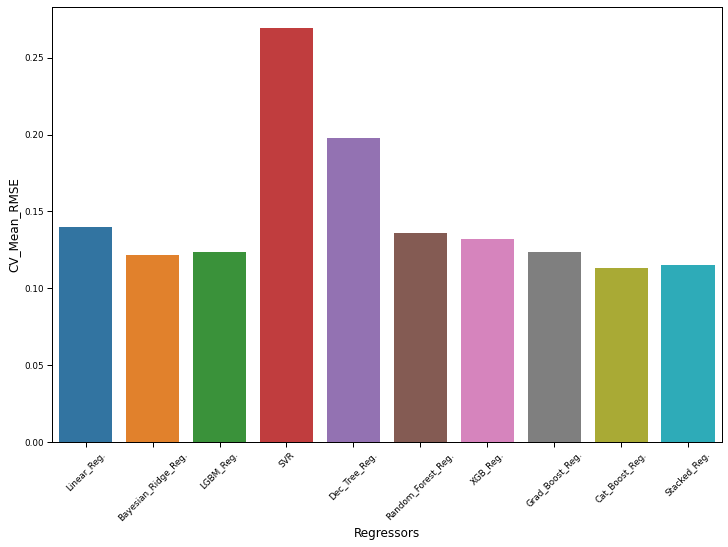

In [48]:
plt.figure(figsize = (12,8))
sns.barplot(final_cv_score['Regressors'],final_cv_score['RMSE_mean'])
plt.xlabel('Regressors', fontsize = 12)
plt.ylabel('CV_Mean_RMSE', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

In [49]:
# Train-Test split the data

X_train,X_val,y_train,y_val = train_test_split(train,target_log,test_size = 0.1,random_state=42)

# Cat Boost Regressor

cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = 0)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [50]:
cat_pred = cat_model.predict(X_val)
cat_score = rmse(y_val, cat_pred)
cat_score

0.095326965478548

Now let's take a look at the top 20 most important variables for our model. This could give us further insight into the functioning of the algorithm and how and which data it uses most to arrive at the final prediction.

In [51]:
# Features' importance of our model

feat_imp = cat_model.get_feature_importance(prettified=True)
feat_imp

,Feature Id,Importances
0,OverallQual,15.961307
1,GrLivArea,7.052773
2,HighQualSF,6.864981
3,Total_Home_Quality,6.860706
4,TotalBsmtSF,5.270604
...,...,...
349,SaleType_CWD,0.000000
350,SaleType_Con,0.000000
351,SaleType_ConLI,0.000000
352,SaleType_VWD,0.000000


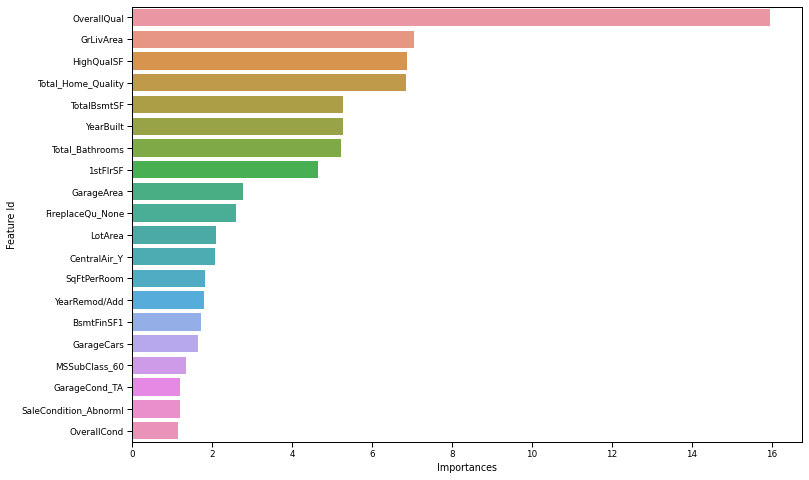

In [52]:
# Plotting top 20 features' importance

plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:20],feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [53]:
# Feature importance Interactive Plot 

train_pool = Pool(X_train)
val_pool = Pool(X_val)

explainer = shap.TreeExplainer(cat_model) # insert your model
shap_values = explainer.shap_values(train_pool) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200,:], X_train.iloc[:200,:])

# The plot represents just a slice of the Training data (200 observations)

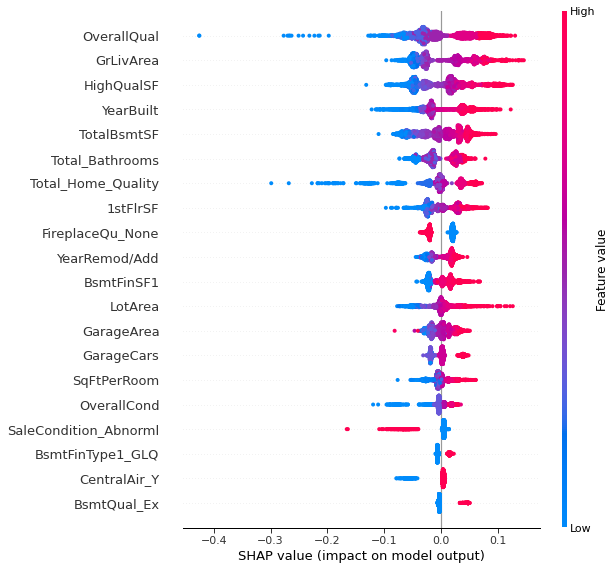

In [54]:
shap.summary_plot(shap_values, X_train)

The above diagram represents each observation (x-axis) for the feature presented (y-axis). The x location of each dot on the x-axis reflects the impact of that feature on the model's predictions, while the color of the dot represents the value of that feature for that exact observation. Dots that pile up on the line show density. Here we can see how features such as 'BsmtFinType1_GLQ' or 'BsmtQual_Ex', differently from 'GrLivArea' and 'OverallQual', do not contribute significantly in producing the final predictions.



 N.B: Catboost comes with a great method: ***get_feature_importance***. This method can be used to find important interactions among features. This is a huge advantage because it can give us insights about possible new features to create that can improve the performance.  

In [55]:
# Features' Interactions

train_data = Pool(X_train)

interaction = cat_model.get_feature_importance(train_data, type="Interaction")
column_names = X_train.columns.values 
interaction = pd.DataFrame(interaction, columns=["feature1", "feature2", "importance"])
interaction.feature1 = interaction.feature1.apply(lambda l: column_names[int(l)])
interaction.feature2 = interaction.feature2.apply(lambda l: column_names[int(l)])
interaction.head(20)

,feature1,feature2,importance
0,OverallQual,GarageArea,0.671071
1,OverallQual,GrLivArea,0.482861
2,Total_Home_Quality,HighQualSF,0.425536
3,TotalBsmtSF,HighQualSF,0.422249
4,Total_Home_Quality,Total_Bathrooms,0.371956
5,LotArea,Total_Home_Quality,0.346599
6,LotArea,YearBuilt,0.344178
7,OverallQual,BsmtFinSF1,0.342282
8,TotalBsmtSF,Neighborhood_Edwards,0.341279
9,LotArea,OverallQual,0.329355


Which are the deafult parameters used by CaboostRegressor? This is our real baseline, now we need to optimize the hyperparameters trying to tune the model to obtain a better performance.

In [56]:
# Catboost default paramters

cat_model.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'RMSE',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': True,
 'model_size_reg': 0.5,
 'subsample': 0.800000011920929,
 'use_best_model': True,
 'random_seed': 0,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'loss_function': 'RMSE',
 'learning_rate': 0.055344998836517334,
 'score_function': 'Cosine',
 'task_type': 'CPU',
 'leaf_estimation_iterations': 1,
 'bootstrap_type': 'MVS',
 'max_leave

### Hyperparameter Optimization

In [57]:
# Preforming a Random Grid Search to find the best combination of parameters

grid = {'iterations': [1000,6000],
        'learning_rate': [0.05, 0.005, 0.0005],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 9]}

final_model = CatBoostRegressor()
randomized_search_result = final_model.randomized_search(grid,
                                                   X = X_train,
                                                   y= y_train,
                                                   verbose = False,
                                                   plot=True)
                                                   

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 7.312869812
bestIteration = 999


bestTest = 7.335527218
bestIteration = 999


bestTest = 0.2238880003
bestIteration = 999


bestTest = 0.1337460046
bestIteration = 5997


bestTest = 0.1493668278
bestIteration = 5550


bestTest = 0.1760261086
bestIteration = 998


bestTest = 0.2559708205
bestIteration = 734


bestTest = 0.2598507338
bestIteration = 994


bestTest = 0.4478404227
bestIteration = 999


bestTest = 0.2399409488
bestIteration = 5997



In [58]:
# Final Cat-Boost Regressor

params = {'iterations': 6000,
          'learning_rate': 0.005,
          'depth': 4,
          'l2_leaf_reg': 1,
          'eval_metric':'RMSE',
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': 42}
         
cat_f = CatBoostRegressor(**params)
cat_model_f = cat_f.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = False)

catf_pred = cat_model_f.predict(X_val)
catf_score = rmse(y_val, catf_pred)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [59]:
catf_score

0.09369818094129492

### SUBMISSION

In [61]:
# Test CSV Submission

test_pred = cat_f.predict(test)
submission = pd.DataFrame(test_id, columns = ['Id'])
test_pred = np.expm1(test_pred)
submission['SalePrice'] = test_pred 
submission.head()

,Id,SalePrice
0,1461,119113.833599
1,1462,162308.354766
2,1463,183938.720301
3,1464,195256.950289
4,1465,187733.652959


In [62]:
# Saving the results in a csv file

submission.to_csv("result.csv", index = False, header = True)